Detailed documentation: https://www.archrproject.com/bookdown/getting-started-with-archr.html and Short tutorial: https://www.archrproject.com/articles/Articles/tutorial.html are followed. 
This is first time trying ArchR package. It includes some modifications based on the errors.
Gradient coloring on some figures are not plotted properly. 

In [ ]:
#First time installation of ArchR : https://www.archrproject.com/index.html
#devtools::install_github("GreenleafLab/ArchR", ref="master", repos = BiocManager::repositories())
#As indicated in their page, I downloaded XQuartz --https://www.xquartz.org/. It is required in the downstream analysis.


In [ ]:
library("chromVARmotifs")
library("chromVAR")
library("BSgenome.Hsapiens.UCSC.hg19")
library("ggrepel")
library("ArchR")
library("Seurat")

In [4]:
addArchRThreads(threads = 6) 
set.seed(1)

Setting default number of Parallel threads to 6.



In [5]:
#set the genome
#ArchR supports “hg19”, “hg38”, “mm9”, and “mm10” natively and you can create your own genome and gene 
#annotations using the createGeneAnnotation() and createGenomeAnnotation() functions.
addArchRGenome("hg19")

Setting default genome to Hg19.



# Chapter 1: Download input files and getting set up
For the remainder of this tutorial, data from a downsampled dataset of hematopoietic cells from Granja* et al. Nature Biotechnology 2019 will be used.This includes data from bone marrow mononuclear cells (BMMC), peripheral blood mononuclear cells (PBMC), and CD34+ hematopoietic stem and progenitor cells from bone marrow (CD34 BMMC).

In [6]:
setwd("~/Desktop/archr_tutorial/")

In [13]:
inputFiles <- getTutorialData("Hematopoiesis")
inputFiles

scATAC_BMMC_R1 
     "HemeFragments/scATAC_BMMC_R1.fragments.tsv.gz" 
                                 scATAC_CD34_BMMC_R1 
"HemeFragments/scATAC_CD34_BMMC_R1.fragments.tsv.gz" 
                                      scATAC_PBMC_R1 
     "HemeFragments/scATAC_PBMC_R1.fragments.tsv.gz"

In [26]:
addArchRGenome("hg19")

Setting default genome to Hg19.



# Creating Arrow file 

What is an arrow file? 
The base unit of an analytical project in ArchR is called an Arrow file. Each Arrow file stores all of the data associated with an individual sample (i.e. metadata, accessible fragments, and data matrices).

Arrow file is actually just a path to an external file stored on disk. More explicitly, an Arrow file is not an R-language object that is stored in memory but rather an HDF5-format file stored on disk. Because of this, we use an ArchRProject object to associate these Arrow files together into a single analytical framework that can be rapidly accessed in R. This ArchRProject object is small in size and is stored in memory.

this step will:

Read accessible fragments from the provided input files.
Calculate quality control information for each cell (i.e. TSS enrichment scores and nucleosome info).
Filter cells based on quality control parameters.(explained below) 
Create a genome-wide TileMatrix using 500-bp bins.
Create a GeneScoreMatrix using the custom geneAnnotation that was defined when we called addArchRGenome().

In [14]:
ArrowFiles <- createArrowFiles(
  inputFiles = inputFiles,
  sampleNames = names(inputFiles),
  minTSS = 4, #Dont set this too high because you can always increase later
  minFrags = 1000, 
  addTileMat = TRUE,
  addGeneScoreMat = TRUE
)

#In the tutorial, they use filterTSS and filterFrags options which are invalid. Changed it to minFrags and minTSS
#In the tutorial, they show QC metrics plots but pdf file can not be opened. 

Using GeneAnnotation set by addArchRGenome(Hg19)!

Using GeneAnnotation set by addArchRGenome(Hg19)!

ArchR logging to : ArchRLogs/ArchR-createArrows-658877f0f738-Date-2023-01-06_Time-13-55-46.log
If there is an issue, please report to github with logFile!

Cleaning Temporary Files

2023-01-06 13:55:46 : Batch Execution w/ safelapply!, 0 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-createArrows-658877f0f738-Date-2023-01-06_Time-13-55-46.log



In [15]:
head(ArrowFiles)

[1] "scATAC_BMMC_R1.arrow"      "scATAC_CD34_BMMC_R1.arrow"
[3] "scATAC_PBMC_R1.arrow"

#Quality control parameters 
QC is included in the steps for creating arrow files. 

By default in ArchR, pass-filter cells are identified as those cells having a TSS enrichment score greater than 4 and more than 1000 unique nuclear fragments. 

It is important to note that the actual numeric value of the TSS enrichment score depends on the set of TSSs used. 

The default values in ArchR were designed for human data and it may be important to change the default thresholds when running createArrowFiles().

QC of scATAC-seq data is essential to remove the contribution of low-quality cells. 
In ArchR, we consider three characteristics of data:

1. The number of unique nuclear fragments (i.e. not mapping to mitochondrial DNA).
It is straightforward - cells with very few usable fragments will not provide enough data to make useful interpretations and should therefore be excluded.

2. The signal-to-background ratio. Low signal-to-background ratio is often attributed to dead or dying cells which have de-chromatinzed DNA which allows for random transposition genome-wide.
Signal-to-background ratio is calculated as the TSS enrichment score.
The idea behind the TSS enrichment score metric is that ATAC-seq data is universally enriched at gene TSS regions compared to other genomic regions, due to large protein complexes that bind to promoters. By looking at per-basepair accessibility centered at these TSS regions, we see a local enrichment relative to flanking regions (1900-2000 bp distal in both directions). The ratio between the peak of this enrichment (centered at the TSS) relative to these flanking regions represents the TSS enrichment score.

For scATAC-seq : To accurately approximate the TSS enrichment score per single cell, we count the average accessibility within a 50-bp region centered at each single-base TSS position and divide this by the average accessibility of the TSS flanking positions (+/- 1900 – 2000 bp). This approximation was highly correlated (R > 0.99) with the original method and values were extremely close in magnitude.

3. The fragment size distribution. Due to nucleosomal periodicity, we expect to see depletion of fragments that are the length of DNA wrapped around a nucleosome (approximately 147 bp).
Fragment size distribution is generally less important but always good to manually inspect.

# Chapter 2: Doublet Inference 

A doublet refers to a single droplet that received a single barcoded bead and more than one nucleus.
To predict which “cells” are actually doublets, we synthesize in silico doublets from the data by mixing the reads from thousands of combinations of individual cells. We then project these synthetic doublets into the UMAP embedding and identify their nearest neighbor. By iterating this procedure thousands of times, we can identify “cells” in our data whose signal looks very similar to synthetic doublets.

#This is likely a good place to start but we encourage all users to inspect the pre- and post-doublet removal data to understand how doublet removal is affecting the cells.

In [16]:
doubScores <- addDoubletScores(
  input = ArrowFiles,
  k = 10, #Refers to how many cells near a "pseudo-doublet" to count.
  knnMethod = "UMAP", #Refers to the embedding to use for nearest neighbor search.
  LSIMethod = 1
)

ArchR logging to : ArchRLogs/ArchR-addDoubletScores-65886cf6bb0c-Date-2023-01-06_Time-13-55-51.log
If there is an issue, please report to github with logFile!

2023-01-06 13:55:51 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-01-06 13:55:52 : scATAC_BMMC_R1 (1 of 3) :  Computing Doublet Statistics, 0 mins elapsed.

scATAC_BMMC_R1 (1 of 3) : UMAP Projection R^2 = 0.98404

scATAC_BMMC_R1 (1 of 3) : UMAP Projection R^2 = 0.98404





2023-01-06 13:57:14 : scATAC_CD34_BMMC_R1 (2 of 3) :  Computing Doublet Statistics, 1.38 mins elapsed.

scATAC_CD34_BMMC_R1 (2 of 3) : UMAP Projection R^2 = 0.9927

scATAC_CD34_BMMC_R1 (2 of 3) : UMAP Projection R^2 = 0.9927





2023-01-06 13:58:17 : scATAC_PBMC_R1 (3 of 3) :  Computing Doublet Statistics, 2.428 mins elapsed.

scATAC_PBMC_R1 (3 of 3) : UMAP Projection R^2 = 0.98207

scATAC_PBMC_R1 (3 of 3) : UMAP Projection R^2 = 0.98207





ArchR logging successful to : ArchRLogs/ArchR-addDoubletScores-65886cf6bb0c-Date-2023-01-06_Time-13-55-51.l

Adding doublet scores will create plots in the “QualityControl” directory. There are 3 plots associated with each of your samples in this folder:

1. Doublet Enrichments - These represent the enrichment of simulated doublets nearby each single cell compared to the expected if we assume a uniform distribution.

2. Doublet Scores - These represent the significance (-log10(binomial adjusted p-value)) of simulated doublets nearby each single cell compared to the expected if we assume a uniform distribution. We have found this value to be less consistent than the doublet enrichments and therefore use doublet enrichments for doublet identification.

3. Doublet Density - This represents the density of the simulated doublet projections. This allows you to visualize where the synthetic doublets were located after projection into your 2-dimensional embedding.

# Chapter 3: Create ArchRProject 

An ArchRProject allows us to group multiple Arrow files together into a single project. This ArchRProject is small and is stored in memory. By interacting with the ArchRProject we can rapidly push and pull data from the Arrow files.
ArchRProject objects can be saved and re-loaded at a later date, providing continuity of analyses and facilitating sharing of analytical projects across collaborators

In [19]:
projHeme1 <- ArchRProject(
  ArrowFiles = ArrowFiles, 
  outputDirectory = "HemeTutorial",
  copyArrows = TRUE #This is recommened so that you maintain an unaltered copy for later usage.
)

Using GeneAnnotation set by addArchRGenome(Hg19)!

Using GeneAnnotation set by addArchRGenome(Hg19)!

Validating Arrows...

Getting SampleNames...



Copying ArrowFiles to Ouptut Directory! If you want to save disk space set copyArrows = FALSE

1 
2 
3 


Getting Cell Metadata...



Merging Cell Metadata...

Initializing ArchRProject...


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--'

In [20]:
paste0("Memory Size = ", round(object.size(projHeme1) / 10^6, 3), " MB")


[1] "Memory Size = 37.477 MB"

In [21]:
projHeme1


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 10660
medianTSS(1): 16.815
medianFrags(1): 3049.5

In [22]:
getAvailableMatrices(projHeme1)

[1] "GeneScoreMatrix" "TileMatrix"

#  Filtering Doublets from an ArchRProject

After we have added information on the predicted doublets using addDoubletScores(), we can remove these predicted doublets using filterDoublets(). 

One of the key elements of this filtering step is the filterRatio which is the maximum ratio of predicted doublets to filter based on the number of pass-filter cells.

This filterRatio allows you to apply a consistent filter across multiple different samples that may have different percentages of doublets because they were run with different cell loading concentrations. The higher the filterRatio, the greater the number of cells potentially removed as doublets.

In [50]:
projHeme2 <- filterDoublets(projHeme1) 

#If you wanted to filter more cells from the ArchR Project, you would use a higher filterRatio

Filtering 410 cells from ArchRProject!

	scATAC_BMMC_R1 : 243 of 4932 (4.9%)

	scATAC_CD34_BMMC_R1 : 107 of 3275 (3.3%)

	scATAC_PBMC_R1 : 60 of 2453 (2.4%)



In [51]:
projHeme2 
#ProjHeme1 used to have 10660 cells. After filtering doublets, it has 10250 cells.


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(17): Sample TSSEnrichment ... bioNames bioNames2
numberOfCells(1): 10250
medianTSS(1): 16.815
medianFrags(1): 2992

# Chapter 4: Dimension reduction

This approach computes an inital LSI transformation on the most accessible tiles and identifies lower resolution clusters that are not batch confounded.

Then ArchR computes the average accessibility for each of these clusters across all features. ArchR then identifies the most variable peaks across these clusters and uses these features for LSI again. 

In this second iteration, the most variable peaks are more similar to the variable genes used in scRNA-seq LSI implementations. The user can set how many iterations of LSI should be performed. We have found this approach to minimize observed batch effects and allow dimensionality reduction operations on a more reasonably sized feature matrix.

##It is important to note that LSI is not deterministic. 

This means that even if you run LSI in exactly the same way with exactly the same parameters, you will not get exactly the same results. Of course, they will be highly similar, but not identical. So make sure to save your ArchRProject or the relevant LSI information once you’ve settled on an ideal dimensionality reduction.

In [52]:
projHeme2 <- addIterativeLSI(
    ArchRProj = projHeme2,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI", 
    iterations = 2, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(0.2), 
        sampleCells = 10000, 
        n.start = 10
    ), 
    varFeatures = 25000, 
    dimsToUse = 1:30
)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-65887f3c87ff-Date-2023-01-06_Time-16-58-21.log
If there is an issue, please report to github with logFile!

2023-01-06 16:58:21 : Computing Total Across All Features, 0.001 mins elapsed.

2023-01-06 16:58:22 : Computing Top Features, 0.019 mins elapsed.

###########
2023-01-06 16:58:23 : Running LSI (1 of 2) on Top Features, 0.033 mins elapsed.
###########

2023-01-06 16:58:23 : Sampling Cells (N = 10001) for Estimated LSI, 0.034 mins elapsed.

2023-01-06 16:58:23 : Creating Sampled Partial Matrix, 0.034 mins elapsed.

2023-01-06 16:58:27 : Computing Estimated LSI (projectAll = FALSE), 0.108 mins elapsed.

2023-01-06 16:58:47 : Identifying Clusters, 0.44 mins elapsed.

2023-01-06 16:59:04 : Identified 6 Clusters, 0.718 mins elapsed.

2023-01-06 16:59:04 : Saving LSI Iteration, 0.718 mins elapsed.

Warning message:
“package ‘uwot’ was built under R version 4.1.2”
2023-01-06 16:59:18 : Creating Cluster Matrix on the t

If you see downstream that you have subtle batch effects, another option is to add more LSI iterations and to start from a lower intial clustering resolution as shown below. Additionally the number of variable features can be lowered to increase focus on the more variable features.

projHeme2 <- addIterativeLSI(
    ArchRProj = projHeme2,
    useMatrix = "TileMatrix", 
    name = "IterativeLSI2", 
    iterations = 4, 
    clusterParams = list( #See Seurat::FindClusters
        resolution = c(0.1, 0.2, 0.4), 
        sampleCells = 10000, 
        n.start = 10
    ), 
    varFeatures = 15000, 
    dimsToUse = 1:30
)

# Batch correction with Harmony (if needed)

Sometimes the iterative LSI approach isnt enough of a correction for strong batch effect differences. For this reason, ArchR implements a commonly used batch effect correction tool called Harmony which was originally designed for scRNA-seq.

Users should be aware of the caveats of batch correction for their particular application.

In [53]:
projHeme2 <- addHarmony(
    ArchRProj = projHeme2,
    reducedDims = "IterativeLSI",
    name = "Harmony",
    groupBy = "Sample"
)

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



# Chapter 5: Clustering 

Most single-cell clustering methods focus on computing nearest neighbor graphs in reduced dimensions and then identifying “communities” or clusters of cells. These approaches work extremely well and are a standard practice in scRNA-seq. For this reason, ArchR uses existing state-of-the-art clustering methods from scRNA-seq packages for clustering.

ArchR cluster cells using graph clustering approach embedded in Seurat

In [54]:
projHeme2 <- addClusters(
    input = projHeme2,
    reducedDims = "IterativeLSI",
    method = "Seurat",
    name = "Clusters",
    resolution = 0.8
)

ArchR logging to : ArchRLogs/ArchR-addClusters-65885df4a925-Date-2023-01-06_Time-17-07-56.log
If there is an issue, please report to github with logFile!

2023-01-06 17:07:56 : Running Seurats FindClusters (Stuart et al. Cell 2019), 0.001 mins elapsed.

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 10250
Number of edges: 456227

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8670
Number of communities: 12
Elapsed time: 1 seconds


2023-01-06 17:08:13 : Testing Outlier Clusters, 0.284 mins elapsed.

2023-01-06 17:08:13 : Assigning Cluster Names to 12 Clusters, 0.284 mins elapsed.

2023-01-06 17:08:13 : Finished addClusters, 0.285 mins elapsed.



In [55]:
head(projHeme2$Clusters)


[1] "C9"  "C6"  "C10" "C10" "C10" "C4"

In [56]:
#Print number of cells in each cluster
table(projHeme2$Clusters) 


  C1  C10  C11  C12   C2   C3   C4   C5   C6   C7   C8   C9 
1454  357  307  385 1116  899 1140 1389 1242  815  726  420 

In [57]:
#Print distribution of samples in each cluster 
cM <- confusionMatrix(paste0(projHeme2$Clusters), paste0(projHeme2$Sample))
cM

12 x 3 sparse Matrix of class "dgCMatrix"
    scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
C9             251                   5            164
C6            1193                   .             49
C10            357                   .              .
C4             340                 799              1
C1            1423                   4             27
C3             229                 659             11
C7             113                   1            701
C5             136                1253              .
C11            148                 149             10
C8             304                   .            422
C2             107                   1           1008
C12             88                 297              .

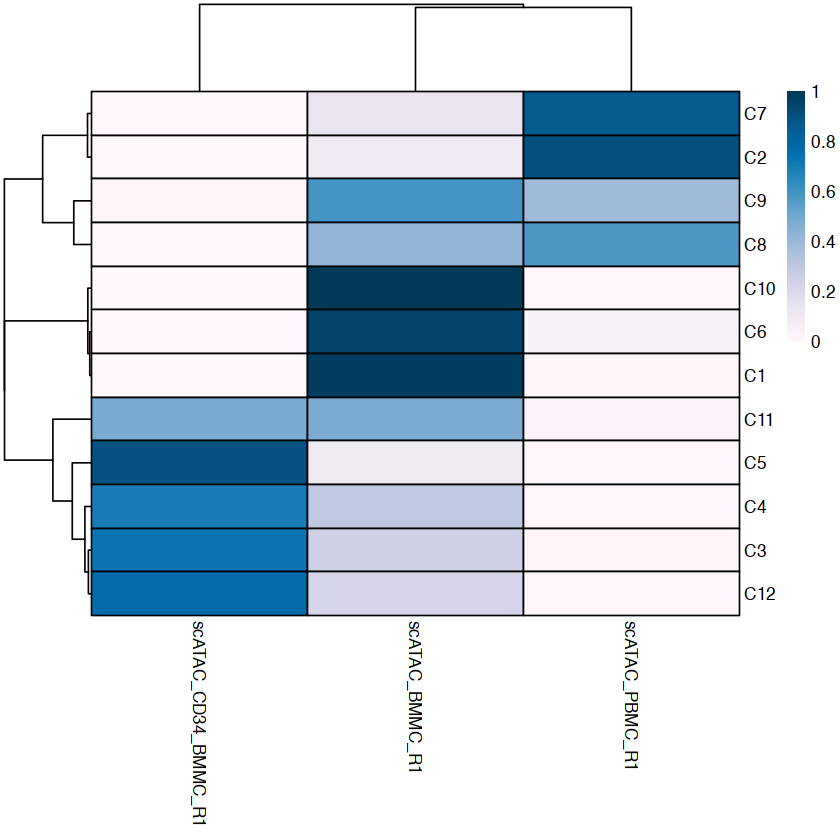

In [59]:
library(pheatmap)
cM <- cM / Matrix::rowSums(cM)
p <- pheatmap::pheatmap(
    mat = as.matrix(cM), 
    color = paletteContinuous("whiteBlue"), 
    border_color = "black"
)

p

#ArchR also provides option for clustering with scran
projHeme2 <- addClusters(
    input = projHeme2,
    reducedDims = "IterativeLSI",
    method = "scran",
    name = "ScranClusters",
    k = 15
)

# Chapter 6: UMAP and tSNE plotting

In [61]:
projHeme2 <- addUMAP(
    ArchRProj = projHeme2, 
    reducedDims = "IterativeLSI", 
    name = "UMAP", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine"
)

17:14:08 UMAP embedding parameters a = 0.583 b = 1.334

17:14:08 Read 10250 rows and found 30 numeric columns

17:14:08 Using Annoy for neighbor search, n_neighbors = 30

17:14:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:14:08 Writing NN index file to temp file /var/folders/x2/zwp2s_ns3pj8740fxjbvwtnh0000gn/T//RtmpCaLaje/file658816798de3

17:14:08 Searching Annoy index using 4 threads, search_k = 3000

17:14:09 Annoy recall = 100%

17:14:10 Commencing smooth kNN distance calibration using 4 threads
 with target n_neighbors = 30

17:14:10 Initializing from normalized Laplacian + noise (using irlba)

17:14:10 Commencing optimization for 200 epochs, with 467090 positive edges

17:14:17 Optimization finished

17:14:17 Creating temp model dir /var/folders/x2/zwp2s

Plotting Ggplot!

Plotting Ggplot!



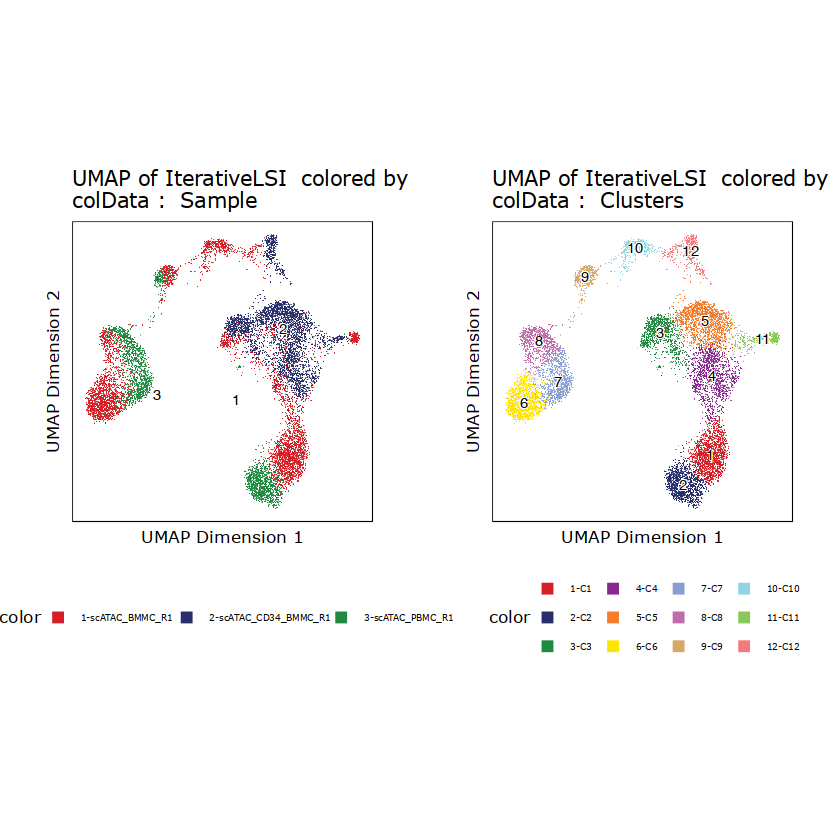

In [64]:
#color by sample
p1 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Sample", embedding = "UMAP")
#color by clusters
p2 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Clusters", embedding = "UMAP")
ggAlignPlots(p1, p2, type = "h")
plotPDF(p1,p2, name = "Plot-UMAP-Sample-Clusters.pdf", ArchRProj = projHeme2, addDOC = FALSE, width = 5, height = 5)


In [65]:
projHeme2 <- addTSNE(
    ArchRProj = projHeme2, 
    reducedDims = "IterativeLSI", 
    name = "TSNE", 
    perplexity = 30
)

Warning message:
“package ‘Rtsne’ was built under R version 4.1.2”


Read the 10250 x 30 data matrix successfully!
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 10000 of 10250
Done in 1.95 seconds (sparsity = 0.013333)!
Learning embedding...
Iteration 50: error is 96.122532 (50 iterations in 1.10 seconds)
Iteration 100: error is 84.178005 (50 iterations in 1.06 seconds)
Iteration 150: error is 81.334859 (50 iterations in 0.91 seconds)
Iteration 200: error is 80.811090 (50 iterations in 0.97 seconds)
Iteration 250: error is 80.599846 (50 iterations in 1.02 seconds)
Iteration 300: error is 3.278301 (50 iterations in 0.95 seconds)
Iteration 350: error is 3.012562 (50 iterations in 0.83 seconds)
Iteration 400: error is 2.869537 (50 iterations in 0.81 seconds)
Iteration 450: error is 2.780284 (50 iterations in 0.80 seconds)
Iteration 500: error is 2.717616 (50 iterations in 0.81 seconds)
Iteration 550: error is 2.671163 (50 iterations in 0.82 seconds)
Iteration 600: error is 2.634951

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-6588329a2dcd-Date-2023-01-06_Time-17-17-51.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-6588329a2dcd-Date-2023-01-06_Time-17-17-51.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-6588283507af-Date-2023-01-06_Time-17-17-51.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-6588283507af-Date-2023-01-06_Time-17-17-51.log

Plotting Ggplot!

Plotting Ggplot!



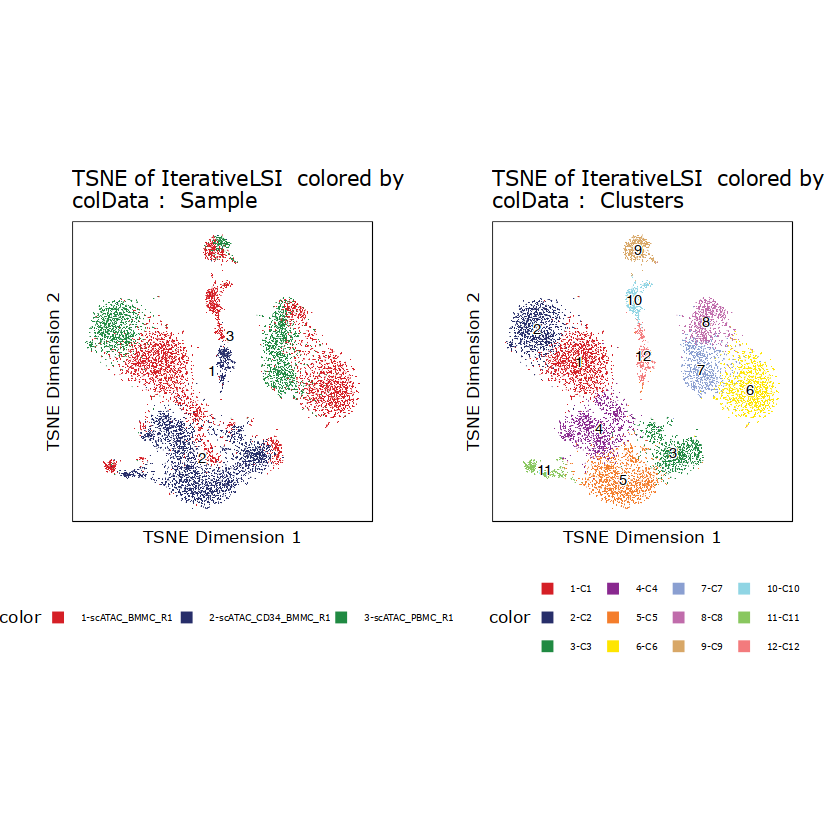

In [66]:
#color by sample
p1 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Sample", embedding = "TSNE")
#color by clusters
p2 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Clusters", embedding = "TSNE")
ggAlignPlots(p1, p2, type = "h")
plotPDF(p1,p2, name = "Plot-TSNE-Sample-Clusters.pdf", ArchRProj = projHeme2, addDOC = FALSE, width = 5, height = 5)


# UMAP and tSNE after Harmony (if needed)

In [ ]:
projHeme2 <- addUMAP(
    ArchRProj = projHeme2, 
    reducedDims = "Harmony", #this time Harmony reducedDims is used 
    name = "UMAPHarmony", 
    nNeighbors = 30, 
    minDist = 0.5, 
    metric = "cosine"
)

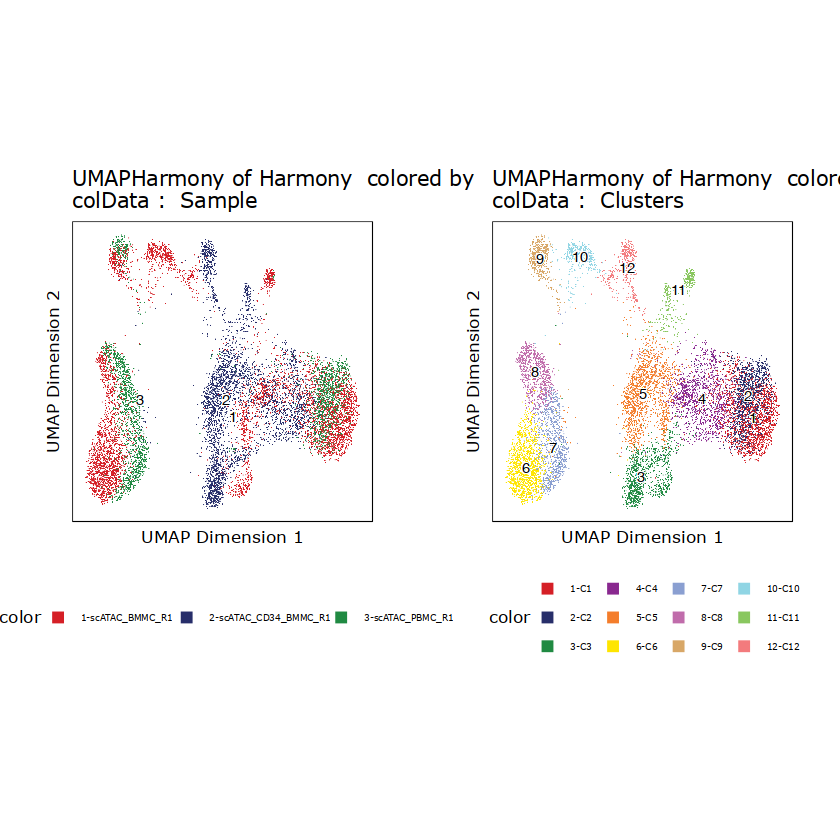

In [69]:
p3 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Sample", embedding = "UMAPHarmony")
p4 <- plotEmbedding(ArchRProj = projHeme2, colorBy = "cellColData", name = "Clusters", embedding = "UMAPHarmony")
ggAlignPlots(p3, p4, type = "h")


# Chapter 7: Gene scores and Marker gene identification 

While ArchR is able to robustly call clusters, it is not possible to know a priori which cell type is represented by each cluster. This task is often left to manual annotation because every application is different.

We use prior knowledge of cell type-specific marker genes and we estimate gene expression for these genes from our chromatin accessibility data by uing gene scores. 

A gene score is essentially a prediction of how highly expressed a gene will be based on the accessibility of regulatory elements in the vicinity of the gene. 

Three major components of gene score: 

1. Accessibility within the entire gene body contributes to the gene score.

2. An exponential weighting function that accounts for the activity of putative distal regulatory elements in a distance-dependent fashion.

3. Imposed gene boundaries that minimizes the contribution of unrelated regulatory elements to the gene score.

# Identification of marker genes 

#This part took a lot of memory and crashed out

ArchR enables unbiased identification of marker features for any given cell groupings (for example, clusters). 
These features can be anything - peaks, genes (based on gene scores), or transcription factor motifs (based on chromVAR deviations). 
ArchR does this using the getMarkerFeatures() function which can take as input any matrix via the useMatrix parameter and it identifies features unique to the groups indicated by the groupBy parameter. If the useMatrix parameter is set to “GeneScoreMatrix”, then the function will identify the genes that appear to be uniquely active in each cell type. This provides an unbiased way of seeing which genes are predicted to be active in each cluster and can aid in cluster annotation.

To identify marker genes based on gene scores, we call the getMarkerFeatures() function with useMatrix = "GeneScoreMatrix". We specify that we want to know the cluster-specific features with groupBy = "Clusters" which tells ArchR to use the “Clusters” column in cellColData to stratify cell groups.

In [75]:
#markersGS <- getMarkerFeatures(
#    ArchRProj = projHeme2, 
#    useMatrix = "GeneScoreMatrix", 
#    groupBy = "Clusters",
#    bias = c("TSSEnrichment", "log10(nFrags)"),
#    testMethod = "wilcoxon"
#)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-65881986a86c-Date-2023-01-06_Time-18-02-21.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Double.Matrix

2023-01-06 18:02:21 : Matching Known Biases, 0.001 mins elapsed.

Warning message in mclapply(..., mc.cores = threads, mc.preschedule = preschedule):
“12 function calls resulted in an error”


In [6]:
ArchR::installExtraPackages()

Installing presto..


'getOption("repos")' replaces Bioconductor standard repositories, see
'?repositories' for details

replacement repositories:
    CRAN: https://cran.r-project.org




cli (3.5.0 -> 3.6.0) [CRAN]


Installing 1 packages: cli




  There is a binary version available but the source version is later:
    binary source needs_compilation
cli  3.5.0  3.6.0              TRUE



installing the source package ‘cli’




✔  checking for file ‘/private/var/folders/x2/zwp2s_ns3pj8740fxjbvwtnh0000gn/T/RtmpPzKZq9/remotes8ca57000e064/immunogenomics-presto-045390a/DESCRIPTION’
─  preparing ‘presto’:
✔  checking DESCRIPTION meta-information
─  cleaning src
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
─  building ‘presto_1.0.0.tar.gz’
   


Installing rhandsontable..




The downloaded binary packages are in
	/var/folders/x2/zwp2s_ns3pj8740fxjbvwtnh0000gn/T//RtmpPzKZq9/downloaded_packages


Installing shinythemes..




The downloaded binary packages are in
	/var/folders/x2/zwp2s_ns3pj8740fxjbvwtnh0000gn/T//RtmpPzKZq9/downloaded_packages


# Marker Genes Imputation with MAGIC 

In [ ]:
#the coloring is off. sth is not working properly 

In [85]:
projHeme2 <- addImputeWeights(projHeme2)


ArchR logging to : ArchRLogs/ArchR-addImputeWeights-6588792e3e73-Date-2023-01-06_Time-18-12-48.log
If there is an issue, please report to github with logFile!

2023-01-06 18:12:48 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [11]:
markerGenes  <- c(
    "CD34",  #Early Progenitor
    "GATA1", #Erythroid
    "PAX5", "MS4A1", "MME", #B-Cell Trajectory
    "CD14", "MPO", #Monocytes
    "CD3D", "CD8A"#TCells
  )
p <- plotEmbedding(
    ArchRProj = projHeme2, 
    colorBy = "GeneScoreMatrix", 
    name = markerGenes, 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(projHeme2)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8ca54582a46f-Date-2023-01-09_Time-10-37-46.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2023-01-09 10:37:46 : 

1 
2 
3 


Imputing Matrix

Using weights on disk

1 of 2

2 of 2

Using weights on disk

1 of 2

2 of 2

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8ca54582a46f-Date-2023-01-09_Time-10-37-46.log



In [12]:
p$CD34 #coloring is off. sth is not working properly, prob need to install another packge 

In [14]:
#Rearrange for grid plotting
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

# Track Plotting with ArchRBrowser

In [89]:
p <- plotBrowserTrack(
    ArchRProj = projHeme2, 
    groupBy = "Clusters", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-65887966fe12-Date-2023-01-06_Time-18-14-41.log
If there is an issue, please report to github with logFile!

2023-01-06 18:14:42 : Validating Region, 0.001 mins elapsed.



GRanges object with 9 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr1 208059883-208084683      - |         947        CD34
  [2]     chrX   48644982-48652717      + |        2623       GATA1
  [3]     chr9   36838531-37034476      - |        5079        PAX5
  [4]    chr11   60223282-60238225      + |         931       MS4A1
  [5]     chr3 154741913-154901518      + |        4311         MME
  [6]     chr5 140011313-140013286      - |         929        CD14
  [7]    chr17   56347217-56358296      - |        4353         MPO
  [8]    chr11 118209789-118213459      - |         915        CD3D
  [9]     chr2   87011728-87035519      - |         925        CD8A
  -------
  seqinfo: 24 sequences from hg19 genome


2023-01-06 18:14:42 : Adding Bulk Tracks (1 of 9), 0.002 mins elapsed.

2023-01-06 18:14:42 : Adding Gene Tracks (1 of 9), 0.01 mins elapsed.

Warning message:
“package ‘ggrepel’ was built under R version 4.1.2”
2023-01-06 18:14:42 : Plotting, 0.013 mins elapsed.

2023-01-06 18:14:43 : Adding Bulk Tracks (2 of 9), 0.027 mins elapsed.

2023-01-06 18:14:43 : Adding Gene Tracks (2 of 9), 0.032 mins elapsed.

2023-01-06 18:14:44 : Plotting, 0.035 mins elapsed.

2023-01-06 18:14:44 : Adding Bulk Tracks (3 of 9), 0.047 mins elapsed.

2023-01-06 18:14:45 : Adding Gene Tracks (3 of 9), 0.052 mins elapsed.

2023-01-06 18:14:45 : Plotting, 0.055 mins elapsed.

2023-01-06 18:14:46 : Adding Bulk Tracks (4 of 9), 0.068 mins elapsed.

2023-01-06 18:14:46 : Adding Gene Tracks (4 of 9), 0.078 mins elapsed.

2023-01-06 18:14:46 : Plotting, 0.08 mins elapsed.

2023-01-06 18:14:47 : Adding Bulk Tracks (5 of 9), 0.09 mins elapsed.

2023-01-06 18:14:47 : Adding Gene Tracks (5 of 9), 0.096 mins elapsed.

20

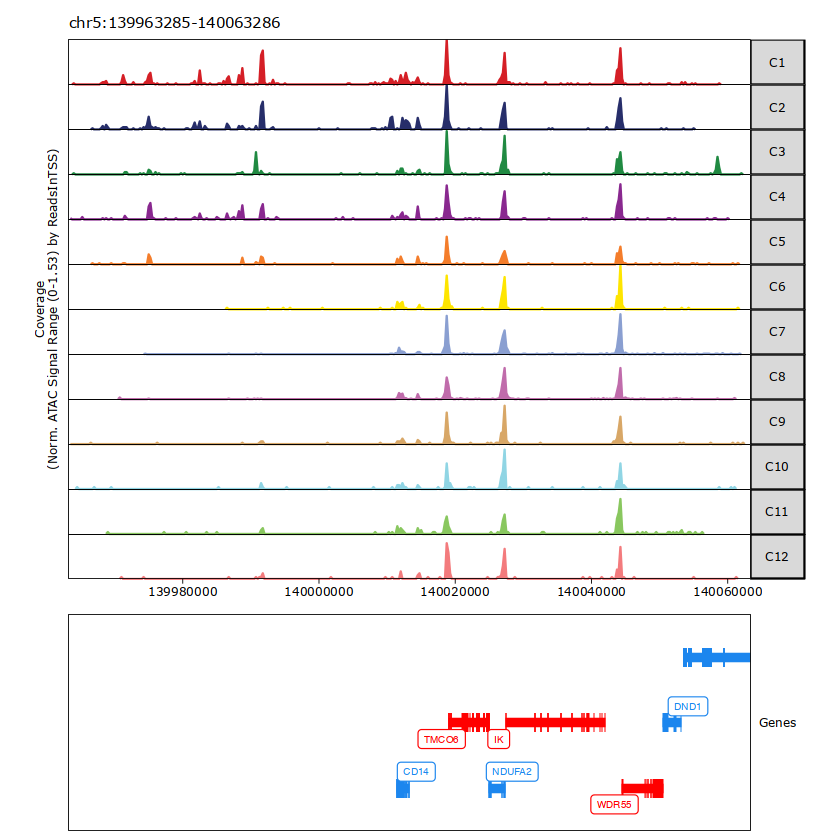

In [90]:
grid::grid.newpage()
grid::grid.draw(p$CD14)

In [92]:
plotPDF(plotList = p, 
    name = "Plot-Tracks-Marker-Genes.pdf", 
    ArchRProj = projHeme2, 
    addDOC = FALSE, width = 5, height = 5) #successfully saved

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


# Chapter 8: Cluster annotation with matched scRNAseq data 

The way this integration works is by directly aligning cells from scATAC-seq with cells from scRNA-seq by comparing the scATAC-seq gene score matrix with the scRNA-seq gene expression matrix. 
Under the hood, this alignment is performed using the FindTransferAnchors() function from the Seurat package which allows you to align data across two datasets.

In [93]:
#Upload scRNA-seq data of hematopoietic cell types from Granja* et al (2019).
if(!file.exists("scRNA-Hematopoiesis-Granja-2019.rds")){
    download.file(
        url = "https://jeffgranja.s3.amazonaws.com/ArchR/TestData/scRNA-Hematopoiesis-Granja-2019.rds",
        destfile = "scRNA-Hematopoiesis-Granja-2019.rds"
    )
}

seRNA <- readRDS("scRNA-Hematopoiesis-Granja-2019.rds")
seRNA

class: RangedSummarizedExperiment 
dim: 20287 35582 
metadata(0):
assays(1): counts
rownames(20287): FAM138A OR4F5 ... S100B PRMT2
rowData names(3): gene_name gene_id exonLength
colnames(35582): CD34_32_R5:AAACCTGAGTATCGAA-1
  CD34_32_R5:AAACCTGAGTCGTTTG-1 ...
  BMMC_10x_GREENLEAF_REP2:TTTGTTGCATGTGTCA-1
  BMMC_10x_GREENLEAF_REP2:TTTGTTGCATTGAAAG-1
colData names(10): Group nUMI_pre ... BioClassification Barcode

In [94]:
colnames(colData(seRNA))


[1] "Group"             "nUMI_pre"          "nUMI"             
 [4] "nGene"             "initialClusters"   "UMAP1"            
 [7] "UMAP2"             "Clusters"          "BioClassification"
[10] "Barcode"

In [95]:
table(colData(seRNA)$BioClassification)



        01_HSC 02_Early.Eryth  03_Late.Eryth  04_Early.Baso    05_CMP.LMPP 
          1425           1653            446            111           2260 
      06_CLP.1         07_GMP    08_GMP.Neut         09_pDC         10_cDC 
           903           2097           1050            544            325 
11_CD14.Mono.1 12_CD14.Mono.2   13_CD16.Mono         14_Unk       15_CLP.2 
          1800           4222            292            520            377 
      16_Pre.B           17_B      18_Plasma       19_CD8.N      20_CD4.N1 
           710           1711             62           1521           2470 
     21_CD4.N2       22_CD4.M      23_CD8.EM      24_CD8.CM          25_NK 
          2364           3539            796           2080           2143 
        26_Unk 
           161 

# 8.1. Cross-platform linkage of scATAC-seq cells with scRNA-seq cells

There are 2 ways of integration: 1. Unconstrained and 2. Constrained 

1. Unconstrained integration: that would take all of the cells in your scATAC-seq experiment and attempt to align them to any of the cells in the scRNA-seq experiment. 

2. Constrained integration: we use prior knowledge of the cell types to limit the search space of the alignment. 

For example, if we knew that Clusters A, B, and C in the scATAC-seq data corresponded to 3 different T cell clusters, and we knew that Clusters X and Y in the scRNA-seq data corresponded to 2 different T cell clusters, we could tell ArchR to specifically try to align cells from scATAC-seq Clusters A, B, and C to cell from scRNA-seq clusters X and Y.

In [96]:
# Unconstrained integration 
projHeme2 <- addGeneIntegrationMatrix(
    ArchRProj = projHeme2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = FALSE, #we dont save this integration to Arrow file
    groupRNA = "BioClassification",
    nameCell = "predictedCell_Un",
    nameGroup = "predictedGroup_Un",
    nameScore = "predictedScore_Un"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-65883a57e397-Date-2023-01-06_Time-18-52-43.log
If there is an issue, please report to github with logFile!

2023-01-06 18:52:43 : Running Seurat's Integration Stuart* et al 2019, 0.001 mins elapsed.

2023-01-06 18:52:44 : Checking ATAC Input, 0.004 mins elapsed.

2023-01-06 18:52:44 : Checking RNA Input, 0.006 mins elapsed.

2023-01-06 18:52:49 : Found 18601 overlapping gene names from gene scores and rna matrix!, 0.098 mins elapsed.

2023-01-06 18:52:49 : Creating Integration Blocks, 0.098 mins elapsed.

2023-01-06 18:52:49 : Prepping Interation Data, 0.102 mins elapsed.

2023-01-06 18:52:50 : Computing Integration in 1 Integration Blocks!, 0 mins elapsed.

2023-01-06 18:52:50 : Block (1 of 1) : Computing Integration, 0 mins elapsed.

2023-01-06 18:52:52 : Block (1 of 1) : Identifying Variable Genes, 0.03 mins elapsed.

2023-01-06 18:52:53 : Block (1 of 1) : Getting GeneScoreMatrix, 0.058 mins elapsed.

2023-01-06 18:52:57 : 

#Constrained integration
Given that this tutorial data is from hematopoietic cells, we would ideally constrain the integration to associate similar cell types togther. First, we will identify which cell types from the scRNA-seq data are most abundant in each of our scATAC-seq clusters. The goal of this is to identify the cells in both the scATAC-seq and scRNA-seq data that correspond to T cells and NK cells using the unconstrained integration so that we can perform a constrained integration using this information. 

In [97]:
#we will first create a confusionMatrix that looks at the intersection of Clusters and predictedGroup_Un 
#which contains the cell types as identified by scRNA-seq.
cM <- as.matrix(confusionMatrix(projHeme2$Clusters, projHeme2$predictedGroup_Un))
preClust <- colnames(cM)[apply(cM, 1 , which.max)]
cbind(preClust, rownames(cM)) #Assignments

preClust,
17_B,C9
20_CD4.N1,C6
16_Pre.B,C10
08_GMP.Neut,C4
11_CD14.Mono.1,C1
03_Late.Eryth,C3
22_CD4.M,C7
01_HSC,C5
09_pDC,C11
25_NK,C8


In [98]:
unique(unique(projHeme2$predictedGroup_Un))


[1] "08_GMP.Neut"    "22_CD4.M"       "16_Pre.B"       "06_CLP.1"      
 [5] "25_NK"          "12_CD14.Mono.2" "11_CD14.Mono.1" "07_GMP"        
 [9] "01_HSC"         "03_Late.Eryth"  "17_B"           "05_CMP.LMPP"   
[13] "09_pDC"         "20_CD4.N1"      "04_Early.Baso"  "19_CD8.N"      
[17] "02_Early.Eryth" "15_CLP.2"       "21_CD4.N2"      "13_CD16.Mono"

In [99]:
#From the above list, we can see that the clusters in the scRNA-seq data that correspond to T cells and NK cells 
#are Clusters 19-25. We will create a string-based representation of these clusters to use in the downstream 
#constrained integration.

#From scRNA
cTNK <- paste0(paste0(19:25), collapse="|")
cTNK

[1] "19|20|21|22|23|24|25"

In [101]:
#Assign scATAC to NK and T cells categories
clustTNK <- rownames(cM)[grep(cTNK, preClust)]
clustTNK

[1] "C6" "C7" "C8"

In [103]:
#RNA get cells in NK and T cells categories
rnaTNK <- colnames(seRNA)[grep(cTNK, colData(seRNA)$BioClassification)]
head(rnaTNK)

[1] "PBMC_10x_GREENLEAF_REP1:AAACCCAGTCGTCATA-1"
[2] "PBMC_10x_GREENLEAF_REP1:AAACCCATCCGATGTA-1"
[3] "PBMC_10x_GREENLEAF_REP1:AAACCCATCTCAACGA-1"
[4] "PBMC_10x_GREENLEAF_REP1:AAACCCATCTCTCGAC-1"
[5] "PBMC_10x_GREENLEAF_REP1:AAACGAACAATCGTCA-1"
[6] "PBMC_10x_GREENLEAF_REP1:AAACGAACACGATTCA-1"

In [100]:
#We can then take all of the other clusters and create a string-based representation of all “Non-T cell, 
#Non-NK cell” clusters (i.e. Cluster 1 - 18).

cNonTNK <- paste0(c(paste0("0", 1:9), 10:13, 15:18), collapse="|")
cNonTNK

[1] "01|02|03|04|05|06|07|08|09|10|11|12|13|15|16|17|18"

In [102]:
#Assign scATAC to Non NK and T cells categories
clustNonTNK <- rownames(cM)[grep(cNonTNK, preClust)]
clustNonTNK

[1] "C9"  "C10" "C4"  "C1"  "C3"  "C5"  "C11" "C2"  "C12"

In [104]:
#RNA get cells in Non NK and T cells categories

rnaNonTNK <- colnames(seRNA)[grep(cNonTNK, colData(seRNA)$BioClassification)]
head(rnaNonTNK)

[1] "CD34_32_R5:AAACCTGAGTATCGAA-1" "CD34_32_R5:AAACCTGAGTCGTTTG-1"
[3] "CD34_32_R5:AAACCTGGTTCCACAA-1" "CD34_32_R5:AAACGGGAGCTTCGCG-1"
[5] "CD34_32_R5:AAACGGGAGGGAGTAA-1" "CD34_32_R5:AAACGGGAGTTACGGG-1"

To prepare for this constrained integration, we create a nested list. 
This is a SimpleList of multiple SimpleList objects, one for each group that we would like to constrain. In this example, we have two groups: one group called TNK that identifies the T cells and NK cells across the two platforms, and a second group called NonTNK that identifies the Non-T cell Non-NK cell cells across the two platforms.

In [105]:
groupList <- SimpleList(
    TNK = SimpleList(
        ATAC = projHeme2$cellNames[projHeme2$Clusters %in% clustTNK],
        RNA = rnaTNK
    ),
    NonTNK = SimpleList(
        ATAC = projHeme2$cellNames[projHeme2$Clusters %in% clustNonTNK],
        RNA = rnaNonTNK
    )    
)

In [106]:
#We pass this list to the `groupList` parameter of the `addGeneIntegrationMatrix()` function to constrain 
#our integration. 
#Note that, in this case, we are still not adding these results to the Arrow files (`addToArrow = FALSE`). 
#We recommend checking the results of the integration thoroughly against your expectations prior to 
#saving the results in the Arrow files. 
#~5 minutes
projHeme2 <- addGeneIntegrationMatrix(
    ArchRProj = projHeme2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = FALSE, 
    groupList = groupList,
    groupRNA = "BioClassification",
    nameCell = "predictedCell_Co",
    nameGroup = "predictedGroup_Co",
    nameScore = "predictedScore_Co"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-658852c8bd98-Date-2023-01-06_Time-19-46-23.log
If there is an issue, please report to github with logFile!

2023-01-06 19:46:23 : Running Seurat's Integration Stuart* et al 2019, 0.002 mins elapsed.

2023-01-06 19:46:23 : Checking ATAC Input, 0.007 mins elapsed.

2023-01-06 19:46:23 : Checking RNA Input, 0.01 mins elapsed.

2023-01-06 19:46:29 : Found 18601 overlapping gene names from gene scores and rna matrix!, 0.109 mins elapsed.

2023-01-06 19:46:29 : Creating Integration Blocks, 0.109 mins elapsed.

2023-01-06 19:46:30 : Prepping Interation Data, 0.112 mins elapsed.

2023-01-06 19:46:30 : Computing Integration in 2 Integration Blocks!, 0 mins elapsed.

2023-01-06 19:50:36 : Block (1 of 2) : Plotting Joint UMAP, 4.107 mins elapsed.

2023-01-06 19:50:55 : Block (2 of 2) : Plotting Joint UMAP, 4.425 mins elapsed.

2023-01-06 19:51:19 : Completed Integration with RNA Matrix, 4.818 mins elapsed.

ArchR logging successful to : 

In [ ]:
# Constrained integration vs unconstrained integration 

In [107]:
pal <- paletteDiscrete(values = colData(seRNA)$BioClassification)
pal

Length of unique values greater than palette, interpolating..



01_HSC 02_Early.Eryth  03_Late.Eryth  04_Early.Baso    05_CMP.LMPP 
     "#D51F26"      "#502A59"      "#235D55"      "#3D6E57"      "#8D2B8B" 
      06_CLP.1         07_GMP    08_GMP.Neut         09_pDC         10_cDC 
     "#DE6C3E"      "#F9B712"      "#D8CE42"      "#8E9ACD"      "#B774B1" 
11_CD14.Mono.1 12_CD14.Mono.2   13_CD16.Mono         14_Unk       15_CLP.2 
     "#D69FC8"      "#C7C8DE"      "#8FD3D4"      "#89C86E"      "#CC9672" 
      16_Pre.B           17_B      18_Plasma       19_CD8.N      20_CD4.N1 
     "#CF7E96"      "#A27AA4"      "#CD4F32"      "#6B977E"      "#518AA3" 
     21_CD4.N2       22_CD4.M      23_CD8.EM      24_CD8.CM          25_NK 
     "#5A5297"      "#0F707D"      "#5E2E32"      "#A95A3C"      "#B28D5C" 
        26_Unk 
     "#3D3D3D"

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-658839b66eb7-Date-2023-01-06_Time-19-59-02.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-658839b66eb7-Date-2023-01-06_Time-19-59-02.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-6588781ecdfa-Date-2023-01-06_Time-19-59-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-6588781ecdfa-Date-2023-01-06_Time-19-59-04.log



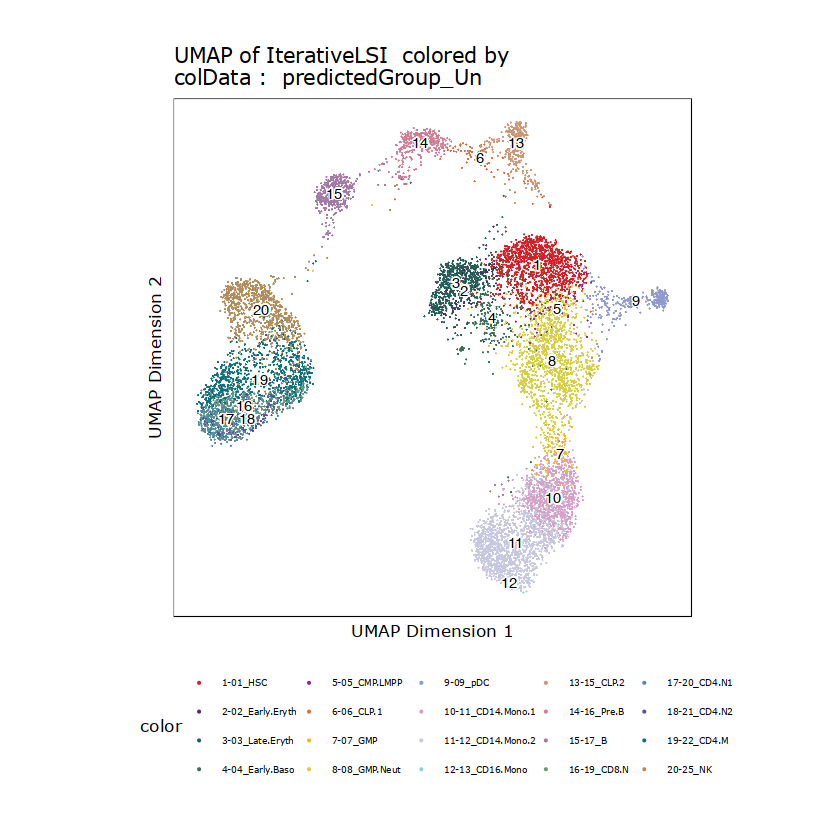

Plotting Ggplot!

Plotting Ggplot!



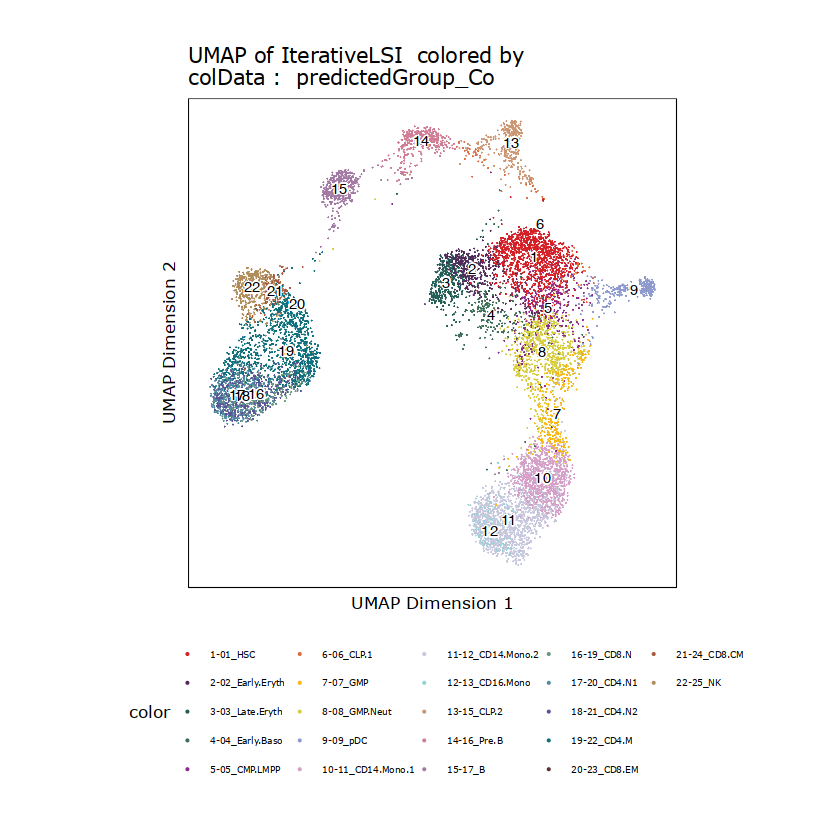

In [109]:
p1 <- plotEmbedding(
    projHeme2, 
    colorBy = "cellColData", 
    name = "predictedGroup_Un", 
    pal = pal
)
p1
p2 <- plotEmbedding(
    projHeme2, 
    colorBy = "cellColData", 
    name = "predictedGroup_Co", 
    pal = pal
)
p2
plotPDF(p1,p2, name = "Plot-UMAP-RNA-Integration.pdf", ArchRProj = projHeme2, addDOC = FALSE, width = 5, height = 5)

#The differences between these the unconstrained and constrained integration is very subtle in this example, 
#largely because the cell types of interest are already very distinct. 

In [ ]:
#Save ArchRProject 
saveArchRProject(ArchRProj = projHeme2, outputDirectory = "Save-ProjHeme2", load = FALSE)


# 8.2 Adding Pseudo-scRNA-seq profiles for each scATAC-seq cell

#Include Integration matrix to the Arrowfile. Now that we are satisfied with the results of our scATAC-seq and scRNA-seq integration, we can re-run the integration with addToArrow = TRUE to add the linked gene expression data to each of the Arrow files.

In [111]:
projHeme3 <- addGeneIntegrationMatrix(
    ArchRProj = projHeme2, 
    useMatrix = "GeneScoreMatrix",
    matrixName = "GeneIntegrationMatrix",
    reducedDims = "IterativeLSI",
    seRNA = seRNA,
    addToArrow = TRUE,
    force= TRUE,
    groupList = groupList,
    groupRNA = "BioClassification",
    nameCell = "predictedCell",
    nameGroup = "predictedGroup",
    nameScore = "predictedScore"
)

ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-658819bb5462-Date-2023-01-06_Time-20-03-37.log
If there is an issue, please report to github with logFile!

2023-01-06 20:03:38 : Running Seurat's Integration Stuart* et al 2019, 0.001 mins elapsed.

2023-01-06 20:03:38 : Checking ATAC Input, 0.006 mins elapsed.

2023-01-06 20:03:38 : Checking RNA Input, 0.008 mins elapsed.

2023-01-06 20:03:45 : Found 18601 overlapping gene names from gene scores and rna matrix!, 0.126 mins elapsed.

2023-01-06 20:03:45 : Creating Integration Blocks, 0.126 mins elapsed.

2023-01-06 20:03:45 : Prepping Interation Data, 0.129 mins elapsed.

2023-01-06 20:03:46 : Computing Integration in 2 Integration Blocks!, 0 mins elapsed.

2023-01-06 20:08:01 : Block (1 of 2) : Plotting Joint UMAP, 4.247 mins elapsed.

2023-01-06 20:08:19 : Block (2 of 2) : Plotting Joint UMAP, 4.548 mins elapsed.

2023-01-06 20:08:42 : Transferring Data to ArrowFiles, 4.943 mins elapsed.

2023-01-06 20:09:15 : Completed Int

In [112]:
getAvailableMatrices(projHeme3)


[1] "GeneIntegrationMatrix" "GeneScoreMatrix"       "TileMatrix"

In [114]:
#First, lets make sure we have added impute weights to our project:

projHeme3 <- addImputeWeights(projHeme3)

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-658816f71315-Date-2023-01-06_Time-21-11-49.log
If there is an issue, please report to github with logFile!

2023-01-06 21:11:49 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.



In [15]:
#lets make some UMAP plots overlayed with the gene expression values from our GeneIntegrationMatrix.

markerGenes  <- c(
    "CD34", #Early Progenitor
    "GATA1", #Erythroid
    "PAX5", "MS4A1", #B-Cell Trajectory
    "CD14", #Monocytes
    "CD3D", "CD8A", "TBX21", "IL7R" #TCells
  )

p1 <- plotEmbedding(
    ArchRProj = projHeme3, 
    colorBy = "GeneIntegrationMatrix", 
    name = markerGenes, 
    continuousSet = "horizonExtra",
    embedding = "UMAP",
    imputeWeights = getImputeWeights(projHeme3)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8ca51216b00f-Date-2023-01-09_Time-10-39-24.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2023-01-09 10:39:24 : 

1 
2 
3 


Imputing Matrix

Using weights on disk

1 of 2

2 of 2

Using weights on disk

1 of 2

2 of 2

Plotting Embedding

1 
2 
3 
4 
5 
6 
7 
8 
9 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8ca51216b00f-Date-2023-01-09_Time-10-39-24.log



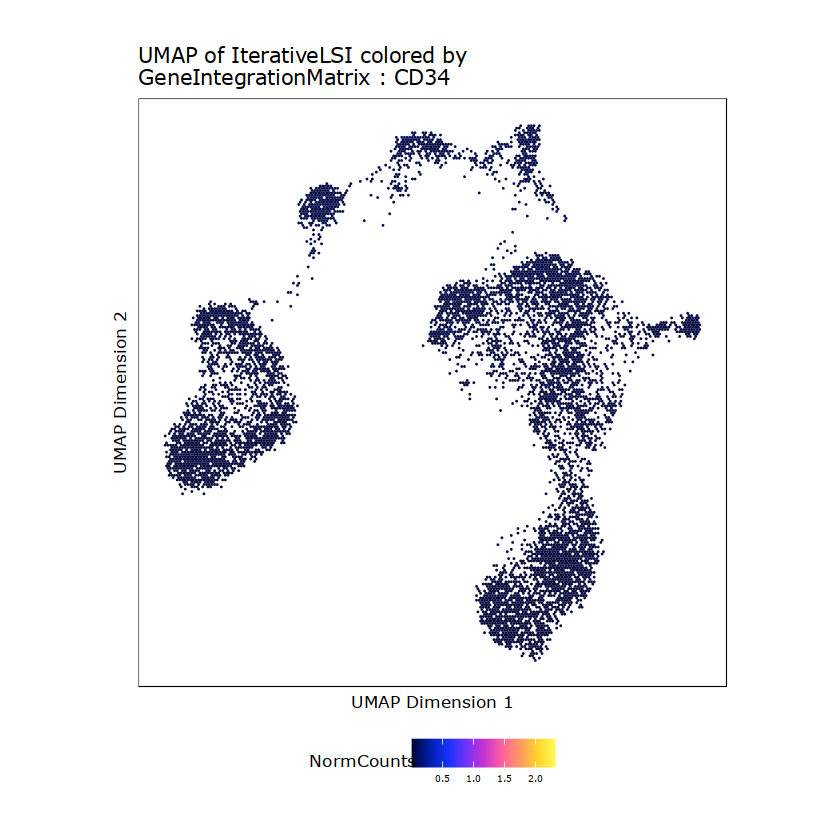

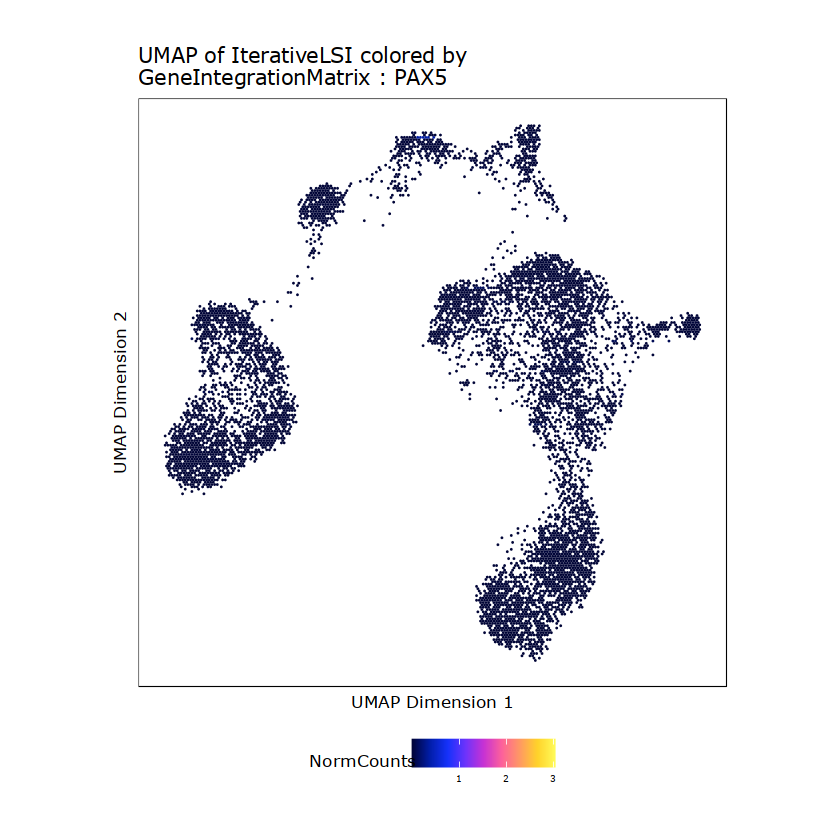

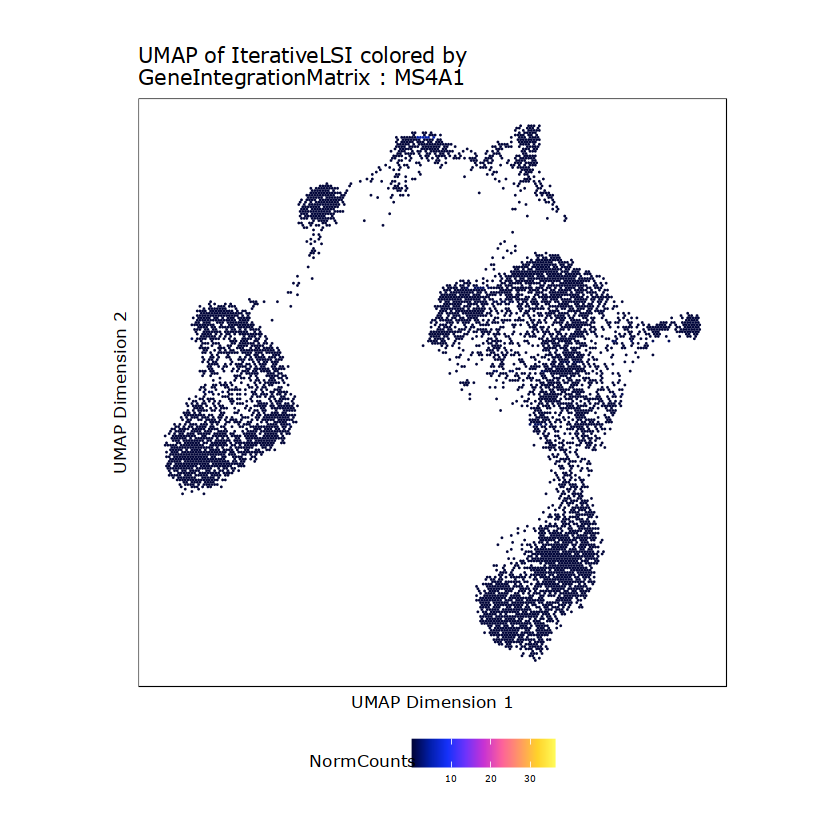

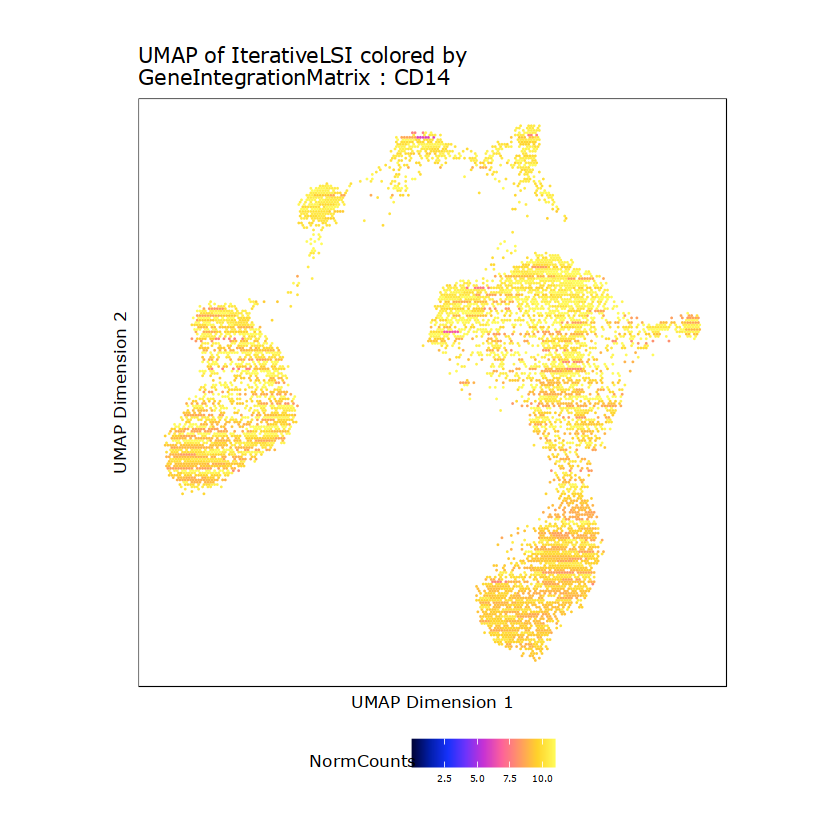

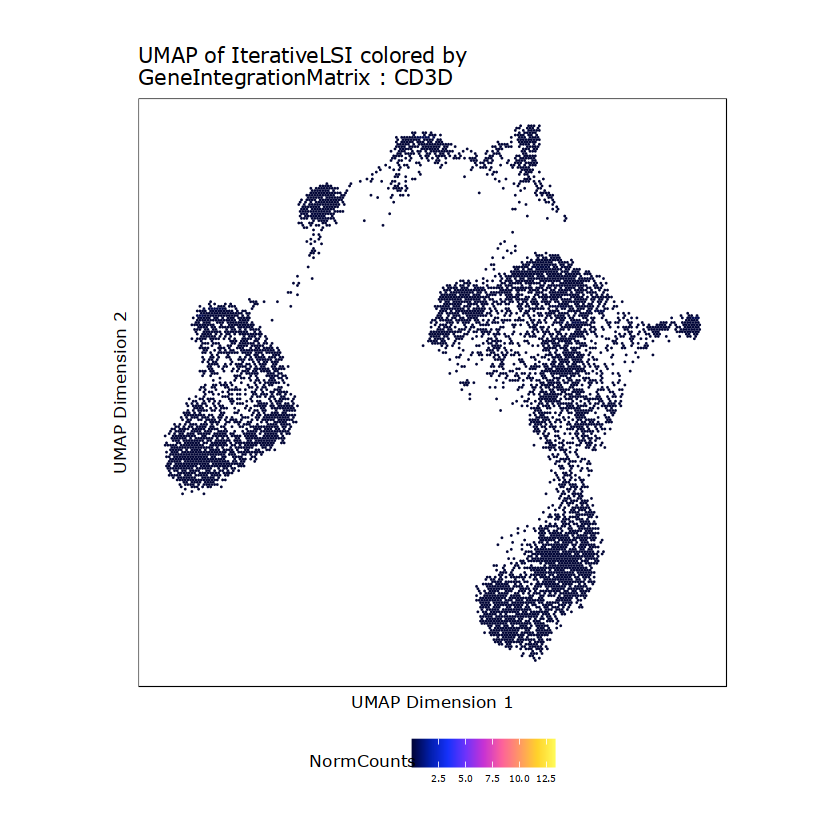

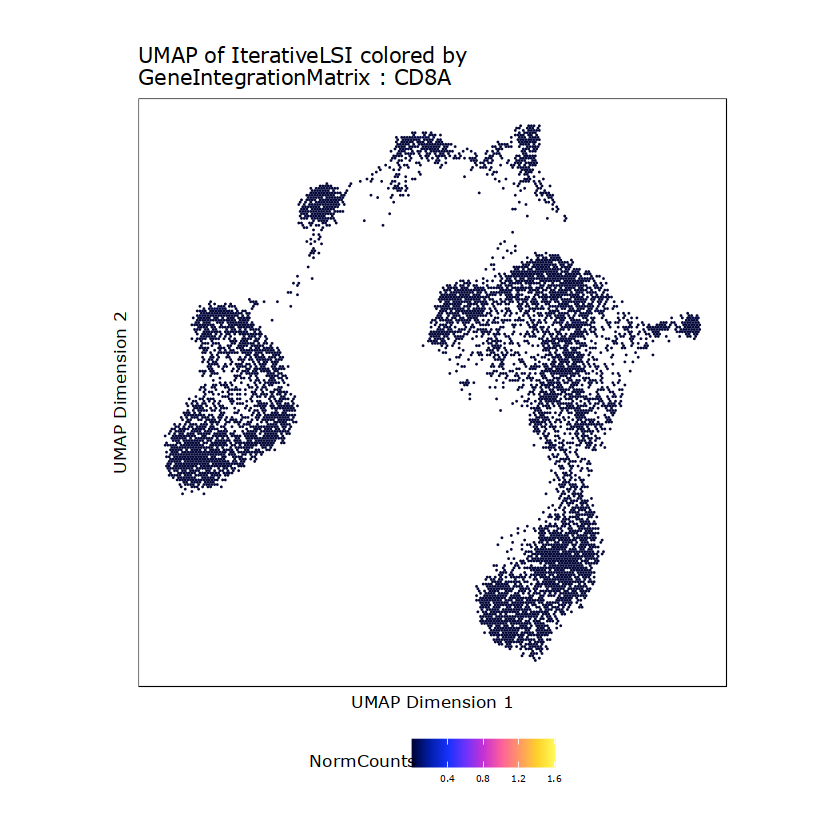

$CD34

$GATA1

$PAX5

$MS4A1

$CD14

$CD3D

$CD8A

$TBX21

$IL7R


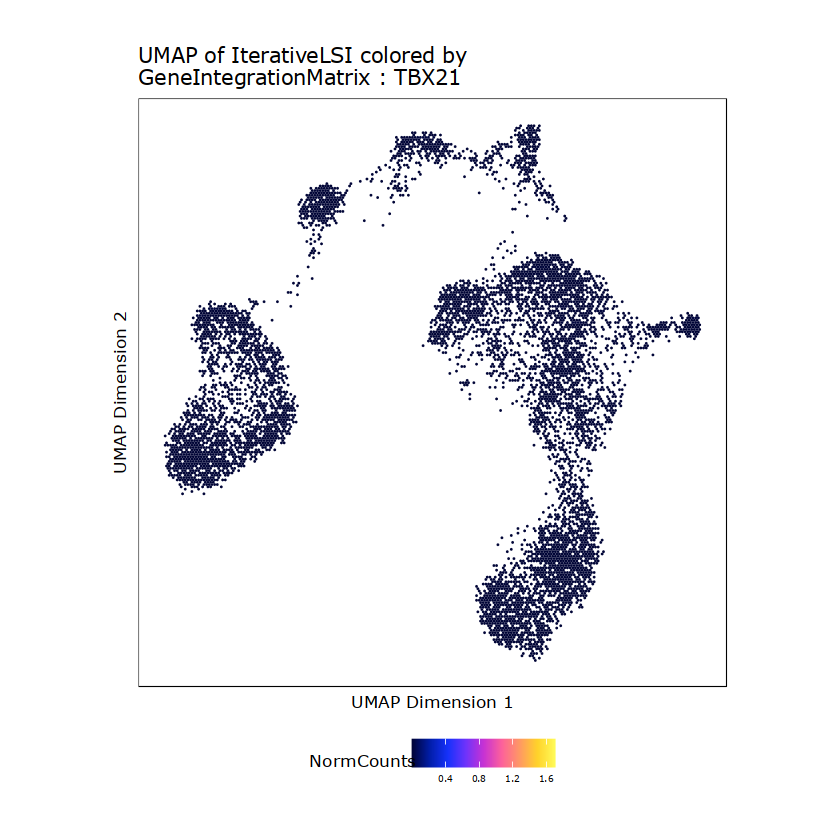

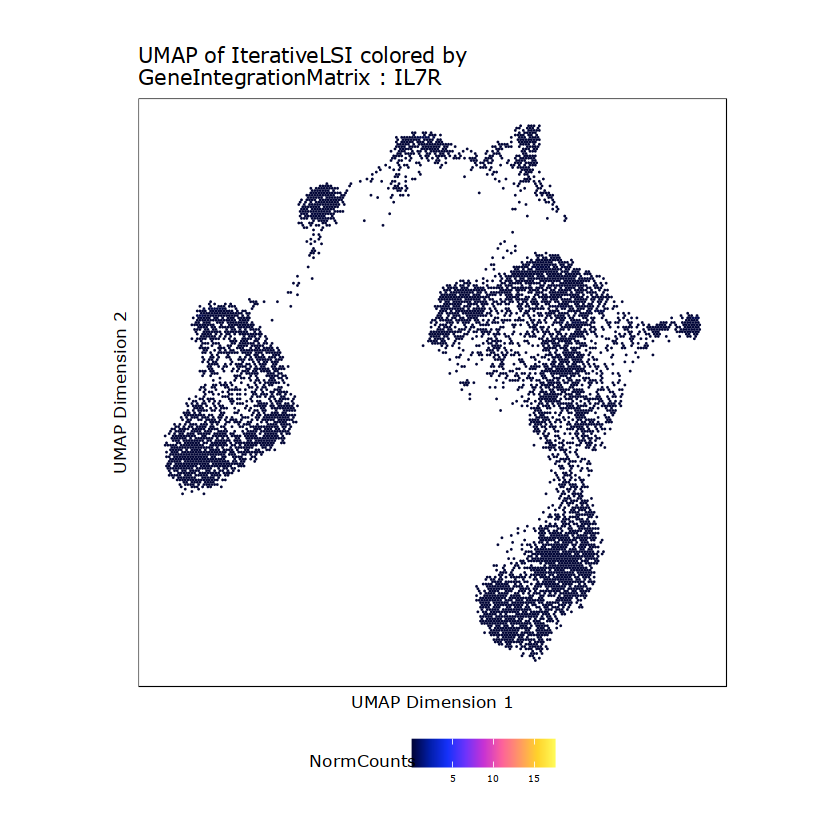

In [16]:
p1 #coloring on UMAP is off. Need troubleshooting. 

In [117]:
#saveArchRProject(ArchRProj = projHeme3, outputDirectory = "Save-ProjHeme3", load = FALSE) 

Copying ArchRProject to new outputDirectory : /Users/mydir/Desktop/archr_tutorial/Save-ProjHeme3

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 4): Embeddings

Copying Other Files (2 of 4): IterativeLSI

Copying Other Files (3 of 4): Plots

Copying Other Files (4 of 4): RNAIntegration

Saving ArchRProject...



In [4]:
#save.image("archrtutorial.RData")
#load("archrtutorial.RData") -- Resume from here 

# 8.3. Label scATAC-seq with scRNA-seq clusters 

In [17]:
cM <- confusionMatrix(projHeme3$Clusters, projHeme3$predictedGroup)
labelOld <- rownames(cM)
labelOld

[1] "C9"  "C6"  "C10" "C4"  "C1"  "C3"  "C7"  "C5"  "C11" "C8"  "C2"  "C12"

In [18]:
#Then, for each of our scATAC-seq clusters, we identify the cell type from predictedGroup 
#which best defines that cluster.

labelNew <- colnames(cM)[apply(cM, 1, which.max)]
labelNew

[1] "17_B"           "20_CD4.N1"      "16_Pre.B"       "08_GMP.Neut"   
 [5] "11_CD14.Mono.1" "03_Late.Eryth"  "22_CD4.M"       "01_HSC"        
 [9] "09_pDC"         "25_NK"          "12_CD14.Mono.2" "15_CLP.2"

In [21]:
#Next we need to reclassify these new cluster labels to make a simpler categorization system. 
#For each scRNA-seq cluster, we will re-define its label to something easier to interpret.

remapClust <- c(
    "01_HSC" = "Progenitor",
    "02_Early.Eryth" = "Erythroid",
    "03_Late.Eryth" = "Erythroid",
    "04_Early.Baso" = "Basophil",
    "05_CMP.LMPP" = "Progenitor",
    "06_CLP.1" = "CLP",
    "07_GMP" = "GMP",
    "08_GMP.Neut" = "GMP",
    "09_pDC" = "pDC",
    "10_cDC" = "cDC",
    "11_CD14.Mono.1" = "Mono",
    "12_CD14.Mono.2" = "Mono",
    "13_CD16.Mono" = "Mono",
    "15_CLP.2" = "CLP",
    "16_Pre.B" = "PreB",
    "17_B" = "B",
    "18_Plasma" = "Plasma",
    "19_CD8.N" = "CD8.N",
    "20_CD4.N1" = "CD4.N",
    "21_CD4.N2" = "CD4.N",
    "22_CD4.M" = "CD4.M",
    "23_CD8.EM" = "CD8.EM",
    "24_CD8.CM" = "CD8.CM",
    "25_NK" = "NK"
)
remapClust <- remapClust[names(remapClust) %in% labelNew]

In [22]:
#Then, using the mapLabels() function, we will convert our labels to this new simpler system.


labelNew2 <- mapLabels(labelNew, oldLabels = names(remapClust), newLabels = remapClust)
labelNew2


[1] "B"          "CD4.N"      "PreB"       "GMP"        "Mono"      
 [6] "Erythroid"  "CD4.M"      "Progenitor" "pDC"        "NK"        
[11] "Mono"       "CLP"

In [23]:
#Combining labelsOld and labelsNew2, we now can use the mapLabels() function again to create new cluster labels 
#in cellColData.
projHeme3$Clusters2 <- mapLabels(projHeme3$Clusters, newLabels = labelNew2, oldLabels = labelOld)

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-8ca51f1775de-Date-2023-01-09_Time-10-58-04.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-8ca51f1775de-Date-2023-01-09_Time-10-58-04.log



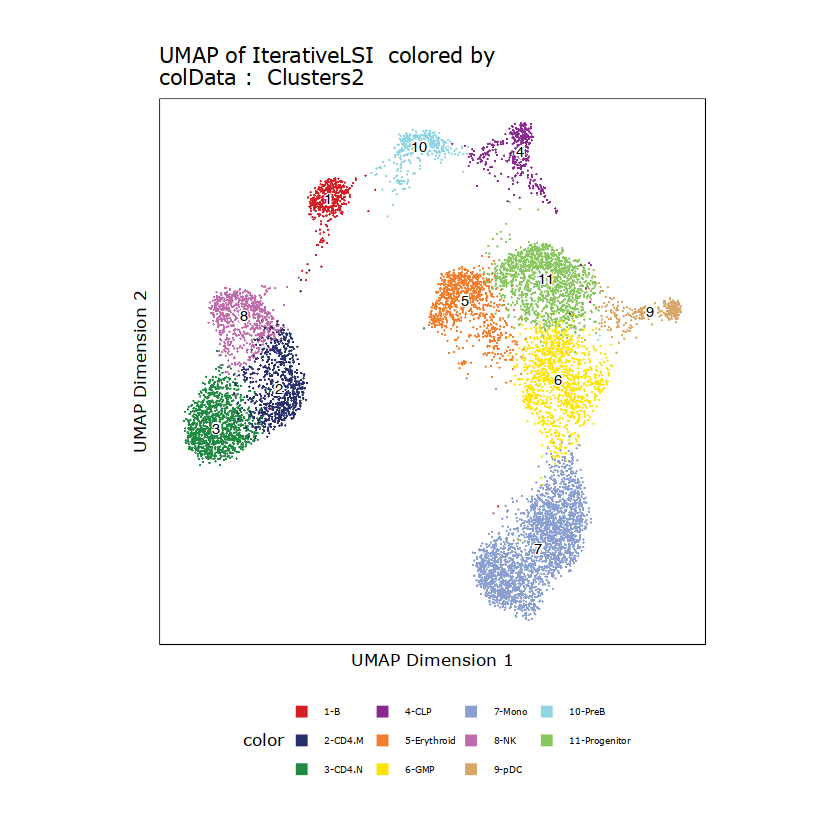

In [24]:
#With these new labels in hand, we can plot a UMAP with the new cluster identities overlayed.

p1 <- plotEmbedding(projHeme3, colorBy = "cellColData", name = "Clusters2")
p1

# Chapter 9: Making pseudo-bulk 
This is needed for peak calling. We do not want to call peaks on the merged set of all single cells so having these more granular cell groups defined, either through clustering or otherwise, provides the ideal starting point for peak calling.

In [29]:
library("BSgenome.Hsapiens.UCSC.hg19")

Loading required package: BSgenome

Loading required package: rtracklayer



In [30]:
projHeme4 <- addGroupCoverages(ArchRProj = projHeme3, groupBy = "Clusters2")


ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-8ca5639859f5-Date-2023-01-09_Time-14-25-42.log
If there is an issue, please report to github with logFile!

B (1 of 11) : CellGroups N = 2

CD4.M (2 of 11) : CellGroups N = 2

CD4.N (3 of 11) : CellGroups N = 2

CLP (4 of 11) : CellGroups N = 2

Erythroid (5 of 11) : CellGroups N = 2

GMP (6 of 11) : CellGroups N = 2

Mono (7 of 11) : CellGroups N = 2

NK (8 of 11) : CellGroups N = 2

pDC (9 of 11) : CellGroups N = 2

PreB (10 of 11) : CellGroups N = 2

Progenitor (11 of 11) : CellGroups N = 2

2023-01-09 14:25:43 : Creating Coverage Files!, 0.014 mins elapsed.

2023-01-09 14:25:43 : Batch Execution w/ safelapply!, 0.014 mins elapsed.

2023-01-09 14:25:43 : Group B._.scATAC_BMMC_R1 (1 of 22) : Creating Group Coverage File : B._.scATAC_BMMC_R1.insertions.coverage.h5, 0.014 mins elapsed.

Number of Cells = 251

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Cover

# Chapter 10: Peak calling 

Calling peaks is one of the most fundamental processes in ATAC-seq data analysis. Because per-cell scATAC-seq data is essentially binary (accessible or not accessible), we cannot call peaks on an individual cell basis. 
For this reason, we defined groups of cells, typically clusters, in a previous chapter. Moreover, we created pseudo-bulk replicates to allow us to assess the reproducibility of our peak calls.

In [ ]:
# PEAK CALLING W MACS2

To avoid bias from pseudo-bulk replicates that have very few cells, we can provide a cutoff for the upper limit of the number of peaks called per cell via the peaksPerCell parameter. This prevents clusters with very few cells from contributing lots of low quality peaks to the merged peak set. There are many other parameters that can be tweaked in addReproduciblePeakSet() - try ?addReproduciblePeakSet for more information.

In [31]:
#To call peaks using MACS2, ArchR must be able to find the MACS2 executable. 
#First, ArchR looks in your PATH environment variable
pathToMacs2 <- findMacs2()

Searching For MACS2..

Found with $path!



In [34]:
getwd()

[1] "/Users/mydir/Desktop/archr_tutorial"

In [36]:
projHeme4 <- addReproduciblePeakSet(
    ArchRProj = projHeme4, 
    groupBy = "Clusters2", 
    pathToMacs2 = "/Users/mydir/opt/anaconda3/bin/macs2"
)

#this part gave an error at first""--.scATAC_BMMC_R1-1_summits.bed' does not exist or is non-readable"
#pip uninstall numpy/ pip install numpy solved the problem. 

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-8ca5451d25db-Date-2023-01-09_Time-15-15-33.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2023-01-09 15:15:34 : Peak Calling Parameters!, 0.002 mins elapsed.



                Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
B                   B    420        415           2  164  251   150000
CD4.M           CD4.M    815        613           2  113  500   150000
CD4.N           CD4.N   1242        549           2   49  500   150000
CLP               CLP    385        385           2   88  297   150000
Erythroid   Erythroid    899        729           2  229  500   150000
GMP               GMP   1140        840           2  340  500   150000
Mono             Mono   2570       1000           2  500  500   150000
NK                 NK    726        726           2  304  422   150000
pDC               pDC    307        297           2  148  149   148500
PreB             PreB    357        357           2   40  317   150000
Progenitor Progenitor   1389        636           2  136  500   150000


2023-01-09 15:15:34 : Batching Peak Calls!, 0.002 mins elapsed.

2023-01-09 15:15:34 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-01-09 15:15:34 : Group 1 of 22, Calling Peaks with MACS2!, 0 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 2.7e+09 --name B._.scATAC_BMMC_R1-1 --treatment /Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/InsertionBeds/B._.scATAC_BMMC_R1-1.insertions.bed --outdir /Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/InsertionBeds --format BED --call-summits --keep-dup all --nomodel --nolambda --shift -75 --extsize 150 -q 0.1

2023-01-09 15:15:58 : Group 2 of 22, Calling Peaks with MACS2!, 0.408 mins elapsed.

Running Macs2 with Params : macs2 callpeak -g 2.7e+09 --name B._.scATAC_PBMC_R1-2 --treatment /Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/InsertionBeds/B._.scATAC_PBMC_R1-2.insertions.bed --outdir /Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/InsertionBeds --format BED --call-summits --

[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/B-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/CD4.M-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/CD4.N-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/CLP-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/Erythroid-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/GMP-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/Mono-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/NK-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/pDC-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/PreB-reproduciblePeaks.gr.rds"


Annotating Peaks : Nearest Gene

Annotating Peaks : Gene

Annotating Peaks : TSS

Annotating Peaks : GC



[1] "/Users/mydir/Desktop/archr_tutorial/HemeTutorial/PeakCalls/Progenitor-reproduciblePeaks.gr.rds"


2023-01-09 15:26:01 : Creating Union Peak Set!, 10.46 mins elapsed.

Converged after 7 iterations!

Plotting Ggplot!

2023-01-09 15:26:06 : Finished Creating Union Peak Set (144664)!, 10.545 mins elapsed.



In [37]:
getPeakSet(projHeme4)


GRanges object with 144664 ranges and 13 metadata columns:
            seqnames              ranges strand |     score
               <Rle>           <IRanges>  <Rle> | <numeric>
       Mono     chr1       752499-752999      * |  27.35380
          B     chr1       762688-763188      * |  51.64830
          B     chr1       801007-801507      * |  15.77860
          B     chr1       805039-805539      * |  37.51560
        CLP     chr1       845326-845826      * |   2.76241
        ...      ...                 ...    ... .       ...
         NK     chrX 154807254-154807754      * |   4.80832
       Mono     chrX 154842032-154842532      * |  19.78790
  Erythroid     chrX 154912390-154912890      * |   6.24217
        GMP     chrX 154997007-154997507      * |   4.92726
       Mono     chrX 154997959-154998459      * |   9.87551
            replicateScoreQuantile groupScoreQuantile Reproducibility
                         <numeric>          <numeric>       <numeric>
       Mono          

In [ ]:
# PEAK CALLING W TILEMATRIX- ArchR functions #I will skip this part 
 ArchR also implements its own native peak caller. While we have benchmarked this peak caller against MACS2 and 
note very similar performances, we do not recommend using this native peak caller unless absolutely necessary

In [ ]:
# Add peak matrix to the ArchRProject

In [38]:
#We can now save our original projHeme4 using the saveArchRProject() function. 
#This ArchRProject contains the MACS2-derived merged peak set.

saveArchRProject(ArchRProj = projHeme4, outputDirectory = "Save-ProjHeme4", load = FALSE)

Copying ArchRProject to new outputDirectory : /Users/mydir/Desktop/archr_tutorial/Save-ProjHeme4

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

Dropping ImputeWeights...

Copying Other Files...

Copying Other Files (1 of 6): Embeddings

Copying Other Files (2 of 6): GroupCoverages

Copying Other Files (3 of 6): IterativeLSI

Copying Other Files (4 of 6): PeakCalls

Copying Other Files (5 of 6): Plots

Copying Other Files (6 of 6): RNAIntegration

Saving ArchRProject...



#                                    Downstream analysis                                              #

In [39]:
#To prepare for downstream analyses, we can create a new ArchRProject called projHeme5 and 
#add a new matrix to it containing insertion counts within our new merged peak set.

projHeme5 <- addPeakMatrix(projHeme4)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-8ca592d9275-Date-2023-01-09_Time-15-36-54.log
If there is an issue, please report to github with logFile!

2023-01-09 15:36:55 : Batch Execution w/ safelapply!, 0 mins elapsed.

2023-01-09 15:36:55 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (1 of 23)!, 0.006 mins elapsed.

2023-01-09 15:36:57 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (2 of 23)!, 0.04 mins elapsed.

2023-01-09 15:36:58 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (3 of 23)!, 0.064 mins elapsed.

2023-01-09 15:37:00 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (4 of 23)!, 0.085 mins elapsed.

2023-01-09 15:37:01 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (5 of 23)!, 0.104 mins elapsed.

2023-01-09 15:37:02 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (6 of 23)!, 0.125 mins elapsed.

2023-01-09 15:37:03 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (7 of 23)!, 0.147 mins elapsed.

2023-01-09 15:37:05 : Adding scATAC_BMMC_R1 to PeakMatrix for Chr (8 of 23)!, 0.1

In [40]:
getAvailableMatrices(projHeme5)


[1] "GeneIntegrationMatrix" "GeneScoreMatrix"       "PeakMatrix"           
[4] "TileMatrix"

# Chapter 11: Identifying marker peaks 

We have introduced the identification of marker features previously in the chapter discussing gene scores. The same function (getMarkerFeatures()) with useMatrix = "PeakMatrix" can be used to identify marker features from any matrix stored in an ArchRProject. 

In [41]:
markersPeaks <- getMarkerFeatures(
    ArchRProj = projHeme5, 
    useMatrix = "PeakMatrix", 
    groupBy = "Clusters2",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  testMethod = "wilcoxon"
)

#we tell ArchR to account for differences in data quality amongst the cell groups by setting the bias parameter 
#to account for TSS enrichment and the number of unique fragments per cell.

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-8ca5eea4408-Date-2023-01-09_Time-15-42-35.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-01-09 15:42:36 : Matching Known Biases, 0.003 mins elapsed.

2023-01-09 15:42:37 : Computing Pairwise Tests (1 of 11), 0.027 mins elapsed.

Pairwise Test B : Seqnames chr1

Pairwise Test B : Seqnames chr10

Pairwise Test B : Seqnames chr11

Pairwise Test B : Seqnames chr12

Pairwise Test B : Seqnames chr13

Pairwise Test B : Seqnames chr14

Pairwise Test B : Seqnames chr15

Pairwise Test B : Seqnames chr16

Pairwise Test B : Seqnames chr17

Pairwise Test B : Seqnames chr18

Pairwise Test B : Seqnames chr19

Pairwise Test B : Seqnames chr2

Pairwise Test B : Seqnames chr20

Pairwise Test B : Seqnames chr21

Pairwise Test B : Seqnames chr22

Pairwise Test B : Seqnames chr3

Pairwise Test B : Seqnames chr4

Pairwise Test B : Seqnames chr5

Pairwise Test B : Seqnames chr6

Pairwise Test B : 

In [42]:
markersPeaks

class: SummarizedExperiment 
dim: 144664 11 
metadata(2): MatchInfo Params
assays(7): Log2FC Mean ... AUC MeanBGD
rownames(144664): 1 2 ... 144663 144664
rowData names(4): seqnames idx start end
colnames(11): B CD4.M ... PreB Progenitor
colData names(0):

In [43]:
#getMarkers() function to retrieve particular slices of this SummarizedExperiment that we are interested in. 
#The default behavior of this function is to return a list of DataFrame objects, one for each cell group.

markerList <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 1")#returns a dataframe 
markerList

List of length 11
names(11): B CD4.M CD4.N CLP Erythroid GMP Mono NK pDC PreB Progenitor

In [44]:
markerList$B 

DataFrame with 467 rows and 7 columns
       seqnames     idx     start       end    Log2FC         FDR  MeanDiff
          <Rle> <array>   <array>   <array> <numeric>   <numeric> <numeric>
52969     chr16    5057  88079477  88079977   4.25431 1.58313e-09  0.828237
92299      chr3     624  13152065  13152565   3.29368 1.58313e-09  1.314552
81187      chr2   10325 232537192 232537692   3.40975 1.91070e-08  0.986040
16117     chr10    2281  49879507  49880007   6.01845 2.89024e-08  0.810410
23444     chr11    2880  60222870  60223370   4.70284 4.08665e-08  0.859006
...         ...     ...       ...       ...       ...         ...       ...
98956      chr3    7281 169531535 169532035   2.77069  0.00968959  0.423936
133664     chr8    4621 125649628 125650128   1.42535  0.00968959  0.320239
109993     chr5    3671 124083790 124084290   2.63950  0.00971498  0.343493
84662     chr20    2615  43214896  43215396   2.34243  0.00977768  0.470331
117791     chr6    4348  62995933  62996433   2.01

In [45]:
markerList_granges <- getMarkers(markersPeaks, cutOff = "FDR <= 0.01 & Log2FC >= 1", returnGR = TRUE) #returns a Granges object
markerList_granges

List of length 11
names(11): B CD4.M CD4.N CLP Erythroid GMP Mono NK pDC PreB Progenitor

In [46]:
markerList_granges$Erythroid

GRanges object with 2100 ranges and 3 metadata columns:
         seqnames              ranges strand |    Log2FC         FDR  MeanDiff
            <Rle>           <IRanges>  <Rle> | <numeric>   <numeric> <numeric>
     [1]     chr1 110407009-110407509      * |   5.47547 6.67911e-12  0.871082
     [2]    chr21   46831292-46831792      * |   8.65098 6.67911e-12  0.810062
     [3]    chr22   30129830-30130330      * |   3.67324 6.67911e-12  1.002861
     [4]    chr15   50552657-50553157      * |   4.62778 1.41736e-11  0.785026
     [5]    chr15   75986643-75987143      * |   5.62226 5.93462e-11  0.753102
     ...      ...                 ...    ... .       ...         ...       ...
  [2096]    chr12 123872590-123873090      * |   2.54520  0.00983824  0.186391
  [2097]    chr18     3993808-3994308      * |   2.83491  0.00987339  0.251823
  [2098]     chr5 140893293-140893793      * |   1.48923  0.00989474  0.239155
  [2099]    chr11   73086954-73087454      * |   1.18797  0.00999017  0.436

# Plotting marker peaks 

In [48]:
# Heatmap
#We can visualize these marker peaks (or any features output by getMarkerFeatures()) as a heatmap using 
#the markerHeatmap() function.

#markerheatmap() function is not working. Try plotMarkerHeatmap()
heatmapPeaks <- plotMarkerHeatmap(
  seMarker = markersPeaks, 
  cutOff = "FDR <= 0.1 & Log2FC >= 0.5",
  transpose = TRUE
)

ArchR logging to : ArchRLogs/ArchR-plotMarkerHeatmap-8ca57e9a1a90-Date-2023-01-09_Time-15-49-37.log
If there is an issue, please report to github with logFile!

Identified 40915 markers!



  [1] "chr1:801007-801507"     "chr1:1071786-1072286"   "chr1:4067611-4068111"  
  [4] "chr1:4087477-4087977"   "chr1:4104872-4105372"   "chr1:12212042-12212542"
  [7] "chr1:15208404-15208904" "chr1:15898180-15898680" "chr1:24239629-24240129"
 [10] "chr1:25074651-25075151" "chr1:27070472-27070972" "chr1:28970219-28970719"
 [13] "chr1:31226442-31226942" "chr1:31227411-31227911" "chr1:31253237-31253737"
 [16] "chr1:896191-896691"     "chr1:1004512-1005012"   "chr1:1152339-1152839"  
 [19] "chr1:1259866-1260366"   "chr1:1306701-1307201"   "chr1:1307337-1307837"  
 [22] "chr1:1624353-1624853"   "chr1:1709649-1710149"   "chr1:2163272-2163772"  
 [25] "chr1:2186319-2186819"   "chr1:2246488-2246988"   "chr1:2455275-2455775"  
 [28] "chr1:2478210-2478710"   "chr1:2480035-2480535"   "chr1:2509089-2509589"  
 [31] "chr1:1510053-1510553"   "chr1:2084331-2084831"   "chr1:2474864-2475364"  
 [34] "chr1:8761186-8761686"   "chr1:11968806-11969306" "chr1:20960262-20960762"
 [37] "chr1:22350842-2235134

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotMarkerHeatmap-8ca57e9a1a90-Date-2023-01-09_Time-15-49-37.log



Plotting ComplexHeatmap!



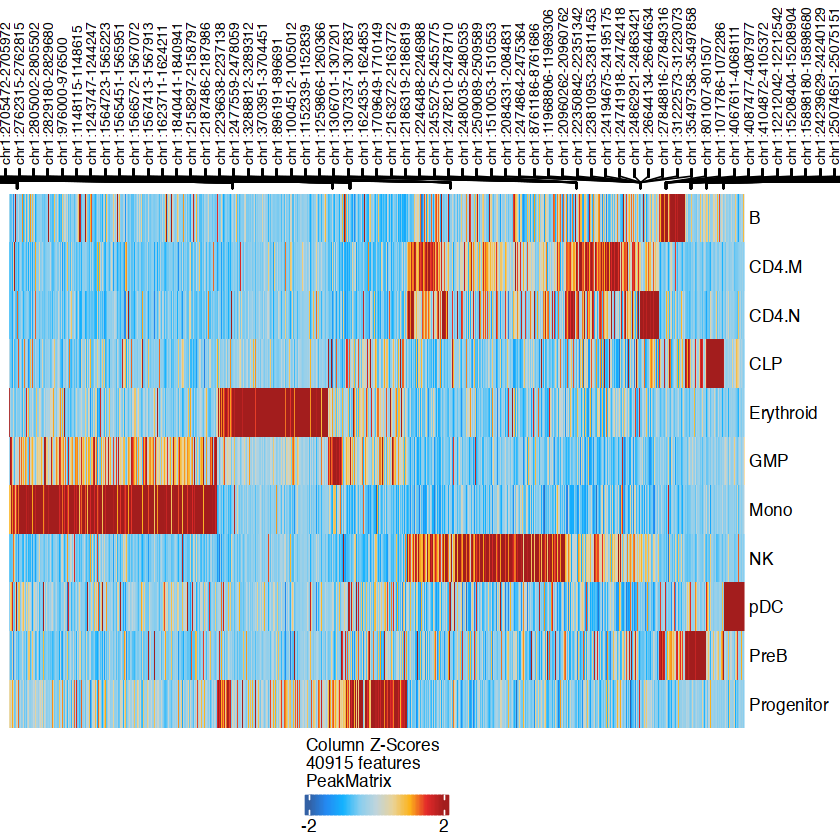

In [49]:
draw(heatmapPeaks, heatmap_legend_side = "bot", annotation_legend_side = "bot")
plotPDF(heatmapPeaks, name = "Peak-Marker-Heatmap", width = 8, height = 6, ArchRProj = projHeme5, addDOC = FALSE)


In [9]:
#save.image(file = "archrtutorial.RData")
load("archrtutorial.RData")

In [ ]:
# Plot volcano or MA plot

Warning message:
“Removed 57 rows containing missing values (`geom_point_rast()`).”


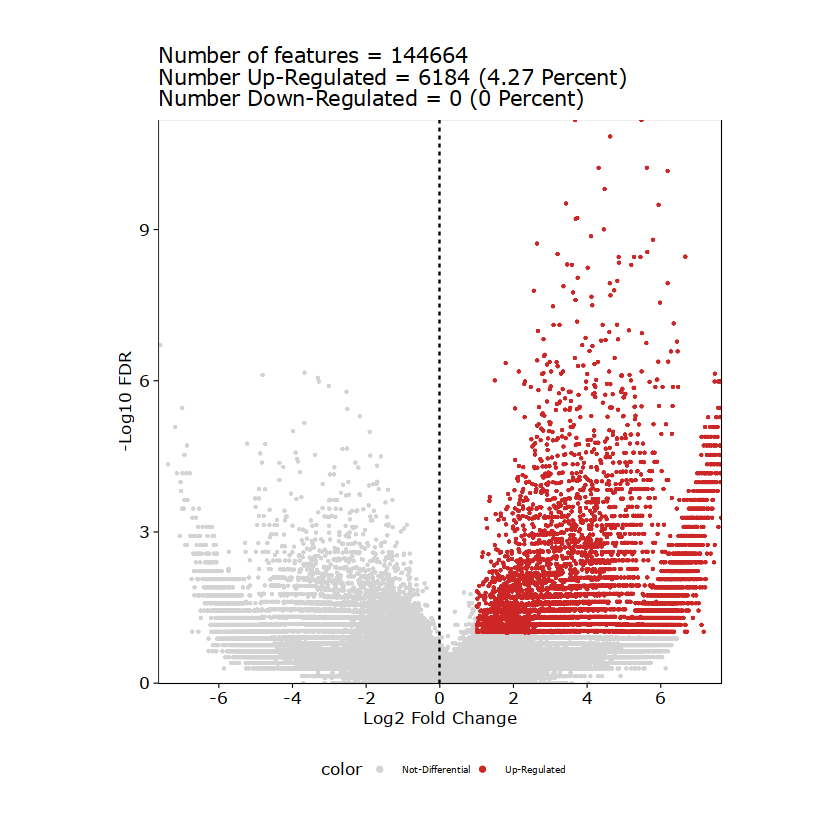

In [10]:
pv <- plotMarkers(seMarker = markersPeaks, name = "Erythroid", cutOff = "FDR <= 0.1 & Log2FC >= 1", plotAs = "Volcano")
pv

#markerPlot function is not working. Try plotMarkers

# Visualize peaks in genome browser 

In [11]:
p <- plotBrowserTrack(
    ArchRProj = projHeme5, 
    groupBy = "Clusters2", 
    geneSymbol = c("GATA1"),
    features =  getMarkers(markersPeaks, cutOff = "FDR <= 0.1 & Log2FC >= 1", returnGR = TRUE)["Erythroid"],
    upstream = 50000,
    downstream = 50000
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-970b7ff139bb-Date-2023-01-09_Time-16-14-24.log
If there is an issue, please report to github with logFile!

2023-01-09 16:14:25 : Validating Region, 0.001 mins elapsed.



GRanges object with 1 range and 2 metadata columns:
      seqnames            ranges strand |     gene_id      symbol
         <Rle>         <IRanges>  <Rle> | <character> <character>
  [1]     chrX 48644982-48652717      + |        2623       GATA1
  -------
  seqinfo: 24 sequences from hg19 genome


2023-01-09 16:14:25 : Adding Bulk Tracks (1 of 1), 0.003 mins elapsed.

2023-01-09 16:14:25 : Adding Feature Tracks (1 of 1), 0.016 mins elapsed.

2023-01-09 16:14:25 : Adding Gene Tracks (1 of 1), 0.017 mins elapsed.

Warning message:
“package ‘ggrepel’ was built under R version 4.1.2”
2023-01-09 16:14:26 : Plotting, 0.02 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-plotBrowserTrack-970b7ff139bb-Date-2023-01-09_Time-16-14-24.log



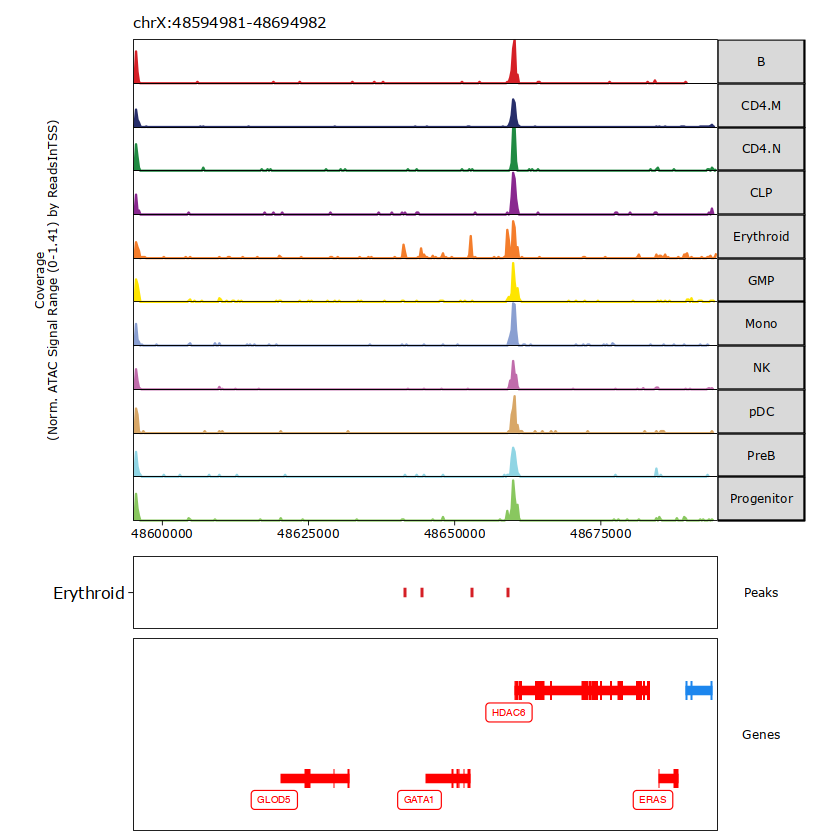

In [12]:
grid::grid.newpage()
grid::grid.draw(p$GATA1)

In [13]:
plotPDF(p, name = "Plot-Tracks-With-Features", width = 5, height = 5, ArchRProj = projHeme5, addDOC = FALSE)


Plotting Gtable!



NULL


# Pairwise testing between clusters (cell types )
ArchR also enables standard differential testing using the same getMarkerFeatures() function. The trick is to set useGroups to one of the two cell groups and bgdGroups to the other cell group. This performs a differential test between the two provided groups. In all of these differential tests, the peaks that are higher in the group passed to useGroups will have positive fold change values while the peaks that are higher in the group passed to bgdGroups will have negative fold change values.

In [14]:
#Here we perform a pairwise test between the “Erythroid” cell group and the “Progenitor” cell group.

markerTest <- getMarkerFeatures(
  ArchRProj = projHeme5, 
  useMatrix = "PeakMatrix",
  groupBy = "Clusters2",
  testMethod = "wilcoxon",
  bias = c("TSSEnrichment", "log10(nFrags)"),
  useGroups = "Erythroid",
  bgdGroups = "Progenitor"
)

ArchR logging to : ArchRLogs/ArchR-getMarkerFeatures-970b4b9d1675-Date-2023-01-09_Time-16-17-16.log
If there is an issue, please report to github with logFile!

MatrixClass = Sparse.Integer.Matrix

2023-01-09 16:17:17 : Matching Known Biases, 0.003 mins elapsed.

2023-01-09 16:17:17 : Computing Pairwise Tests (1 of 1), 0.016 mins elapsed.

Pairwise Test Erythroid : Seqnames chr1

Pairwise Test Erythroid : Seqnames chr10

Pairwise Test Erythroid : Seqnames chr11

Pairwise Test Erythroid : Seqnames chr12

Pairwise Test Erythroid : Seqnames chr13

Pairwise Test Erythroid : Seqnames chr14

Pairwise Test Erythroid : Seqnames chr15

Pairwise Test Erythroid : Seqnames chr16

Pairwise Test Erythroid : Seqnames chr17

Pairwise Test Erythroid : Seqnames chr18

Pairwise Test Erythroid : Seqnames chr19

Pairwise Test Erythroid : Seqnames chr2

Pairwise Test Erythroid : Seqnames chr20

Pairwise Test Erythroid : Seqnames chr21

Pairwise Test Erythroid : Seqnames chr22

Pairwise Test Erythroid : Seqn

Warning message:
“Removed 59 rows containing missing values (`geom_point_rast()`).”


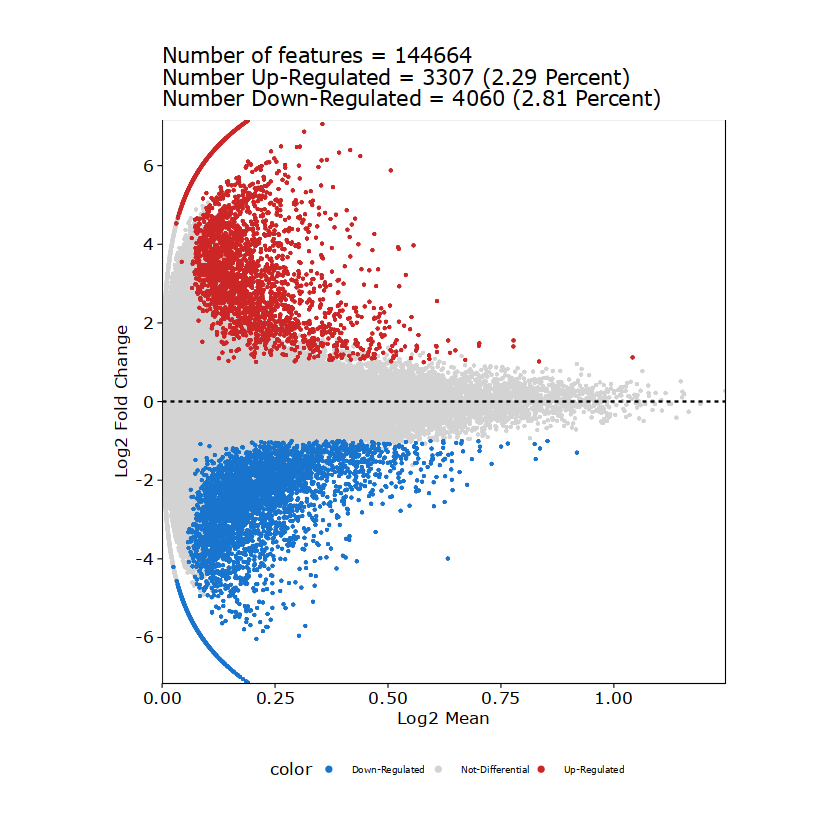

In [16]:
pma <- plotMarkers(seMarker = markerTest, name = "Erythroid", cutOff = "FDR <= 0.1 & abs(Log2FC) >= 1", plotAs = "MA")
pma

#useGroups (Erythroid) will have positive fold change values while the peaks that are higher in the group 
#passed to bgdGroups(progenitor) will have negative fold change values.

In [17]:
plotPDF(pma, pv, name = "Erythroid-vs-Progenitor-Markers-MA-Volcano", width = 5, height = 5, ArchRProj = projHeme5, addDOC = FALSE)


Plotting Ggplot!

Warning message:
“Removed 59 rows containing missing values (`geom_point_rast()`).”
Warning message:
“Removed 59 rows containing missing values (`geom_point_rast()`).”
Plotting Ggplot!

Warning message:
“Removed 57 rows containing missing values (`geom_point_rast()`).”
Warning message:
“Removed 57 rows containing missing values (`geom_point_rast()`).”


# Motif Enrichment 

In [ ]:
#Motif enrichment in differential peaks 

In [29]:
projHeme5 <- addMotifAnnotations(ArchRProj = projHeme5, motifSet = "cisbp", name = "Motif")


ArchR logging to : ArchRLogs/ArchR-addMotifAnnotations-970b120f0056-Date-2023-01-09_Time-16-29-43.log
If there is an issue, please report to github with logFile!

2023-01-09 16:29:43 : Gettting Motif Set, Species : Homo sapiens, 0.002 mins elapsed.

Using version 2 motifs!

2023-01-09 16:29:44 : Finding Motif Positions with motifmatchr!, 0.017 mins elapsed.

2023-01-09 16:31:52 : All Motifs Overlap at least 1 peak!, 2.153 mins elapsed.

2023-01-09 16:31:52 : Creating Motif Overlap Matrix, 2.153 mins elapsed.

2023-01-09 16:31:55 : Finished Getting Motif Info!, 2.187 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addMotifAnnotations-970b120f0056-Date-2023-01-09_Time-16-29-43.log



In [ ]:
#We can then use the differential testing SummarizedExperiment object markerTest which was generated in the 
#previous chapter to define the set of significantly differential peaks that we are interested in testing 
#for motif enrichment. In this case, we are looking for peaks that have an FDR <= 0.1 and a Log2FC >= 0.5. 
#In the context of the differential comparison made in markerTest, these represnt peaks that are more accessible 
#in “Erythroid” cells than “Progenitor” cells. We can test these differentially accessible peaks for enrichment 
#of various motifs using the peakAnnoEnrichment() function.

In [30]:
motifsUp <- peakAnnoEnrichment(
    seMarker = markerTest,
    ArchRProj = projHeme5,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-970b16df175d-Date-2023-01-09_Time-16-52-38.log
If there is an issue, please report to github with logFile!

2023-01-09 16:52:43 : Computing Enrichments 1 of 1, 0.072 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-970b16df175d-Date-2023-01-09_Time-16-52-38.log



In [31]:
motifsUp

class: SummarizedExperiment 
dim: 870 1 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(870): TFAP2B_1 TFAP2D_2 ... TBX18_869 TBX22_870
rowData names(0):
colnames(1): Erythroid
colData names(0):

In [32]:
#To prepare this data for plotting with ggplot we can create a simplified data.frame object containing 
#the motif names, the corrected p-values, and the significance rank.

df <- data.frame(TF = rownames(motifsUp), mlog10Padj = assay(motifsUp)[,1])
df <- df[order(df$mlog10Padj, decreasing = TRUE),]
df$rank <- seq_len(nrow(df))

In [33]:
#As expected, the most enriched motifs in the peaks that are more accessible in “Erythroid” cells 
#correspond to GATA transcription factors, consistent with the well-studied role of GATA1 in erythroid 
#differentiation.

head(df)

,TF,mlog10Padj,rank
,<chr>,<dbl>,<int>
383,GATA1_383,486.7647,1
388,GATA2_388,479.4820,2
384,GATA3_384,396.4654,3
385,GATA5_385,388.4341,4
386,GATA4_386,296.8880,5
387,GATA6_387,205.1848,6


Warning message:
“ggrepel: 22 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


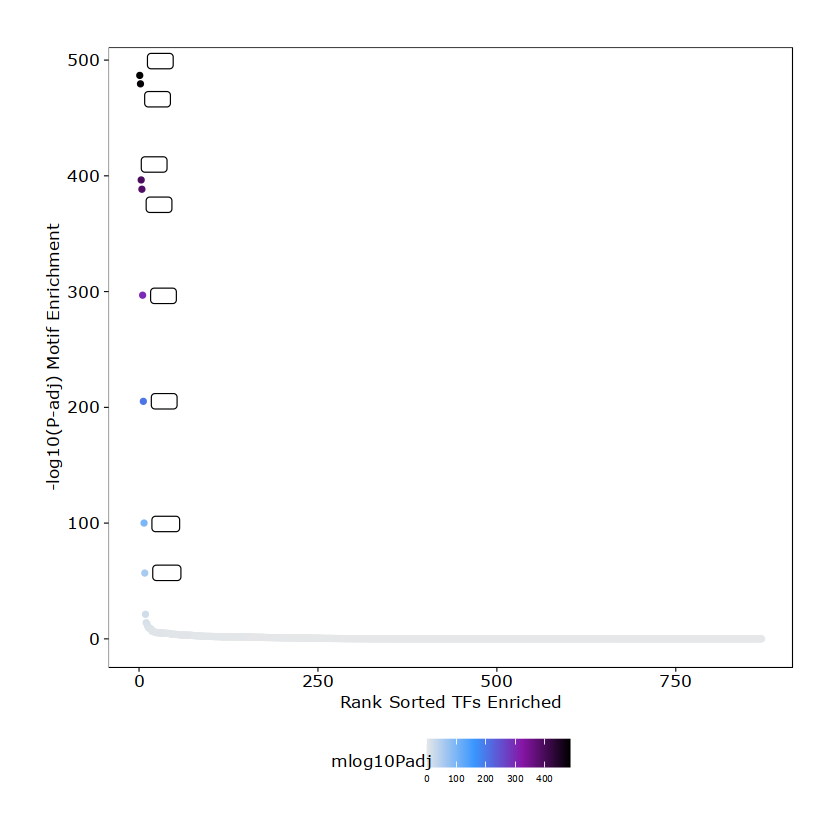

In [36]:
ggUp <- ggplot(df, aes(rank, mlog10Padj, color = mlog10Padj)) + 
  geom_point(size = 1) +
  ggrepel::geom_label_repel(
        data = df[rev(seq_len(30)), ], aes(x = rank, y = mlog10Padj, label = TF), 
        size = 0.5,
        nudge_x = 2,
        color = "black"
  ) + theme_ArchR() + 
  ylab("-log10(P-adj) Motif Enrichment") + 
  xlab("Rank Sorted TFs Enriched") +
  scale_color_gradientn(colors = paletteContinuous(set = "comet"))

ggUp

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-970b6b906d30-Date-2023-01-09_Time-17-03-39.log
If there is an issue, please report to github with logFile!

2023-01-09 17:03:42 : Computing Enrichments 1 of 1, 0.052 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-peakAnnoEnrichment-970b6b906d30-Date-2023-01-09_Time-17-03-39.log



class: SummarizedExperiment 
dim: 870 1 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(870): TFAP2B_1 TFAP2D_2 ... TBX18_869 TBX22_870
rowData names(0):
colnames(1): Erythroid
colData names(0):

Warning message:
“ggrepel: 16 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


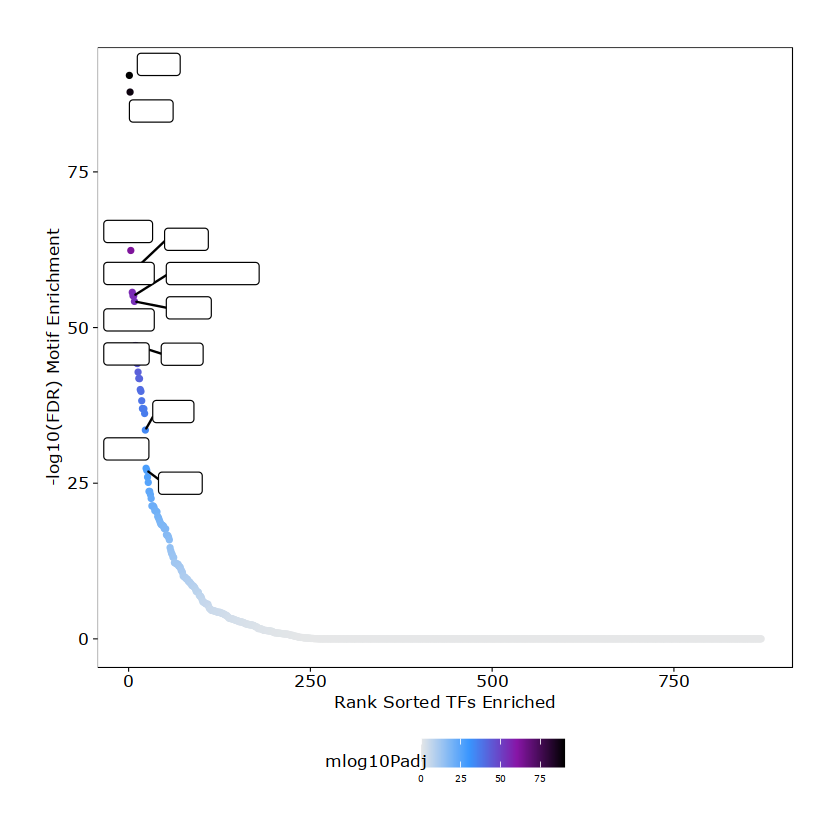

In [37]:
#We can perform the same analyses for the peaks that are more accessible in the “Progenitor” cells by 
#using peaks with Log2FC <= -0.5.

motifsDo <- peakAnnoEnrichment(
    seMarker = markerTest,
    ArchRProj = projHeme5,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC <= -0.5"
  )
motifsDo

df <- data.frame(TF = rownames(motifsDo), mlog10Padj = assay(motifsDo)[,1])
df <- df[order(df$mlog10Padj, decreasing = TRUE),]
df$rank <- seq_len(nrow(df))

ggDo <- ggplot(df, aes(rank, mlog10Padj, color = mlog10Padj)) + 
  geom_point(size = 1) +
  ggrepel::geom_label_repel(
        data = df[rev(seq_len(30)), ], aes(x = rank, y = mlog10Padj, label = TF), 
        size = 1.5,
        nudge_x = 2,
        color = "black"
  ) + theme_ArchR() + 
  ylab("-log10(FDR) Motif Enrichment") +
  xlab("Rank Sorted TFs Enriched") +
  scale_color_gradientn(colors = paletteContinuous(set = "comet"))

ggDo

In [ ]:
#Motif enrichmen with marker peaks 

ArchR logging to : ArchRLogs/ArchR-peakAnnoEnrichment-970b4ff9bed4-Date-2023-01-09_Time-17-17-13.log
If there is an issue, please report to github with logFile!

2023-01-09 17:17:16 : Computing Enrichments 1 of 11, 0.05 mins elapsed.

2023-01-09 17:17:16 : Computing Enrichments 2 of 11, 0.053 mins elapsed.

2023-01-09 17:17:17 : Computing Enrichments 3 of 11, 0.057 mins elapsed.

2023-01-09 17:17:17 : Computing Enrichments 4 of 11, 0.06 mins elapsed.

2023-01-09 17:17:17 : Computing Enrichments 5 of 11, 0.064 mins elapsed.

2023-01-09 17:17:17 : Computing Enrichments 6 of 11, 0.068 mins elapsed.

2023-01-09 17:17:17 : Computing Enrichments 7 of 11, 0.071 mins elapsed.

2023-01-09 17:17:18 : Computing Enrichments 8 of 11, 0.074 mins elapsed.

2023-01-09 17:17:18 : Computing Enrichments 9 of 11, 0.078 mins elapsed.

2023-01-09 17:17:18 : Computing Enrichments 10 of 11, 0.081 mins elapsed.

2023-01-09 17:17:18 : Computing Enrichments 11 of 11, 0.084 mins elapsed.

ArchR logging successful

class: SummarizedExperiment 
dim: 870 11 
metadata(0):
assays(10): mlog10Padj mlog10p ... CompareFrequency feature
rownames(870): TFAP2B_1 TFAP2D_2 ... TBX18_869 TBX22_870
rowData names(0):
colnames(11): B CD4.M ... PreB Progenitor
colData names(0):

ArchR logging to : ArchRLogs/ArchR-plotEnrichHeatmap-970b155f7951-Date-2023-01-09_Time-17-17-19.log
If there is an issue, please report to github with logFile!

Warning message:
“package ‘circlize’ was built under R version 4.1.2”
Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

Plotting ComplexHeatmap!



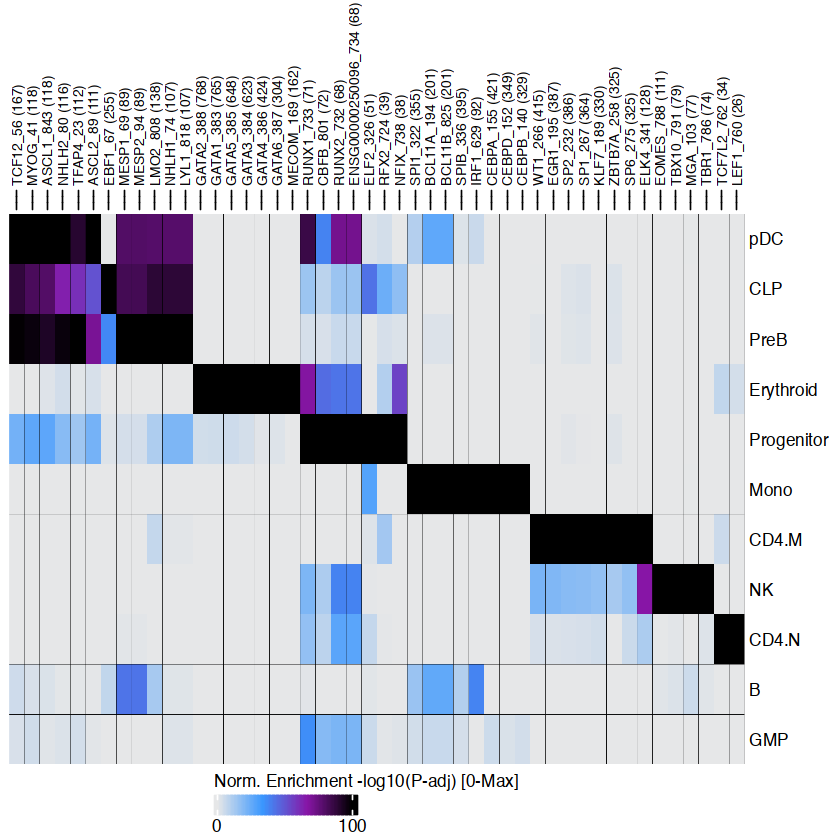

In [39]:
enrichMotifs <- peakAnnoEnrichment(
    seMarker = markersPeaks,
    ArchRProj = projHeme5,
    peakAnnotation = "Motif",
    cutOff = "FDR <= 0.1 & Log2FC >= 0.5"
  )
enrichMotifs

heatmapEM <- plotEnrichHeatmap(enrichMotifs, n = 7, transpose = TRUE)
ComplexHeatmap::draw(heatmapEM, heatmap_legend_side = "bot", annotation_legend_side = "bot")
plotPDF(heatmapEM, name = "Motifs-Enriched-Marker-Heatmap", width = 8, height = 6, ArchRProj = projHeme5, addDOC = FALSE)


In addition to testing peaks for enrichment of motifs, ArchR also enables the determination of more customizable enrichments. To facilitate this level of data exploration, we have curated a few different feature sets that can be easily tested for enrichment in your peak regions of interest (chapter 12.3) --skipped 
1. Encode TF binding sites 
2. Bulk ATAC-seq 
3. Codex TFBS



# ChromVAR

TF motif enrichments can help us predict which regulatory factors are most active in our cell type of interest. but they are not calculated on a per-cell basis and they do not take into account the insertion sequence bias of the Tn5 transposase. 

chromVAR was created to account for these issues. chromVAR is designed for predicting enrichment of TF activity on a per-cell basis from sparse chromatin accessibility data. The two primary outputs of chromVAR are:

1. “deviations” - A deviation is a bias-corrected measurement of how far the per-cell accessibility of a given feature (i.e motif) deviates from the expected accessibility based on the average of all cells or samples.

2. “z-score” - The z-score, also known as a “deviation score” is the z-score for each bias-corrected deviation across all cells. The absolute value of the deviation score is correlated with the per-cell read depth. This is because, with more reads, you have higher confidence that the difference in per-cell accessibility of the given feature (i.e. motif) from the expectation is greater than would occur by chance.

In [40]:
#First, lets make sure we have added motif annotations to our ArchRProject.

if("Motif" %ni% names(projHeme5@peakAnnotation)){
    projHeme5 <- addMotifAnnotations(ArchRProj = projHeme5, motifSet = "cisbp", name = "Motif")
}

In [41]:
#Background peaks are chosen using the chromVAR::getBackgroundPeaks() function which samples peaks based on 
#similarity in GC-content and number of fragments across all samples using the Mahalanobis distance.

projHeme5 <- addBgdPeaks(projHeme5)

Identifying Background Peaks!



In [42]:
projHeme5 <- addDeviationsMatrix(
  ArchRProj = projHeme5, 
  peakAnnotation = "Motif",
  force = TRUE
)

Using Previous Background Peaks!

ArchR logging to : ArchRLogs/ArchR-addDeviationsMatrix-970b621887c5-Date-2023-01-09_Time-18-44-34.log
If there is an issue, please report to github with logFile!



NULL


as(<lgCMatrix>, "dgCMatrix") is deprecated since Matrix 1.5-0; do as(., "dMatrix") instead

2023-01-09 18:44:37 : Batch Execution w/ safelapply!, 0 mins elapsed.

###########
2023-01-09 18:53:11 : Completed Computing Deviations!, 8.632 mins elapsed.
###########

ArchR logging successful to : ArchRLogs/ArchR-addDeviationsMatrix-970b621887c5-Date-2023-01-09_Time-18-44-34.log



In [43]:
#To access these deviations, we use the getVarDeviations() function. 
#If we want this function to return a ggplot object, we set plot = TRUE otherwise, t
#this function would return the DataFrame object. 

plotVarDev <- getVarDeviations(projHeme5, name = "MotifMatrix", plot = TRUE)

DataFrame with 6 rows and 6 columns
     seqnames     idx      name combinedVars combinedMeans      rank
        <Rle> <array>   <array>    <numeric>     <numeric> <integer>
f388        z     388 GATA2_388      12.5628    -0.0357206         1
f383        z     383 GATA1_383      12.4333    -0.0391203         2
f155        z     155 CEBPA_155      11.4478    -0.1839679         3
f336        z     336  SPIB_336      11.4141    -0.0793583         4
f385        z     385 GATA5_385      11.1782    -0.0352167         5
f384        z     384 GATA3_384      10.5811    -0.0306269         6


Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


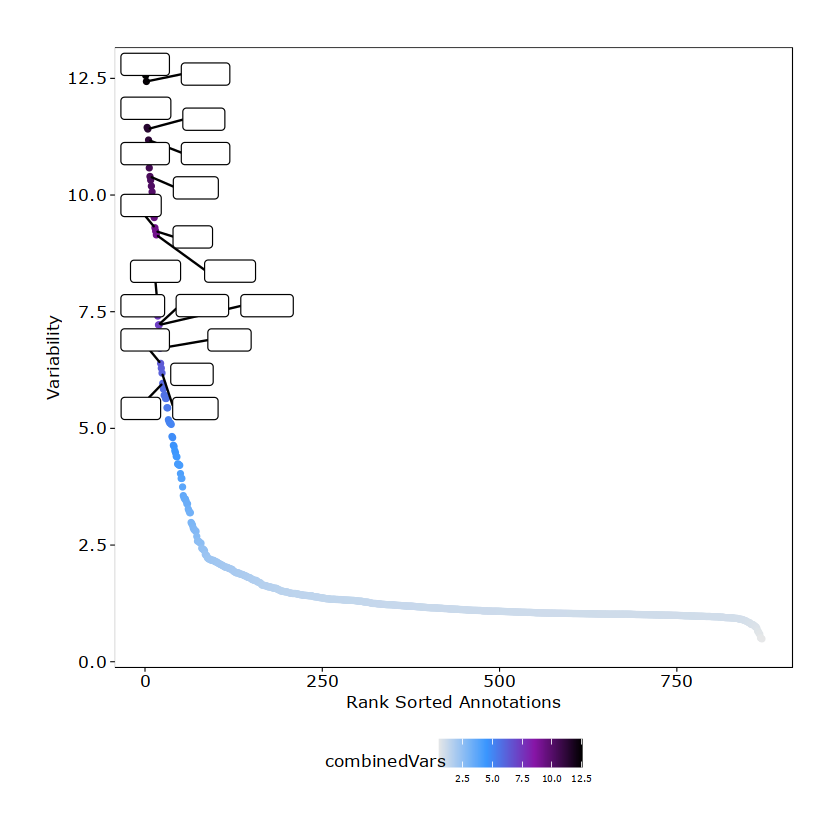

In [44]:
plotVarDev

In [45]:
# Extract a subset of motifs for downstream analysis? We can do this using the getFeatures() function. 
#The paste(motifs, collapse="|") statement below creates a concatenated or statement that enables selection of 
#all of the motifs.

motifs <- c("GATA1", "CEBPA", "EBF1", "IRF4", "TBX21", "PAX5")
markerMotifs <- getFeatures(projHeme5, select = paste(motifs, collapse="|"), useMatrix = "MotifMatrix")
markerMotifs

[1] "z:TBX21_780"          "z:PAX5_709"           "z:IRF4_632"          
 [4] "z:GATA1_383"          "z:CEBPA_155"          "z:EBF1_67"           
 [7] "z:SREBF1_22"          "deviations:TBX21_780" "deviations:PAX5_709" 
[10] "deviations:IRF4_632"  "deviations:GATA1_383" "deviations:CEBPA_155"
[13] "deviations:EBF1_67"   "deviations:SREBF1_22"

In [46]:
#we also selected “SREBF1” which we do not want to analyze. Because of this, we remove it below using the %ni% 
#expression which is an ArchR helper function that provides the opposite of %in% from base R.

markerMotifs <- grep("z:", markerMotifs, value = TRUE)
markerMotifs <- markerMotifs[markerMotifs %ni% "z:SREBF1_22"]
markerMotifs

[1] "z:TBX21_780" "z:PAX5_709"  "z:IRF4_632"  "z:GATA1_383" "z:CEBPA_155"
[6] "z:EBF1_67"

In [47]:
#Now that we have the names of the features that we are interested in, we can plot the distribution of 
#chromVAR deviation scores for each cluster. Notice that we supply the impute weights that we calculated 
#previously during our gene score analyses. As a reminder, these impute weights allow us to smooth the 
#signal across nearby cells which is helpful in the context of our sparse scATAC-seq data.

p <- plotGroups(ArchRProj = projHeme5, 
  groupBy = "Clusters2", 
  colorBy = "MotifMatrix", 
  name = markerMotifs,
  imputeWeights = getImputeWeights(projHeme5)
)

Getting ImputeWeights

Getting Matrix Values...

2023-01-09 19:21:44 : 



ArchR logging to : ArchRLogs/ArchR-imputeMatrix-970b436fb19c-Date-2023-01-09_Time-19-21-46.log
If there is an issue, please report to github with logFile!

Using weights on disk

Using weights on disk

1 
2 
3 
4 
5 
6 




Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”
Picking joint bandwidth of 0.0202

Picking joint bandwidth of 0.0229

Picking joint bandwidth of 0.0694

Picking joint bandwidth of 0.117

Picking joint bandwidth of 0.0928

Picking joint bandwidth of 0.0713



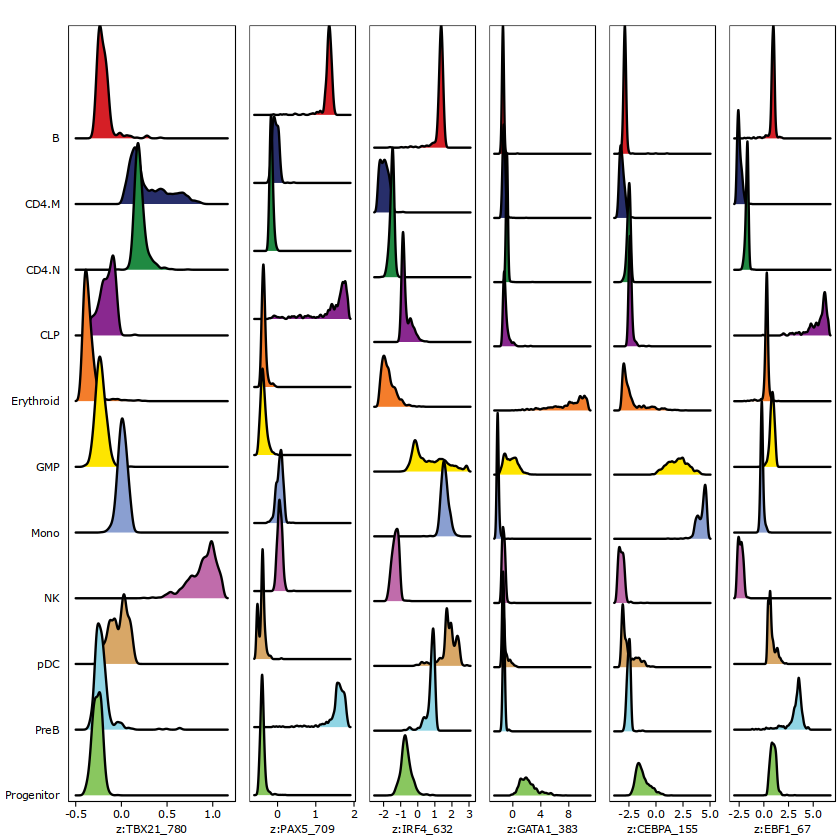

In [48]:
#We can use cowplot to plot the distributions of all of these motifs in a single plot.


p2 <- lapply(seq_along(p), function(x){
  if(x != 1){
    p[[x]] + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.1, 0.1, 0.1, 0.1), "cm")) +
    theme(
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank()
    ) + ylab("")
  }else{
    p[[x]] + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6) +
    theme(plot.margin = unit(c(0.1, 0.1, 0.1, 0.1), "cm")) +
    theme(
        axis.ticks.y=element_blank(),
        axis.title.y=element_blank()
    ) + ylab("")
  }
})
do.call(cowplot::plot_grid, c(list(nrow = 1, rel_widths = c(2, rep(1, length(p2) - 1))),p2))

In [49]:
plotPDF(p, name = "Plot-Groups-Deviations-w-Imputation", width = 5, height = 5, ArchRProj = projHeme5, addDOC = FALSE)


Plotting Ggplot!

Picking joint bandwidth of 0.0202

Picking joint bandwidth of 0.0202

Plotting Ggplot!

Picking joint bandwidth of 0.0229

Picking joint bandwidth of 0.0229

Plotting Ggplot!

Picking joint bandwidth of 0.0694

Picking joint bandwidth of 0.0694

Plotting Ggplot!

Picking joint bandwidth of 0.117

Picking joint bandwidth of 0.117

Plotting Ggplot!

Picking joint bandwidth of 0.0928

Picking joint bandwidth of 0.0928

Plotting Ggplot!

Picking joint bandwidth of 0.0713

Picking joint bandwidth of 0.0713



In [50]:
p <- plotEmbedding(
    ArchRProj = projHeme5, 
    colorBy = "MotifMatrix", 
    name = sort(markerMotifs), 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(projHeme5)
)

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-970b4c646b34-Date-2023-01-09_Time-19-25-41.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = MotifMatrix

Getting Matrix Values...

2023-01-09 19:25:41 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-970b4c646b34-Date-2023-01-09_Time-19-25-41.log



In [51]:
p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2)) ## coloring is off. 

[1] "TBX21" "CEBPA" "EBF1"  "IRF4"  "PAX5"  "GATA1"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-970b12571c6b-Date-2023-01-09_Time-19-28-03.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2023-01-09 19:28:03 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-970b12571c6b-Date-2023-01-09_Time-19-28-03.log



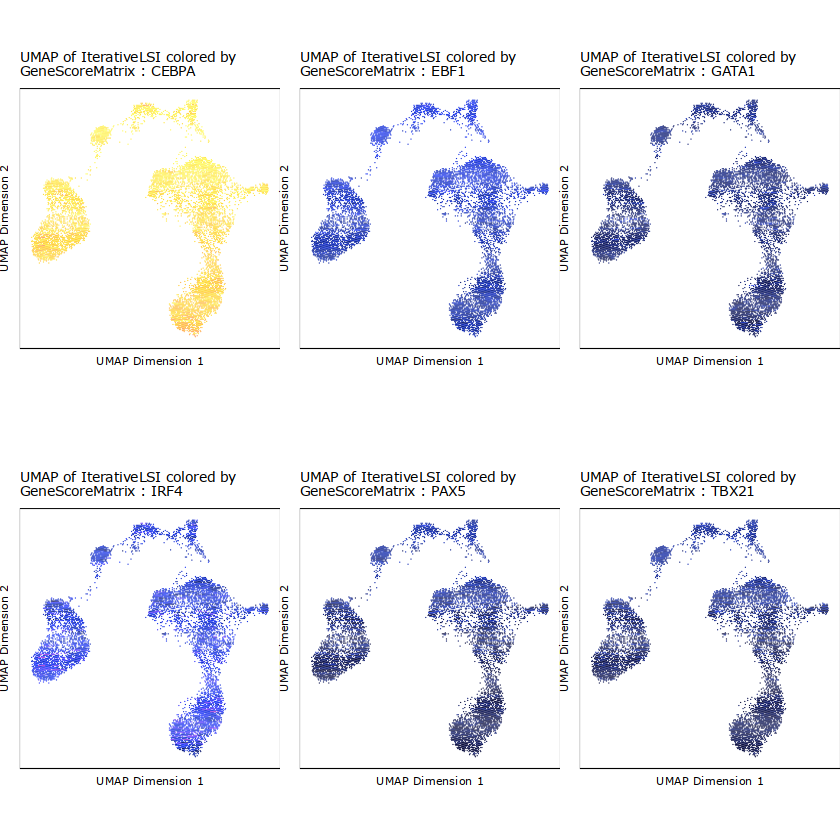

In [52]:
#To see how these TF deviation z-scores compare to the inferred gene expression via gene scores of the 
#corresponding TF genes, we can overlay the gene scores for each of these TFs on the UMAP embedding.

markerRNA <- getFeatures(projHeme5, select = paste(motifs, collapse="|"), useMatrix = "GeneScoreMatrix")
markerRNA <- markerRNA[markerRNA %ni% c("SREBF1","CEBPA-DT")]
markerRNA

p <- plotEmbedding(
    ArchRProj = projHeme5, 
    colorBy = "GeneScoreMatrix", 
    name = sort(markerRNA), 
    embedding = "UMAP",
    imputeWeights = getImputeWeights(projHeme5)
)

p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

[1] "TBX21" "CEBPA" "EBF1"  "IRF4"  "PAX5"  "GATA1"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-970b744d945d-Date-2023-01-09_Time-19-29-11.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneIntegrationMatrix

Getting Matrix Values...

2023-01-09 19:29:11 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting Embedding

1 
2 
3 
4 
5 
6 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-970b744d945d-Date-2023-01-09_Time-19-29-11.log



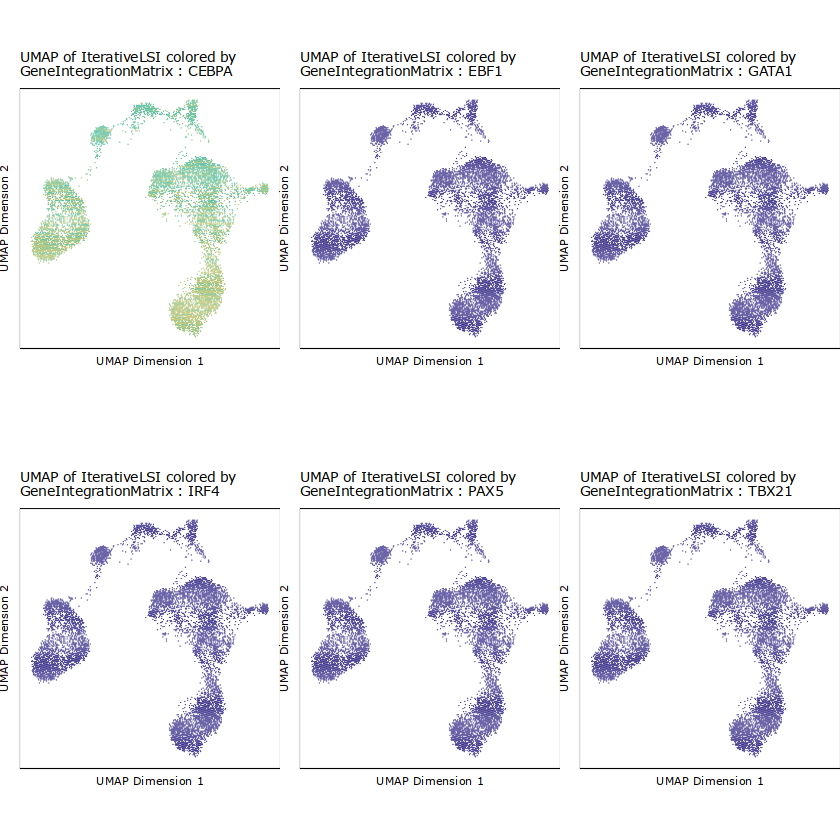

In [53]:
#Similarly, because we previously linked our scATAC-seq data with corresponding scRNA-seq data, 
#we can plot the linked gene expression for each of these TFs on the UMAP embedding.

markerRNA <- getFeatures(projHeme5, select = paste(motifs, collapse="|"), useMatrix = "GeneIntegrationMatrix")
markerRNA <- markerRNA[markerRNA %ni% c("SREBF1","CEBPA-DT")]
markerRNA

p <- plotEmbedding(
    ArchRProj = projHeme5, 
    colorBy = "GeneIntegrationMatrix", 
    name = sort(markerRNA), 
    embedding = "UMAP",
    continuousSet = "blueYellow",
    imputeWeights = getImputeWeights(projHeme5)
)

p2 <- lapply(p, function(x){
    x + guides(color = FALSE, fill = FALSE) + 
    theme_ArchR(baseSize = 6.5) +
    theme(plot.margin = unit(c(0, 0, 0, 0), "cm")) +
    theme(
        axis.text.x=element_blank(), 
        axis.ticks.x=element_blank(), 
        axis.text.y=element_blank(), 
        axis.ticks.y=element_blank()
    )
})
do.call(cowplot::plot_grid, c(list(ncol = 3),p2))

In [6]:
#save.image("archrtutorial.RData")
load("archrtutorial.RData")

# Chapter 14: Footprinting

The accuracy of this footprint relies on generating a reliable curated list of predicted binding sites for the TF of interest. 

addMotifAnnotations(): ArchR does this in a naive way via the addMotifAnnotations() functions by searching the peak regions for any DNA sequence matching a motif.These motif annotations get added to the ArchRProject as a binary representation on a per peak basis (0 = no motif, 1 = motif present). 

getFootprints(): Once you have these motif annotations, ArchR performs footprinting using the getFootprints() function which takes as input an ArchRProject object and a GenomicRanges object that contains the positions of the motifs. 

plotFootprints(): These footprints can then be plotted using the plotFootprints() function.

In [8]:
motifPositions <- getPositions(projHeme5)
motifPositions

GRangesList object of length 870:
$TFAP2B_1
GRanges object with 17076 ranges and 1 metadata column:
          seqnames              ranges strand |     score
             <Rle>           <IRanges>  <Rle> | <numeric>
      [1]     chr1       873916-873927      + |   8.30372
      [2]     chr1       873916-873927      - |   8.30372
      [3]     chr1       875505-875516      + |  10.20311
      [4]     chr1       875505-875516      - |   9.04147
      [5]     chr1       896470-896481      + |   8.85622
      ...      ...                 ...    ... .       ...
  [17072]     chrX 154032970-154032981      + |   8.57786
  [17073]     chrX 154299568-154299579      + |   8.88364
  [17074]     chrX 154664929-154664940      - |   8.14897
  [17075]     chrX 154807684-154807695      + |   9.55990
  [17076]     chrX 154807684-154807695      - |  10.59395
  -------
  seqinfo: 23 sequences from an unspecified genome; no seqlengths

...
<869 more elements>

In [9]:
#We can subset this GRangesList to a few TF motifs that we are interested in.
motifs <- c("GATA1", "CEBPA", "EBF1", "IRF4", "TBX21", "PAX5")
markerMotifs <- unlist(lapply(motifs, function(x) grep(x, names(motifPositions), value = TRUE)))
markerMotifs <- markerMotifs[markerMotifs %ni% "SREBF1_22"]
markerMotifs

[1] "GATA1_383" "CEBPA_155" "EBF1_67"   "IRF4_632"  "TBX21_780" "PAX5_709"

To accurately profile TF footprints, a large number of reads are required. Therefore, cells are grouped to create pseudo-bulk ATAC-seq profiles that can be then used for TF footprinting. These pseudo-bulk profiles are stored as group coverage files which we originally created in a previous chapter to perform peak calling. (ALREADY DONE)
#projHeme5 <- addGroupCoverages(ArchRProj = projHeme5, groupBy = "Clusters2")


In [13]:
seFoot <- getFootprints(
  ArchRProj = projHeme5, 
  positions = motifPositions[markerMotifs], 
  groupBy = "Clusters2"
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-aa3e62db539a-Date-2023-01-10_Time-14-57-58.log
If there is an issue, please report to github with logFile!

2023-01-10 14:57:58 : Computing Kmer Bias Table, 0.003 mins elapsed.

2023-01-10 14:58:09 : Finished Computing Kmer Tables, 0.179 mins elapsed.

2023-01-10 14:58:09 : Computing Footprints, 0.182 mins elapsed.

2023-01-10 14:58:38 : Computing Footprints Bias, 0.679 mins elapsed.

2023-01-10 14:59:00 : Summarizing Footprints, 1.043 mins elapsed.



In [14]:
#### NORMALIZATION FOR TN5 INSERTION SEQUENCE
#plotFootprints function also includes normalization for tn5 insertion sequence 
#One normalization method subtracts the Tn5 bias from the footprinting signal. 
#This normalization is performed by setting normMethod = "Subtract" when calling plotFootprints().

plotFootprints(
  seFoot = seFoot,
  ArchRProj = projHeme5, 
  normMethod = "Subtract",
  plotName = "Footprints-Subtract-Bias",
  addDOC = FALSE,
  smoothWindow = 5
)
#plots are in the output directory, "footprints-Subtract-Bias.pdf"

ArchR logging to : ArchRLogs/ArchR-plotFootprints-aa3e2d4dd62a-Date-2023-01-10_Time-15-07-54.log
If there is an issue, please report to github with logFile!

2023-01-10 15:07:54 : Plotting Footprint : GATA1_383 (1 of 6), 0.002 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2023-01-10 15:07:55 : Plotting Footprint : CEBPA_155 (2 of 6), 0.024 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2023-01-10 15:07:56 : Plotting Footprint : EBF1_67 (3 of 6), 0.043 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2023-01-10 15:07:57 : Plotting Footprint : IRF4_632 (4 of 6), 0.061 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Subtract

2023-01-10 15:07:58 : Plotting Footprint : TBX21_780 (5 of 6), 0.079 mins elapsed.

Applying smoothing window to footprint

N

In [ ]:
##### NORMALIZATION OF DIVIDING BY TN5 BIAS 

In [15]:
#A second strategy for normalization divides the footprinting signal by the Tn5 bias signal. 
#This normalization is performed by setting normMethod = "Divide" when calling plotFootprints().

plotFootprints(
  seFoot = seFoot,
  ArchRProj = projHeme5, 
  normMethod = "Divide",
  plotName = "Footprints-Divide-Bias",
  addDOC = FALSE,
  smoothWindow = 5
)

ArchR logging to : ArchRLogs/ArchR-plotFootprints-aa3e136b9d13-Date-2023-01-10_Time-15-18-46.log
If there is an issue, please report to github with logFile!

2023-01-10 15:18:46 : Plotting Footprint : GATA1_383 (1 of 6), 0.001 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Divide

2023-01-10 15:18:47 : Plotting Footprint : CEBPA_155 (2 of 6), 0.02 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Divide

2023-01-10 15:18:49 : Plotting Footprint : EBF1_67 (3 of 6), 0.039 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Divide

2023-01-10 15:18:50 : Plotting Footprint : IRF4_632 (4 of 6), 0.059 mins elapsed.

Applying smoothing window to footprint

Normalizing by flanking regions

NormMethod = Divide

2023-01-10 15:18:51 : Plotting Footprint : TBX21_780 (5 of 6), 0.078 mins elapsed.

Applying smoothing window to footprint

Normalizin

In [ ]:
#Footprinting Without Normalization for Tn5 Bias
#While we highly recommend normalizing footprints for Tn5 sequence insertion bias, it is possible to perform footprinting without normalization by setting normMethod = "None" in the plotFootprints() function.
#skipped 

#plotFootprints(
#  seFoot = seFoot,
#  ArchRProj = projHeme5, 
#  normMethod = "None",
#  plotName = "Footprints-No-Normalization",
#  addDOC = FALSE,
#  smoothWindow = 5
#)

#Feature footprinting 
ArchR enables footprinting of any user-defined feature set. To illustrate this capability, we will use the plotFootprints() function to create a TSS insertion profile (introduced previously during the section on data quality control). A TSS insertion profile is just a specialized sub-case of footprinting.

In [16]:
seTSS <- getFootprints(
  ArchRProj = projHeme5, 
  positions = GRangesList(TSS = getTSS(projHeme5)), 
  groupBy = "Clusters2",
  flank = 2000
)

ArchR logging to : ArchRLogs/ArchR-getFootprints-aa3e1835f545-Date-2023-01-10_Time-15-33-13.log
If there is an issue, please report to github with logFile!

2023-01-10 15:33:13 : Computing Kmer Bias Table, 0.002 mins elapsed.

2023-01-10 15:33:36 : Finished Computing Kmer Tables, 0.379 mins elapsed.

2023-01-10 15:33:36 : Computing Footprints, 0.38 mins elapsed.

2023-01-10 15:34:16 : Computing Footprints Bias, 1.043 mins elapsed.

2023-01-10 15:34:50 : Summarizing Footprints, 1.612 mins elapsed.



In [17]:
plotFootprints(
  seFoot = seTSS,
  ArchRProj = projHeme5, 
  normMethod = "None",
  plotName = "TSS-No-Normalization",
  addDOC = FALSE,
  flank = 2000,
  flankNorm = 100
)

ArchR logging to : ArchRLogs/ArchR-plotFootprints-aa3e7e79916d-Date-2023-01-10_Time-15-35-27.log
If there is an issue, please report to github with logFile!

2023-01-10 15:35:27 : Plotting Footprint : TSS (1 of 1), 0.002 mins elapsed.

Normalizing by flanking regions

NormMethod = None

ArchR logging successful to : ArchRLogs/ArchR-plotFootprints-aa3e7e79916d-Date-2023-01-10_Time-15-35-27.log



# Chapter 15: Integrative Analysis; Co-expression network, peak-to-gene link

# Co-accessibility

In [18]:
#To calculate co-accessibility in ArchR, we use the addCoAccessibility() function which stores
#peak co-accessibility information in the ArchRProject.
projHeme5 <- addCoAccessibility(
    ArchRProj = projHeme5,
    reducedDims = "IterativeLSI"
)


ArchR logging to : ArchRLogs/ArchR-addCoAccessibility-aa3ed257947-Date-2023-01-10_Time-16-06-01.log
If there is an issue, please report to github with logFile!

2023-01-10 16:06:02 : Computing KNN, 0.002 mins elapsed.

2023-01-10 16:06:02 : Identifying Non-Overlapping KNN pairs, 0.006 mins elapsed.

2023-01-10 16:06:03 : Identified 494 Groupings!, 0.027 mins elapsed.

2023-01-10 16:06:05 : Computing Co-Accessibility chr1 (1 of 23), 0.053 mins elapsed.

2023-01-10 16:06:11 : Computing Co-Accessibility chr2 (2 of 23), 0.152 mins elapsed.

2023-01-10 16:06:15 : Computing Co-Accessibility chr3 (3 of 23), 0.221 mins elapsed.

2023-01-10 16:06:18 : Computing Co-Accessibility chr4 (4 of 23), 0.284 mins elapsed.

2023-01-10 16:06:21 : Computing Co-Accessibility chr5 (5 of 23), 0.331 mins elapsed.

2023-01-10 16:06:24 : Computing Co-Accessibility chr6 (6 of 23), 0.384 mins elapsed.

2023-01-10 16:06:28 : Computing Co-Accessibility chr7 (7 of 23), 0.444 mins elapsed.

2023-01-10 16:06:31 : Compu

In [19]:
#We can retrieve this co-accessibility information from the ArchRProject via the getCoAccessibility() function 
#which returns a DataFrame object if returnLoops = FALSE.
cA <- getCoAccessibility(
    ArchRProj = projHeme5,
    corCutOff = 0.5,
    resolution = 1,
    returnLoops = FALSE
)

In [20]:
#The queryHits and subjectHits columns denote the index of the two peaks that were found to be correlated. 
#The correlation column gives the numeric correlation of the accessibility between those two peaks.
cA

DataFrame with 97272 rows and 11 columns
      queryHits subjectHits seqnames correlation Variability1 Variability2
      <integer>   <integer>    <Rle>   <numeric>    <numeric>    <numeric>
1             5           8     chr1    0.734996   0.00558802   0.02906622
2             5          31     chr1    0.512409   0.00558802   0.01263231
3             5          35     chr1    0.515333   0.00558802   0.01158400
4             8           5     chr1    0.734996   0.02906622   0.00558802
5             8          35     chr1    0.631686   0.02906622   0.01158400
...         ...         ...      ...         ...          ...          ...
97268    144583      144561     chrX    0.529559   0.02932284   0.08100946
97269    144594      144608     chrX    0.508192   0.00821599   0.01468991
97270    144608      144594     chrX    0.508192   0.01468991   0.00821599
97271    144630      144631     chrX    0.529890   0.00934904   0.00247863
97272    144631      144630     chrX    0.529890   0.002478

In [24]:
#This co-accessibility DataFrame also has a metadata component containing a GRanges object of the relevant peaks.
# The indexes of queryHits and subjectHits mentioned above apply to this GRanges object.
metadata(cA)[[1]]

$peakSet
GRanges object with 144664 ranges and 0 metadata columns:
            seqnames              ranges strand
               <Rle>           <IRanges>  <Rle>
       Mono     chr1       752499-752999      *
          B     chr1       762688-763188      *
          B     chr1       801007-801507      *
          B     chr1       805039-805539      *
        CLP     chr1       845326-845826      *
        ...      ...                 ...    ...
         NK     chrX 154807254-154807754      *
       Mono     chrX 154842032-154842532      *
  Erythroid     chrX 154912390-154912890      *
        GMP     chrX 154997007-154997507      *
       Mono     chrX 154997959-154998459      *
  -------
  seqinfo: 23 sequences from an unspecified genome; no seqlengths


In [25]:
#if we decrease the resolution of our loops to resolution = 1000, this can help with over-plotting of 
#co-accessibility interactions. Below, we see that there are fewer total entries in our GRanges object than above.

cA <- getCoAccessibility(
    ArchRProj = projHeme5,
    corCutOff = 0.5,
    resolution = 1000,
    returnLoops = TRUE
)

cA[[1]]

GRanges object with 46734 ranges and 9 metadata columns:
          seqnames              ranges strand | correlation Variability1
             <Rle>           <IRanges>  <Rle> |   <numeric>    <numeric>
      [1]     chr1       845500-856500      * |    0.734996   0.00558802
      [2]     chr1       845500-934500      * |    0.512409   0.00558802
      [3]     chr1       845500-940500      * |    0.515333   0.01158400
      [4]     chr1       856500-940500      * |    0.631686   0.02906622
      [5]     chr1       934500-999500      * |    0.583275   0.01263231
      ...      ...                 ...    ... .         ...          ...
  [46730]     chrX 153276500-153342500      * |    0.503205   0.01298003
  [46731]     chrX 153306500-153342500      * |    0.568051   0.01678374
  [46732]     chrX 153597500-153637500      * |    0.529559   0.02932284
  [46733]     chrX 153686500-153774500      * |    0.508192   0.00821599
  [46734]     chrX 153980500-153990500      * |    0.529890   0.009

In [26]:
#Similarly, if we decrease the resolution even further with resolution = 10000, we identify even fewer 
#co-accessibility interactions.


cA <- getCoAccessibility(
    ArchRProj = projHeme5,
    corCutOff = 0.5,
    resolution = 10000,
    returnLoops = TRUE
)

cA[[1]]

GRanges object with 32759 ranges and 9 metadata columns:
          seqnames              ranges strand | correlation Variability1
             <Rle>           <IRanges>  <Rle> |   <numeric>    <numeric>
      [1]     chr1       845000-855000      * |    0.734996   0.00558802
      [2]     chr1       845000-935000      * |    0.512409   0.00558802
      [3]     chr1       845000-945000      * |    0.515333   0.01158400
      [4]     chr1       855000-945000      * |    0.631686   0.02906622
      [5]     chr1       935000-995000      * |    0.583275   0.01263231
      ...      ...                 ...    ... .         ...          ...
  [32755]     chrX 153275000-153345000      * |    0.503205   0.01298003
  [32756]     chrX 153305000-153345000      * |    0.568051   0.01678374
  [32757]     chrX 153595000-153635000      * |    0.529559   0.02932284
  [32758]     chrX 153685000-153775000      * |    0.508192   0.00821599
  [32759]     chrX 153985000-153995000      * |    0.529890   0.009

# Plot co-accessible sites on browser track 

In [27]:
markerGenes  <- c(
    "CD34", #Early Progenitor
    "GATA1", #Erythroid
    "PAX5", "MS4A1", #B-Cell Trajectory
    "CD14", #Monocytes
    "CD3D", "CD8A", "TBX21", "IL7R" #TCells
  )

p <- plotBrowserTrack(
    ArchRProj = projHeme5, 
    groupBy = "Clusters2", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000,
    loops = getCoAccessibility(projHeme5)
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-aa3e173d2b0f-Date-2023-01-10_Time-16-27-14.log
If there is an issue, please report to github with logFile!

2023-01-10 16:27:14 : Validating Region, 0.002 mins elapsed.



GRanges object with 9 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr1 208059883-208084683      - |         947        CD34
  [2]     chrX   48644982-48652717      + |        2623       GATA1
  [3]     chr9   36838531-37034476      - |        5079        PAX5
  [4]    chr11   60223282-60238225      + |         931       MS4A1
  [5]     chr5 140011313-140013286      - |         929        CD14
  [6]    chr11 118209789-118213459      - |         915        CD3D
  [7]     chr2   87011728-87035519      - |         925        CD8A
  [8]    chr17   45810610-45823485      + |       30009       TBX21
  [9]     chr5   35856977-35879705      + |        3575        IL7R
  -------
  seqinfo: 24 sequences from hg19 genome


2023-01-10 16:27:15 : Adding Bulk Tracks (1 of 9), 0.003 mins elapsed.

2023-01-10 16:27:15 : Adding Feature Tracks (1 of 9), 0.014 mins elapsed.

2023-01-10 16:27:15 : Adding Loop Tracks (1 of 9), 0.016 mins elapsed.

2023-01-10 16:27:15 : Adding Gene Tracks (1 of 9), 0.017 mins elapsed.

2023-01-10 16:27:16 : Plotting, 0.02 mins elapsed.

2023-01-10 16:27:16 : Adding Bulk Tracks (2 of 9), 0.035 mins elapsed.

2023-01-10 16:27:17 : Adding Feature Tracks (2 of 9), 0.042 mins elapsed.

2023-01-10 16:27:17 : Adding Loop Tracks (2 of 9), 0.043 mins elapsed.

2023-01-10 16:27:17 : Adding Gene Tracks (2 of 9), 0.046 mins elapsed.

2023-01-10 16:27:17 : Plotting, 0.049 mins elapsed.

2023-01-10 16:27:18 : Adding Bulk Tracks (3 of 9), 0.061 mins elapsed.

2023-01-10 16:27:18 : Adding Feature Tracks (3 of 9), 0.068 mins elapsed.

2023-01-10 16:27:18 : Adding Loop Tracks (3 of 9), 0.069 mins elapsed.

2023-01-10 16:27:19 : Adding Gene Tracks (3 of 9), 0.075 mins elapsed.

2023-01-10 16:27:19 : 

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


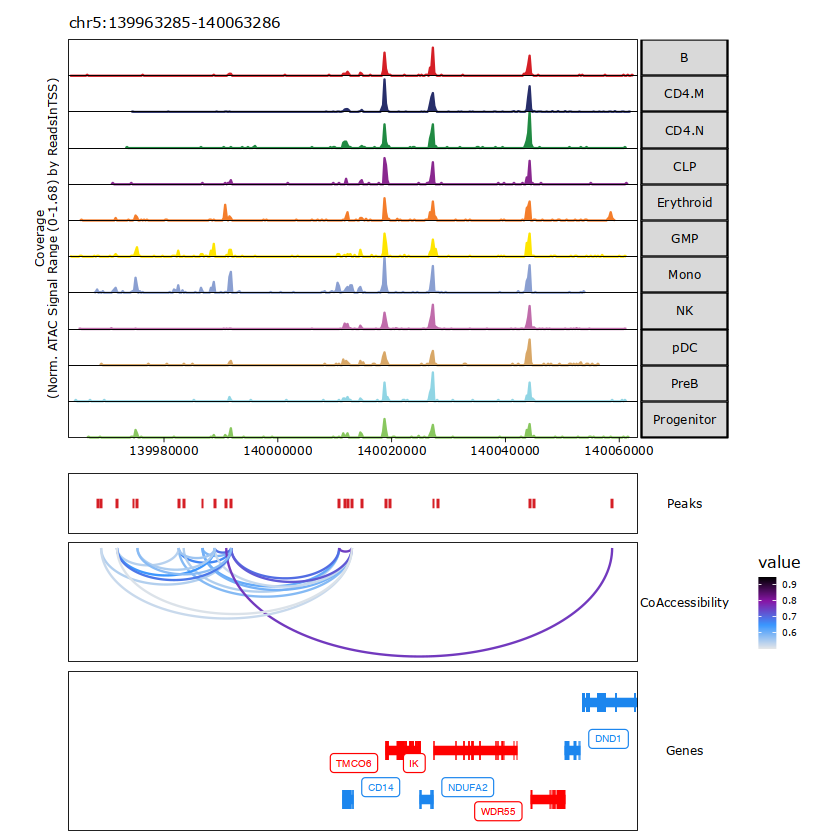

In [29]:
grid::grid.newpage()
grid::grid.draw(p$CD14)
plotPDF(plotList = p, 
    name = "Plot-Tracks-Marker-Genes-with-CoAccessibility.pdf", 
    ArchRProj = projHeme5, 
    addDOC = FALSE, width = 5, height = 5)

# PEAK2GENELinkage

Co-accessibility is an ATAC-seq-only analysis that looks for correlations in accessibility between two peaks while peak-to-gene linkage leverages integrated scRNA-seq data to look for correlations between peak accessibility and gene expression

In [30]:
#To identify peak-to-gene links in ArchR, we use the addPeak2GeneLinks() function.

projHeme5 <- addPeak2GeneLinks(
    ArchRProj = projHeme5,
    reducedDims = "IterativeLSI"
)

ArchR logging to : ArchRLogs/ArchR-addPeak2GeneLinks-aa3e52bce864-Date-2023-01-10_Time-16-30-01.log
If there is an issue, please report to github with logFile!

2023-01-10 16:30:01 : Getting Available Matrices, 0.002 mins elapsed.

2023-01-10 16:30:01 : Filtered Low Prediction Score Cells (1250 of 10250, 0.122), 0.001 mins elapsed.

2023-01-10 16:30:01 : Computing KNN, 0.005 mins elapsed.

2023-01-10 16:30:02 : Identifying Non-Overlapping KNN pairs, 0.006 mins elapsed.

2023-01-10 16:30:03 : Identified 494 Groupings!, 0.027 mins elapsed.

2023-01-10 16:30:03 : Getting Group RNA Matrix, 0.028 mins elapsed.

2023-01-10 16:30:43 : Getting Group ATAC Matrix, 0.692 mins elapsed.

2023-01-10 16:31:25 : Normalizing Group Matrices, 1.398 mins elapsed.

2023-01-10 16:31:30 : Finding Peak Gene Pairings, 1.487 mins elapsed.

2023-01-10 16:31:31 : Computing Correlations, 1.493 mins elapsed.

2023-01-10 16:31:48 : Completed Peak2Gene Correlations!, 1.775 mins elapsed.

ArchR logging successful to :

In [32]:
p2g <- getPeak2GeneLinks(
    ArchRProj = projHeme5,
    corCutOff = 0.45,
    resolution = 1,
    returnLoops = FALSE
)
p2g

DataFrame with 39361 rows and 6 columns
        idxATAC    idxRNA Correlation         FDR  VarQATAC   VarQRNA
      <integer> <integer>   <numeric>   <numeric> <numeric> <numeric>
1            48         4    0.516862 1.04847e-33  0.712354  0.266115
2            44         5    0.488137 1.18427e-29  0.869871  0.763615
3            45         5    0.557891 3.19046e-40  0.709285  0.763615
4            55         5    0.484464 3.66915e-29  0.940642  0.763615
5            66         5    0.481490 9.05963e-29  0.671570  0.763615
...         ...       ...         ...         ...       ...       ...
39357    144630     18590    0.510083 1.02909e-32  0.740440  0.962798
39358    144630     18591    0.481488 9.06479e-29  0.740440  0.953981
39359    144648     18593    0.451552 4.99786e-25  0.611597  0.394387
39360    144645     18595    0.514937 2.01758e-33  0.939681  0.447718
39361    144652     18595    0.591136 3.24986e-46  0.719191  0.447718

# Plotting on track browser

In [33]:
markerGenes  <- c(
    "CD34", #Early Progenitor
    "GATA1", #Erythroid
    "PAX5", "MS4A1", #B-Cell Trajectory
    "CD14", #Monocytes
    "CD3D", "CD8A", "TBX21", "IL7R" #TCells
  )

p <- plotBrowserTrack(
    ArchRProj = projHeme5, 
    groupBy = "Clusters2", 
    geneSymbol = markerGenes, 
    upstream = 50000,
    downstream = 50000,
    loops = getPeak2GeneLinks(projHeme5)
)

ArchR logging to : ArchRLogs/ArchR-plotBrowserTrack-aa3e703d27ab-Date-2023-01-10_Time-16-40-29.log
If there is an issue, please report to github with logFile!

2023-01-10 16:40:29 : Validating Region, 0.003 mins elapsed.



GRanges object with 9 ranges and 2 metadata columns:
      seqnames              ranges strand |     gene_id      symbol
         <Rle>           <IRanges>  <Rle> | <character> <character>
  [1]     chr1 208059883-208084683      - |         947        CD34
  [2]     chrX   48644982-48652717      + |        2623       GATA1
  [3]     chr9   36838531-37034476      - |        5079        PAX5
  [4]    chr11   60223282-60238225      + |         931       MS4A1
  [5]     chr5 140011313-140013286      - |         929        CD14
  [6]    chr11 118209789-118213459      - |         915        CD3D
  [7]     chr2   87011728-87035519      - |         925        CD8A
  [8]    chr17   45810610-45823485      + |       30009       TBX21
  [9]     chr5   35856977-35879705      + |        3575        IL7R
  -------
  seqinfo: 24 sequences from hg19 genome


2023-01-10 16:40:29 : Adding Bulk Tracks (1 of 9), 0.003 mins elapsed.

2023-01-10 16:40:30 : Adding Feature Tracks (1 of 9), 0.014 mins elapsed.

2023-01-10 16:40:30 : Adding Loop Tracks (1 of 9), 0.015 mins elapsed.

2023-01-10 16:40:30 : Adding Gene Tracks (1 of 9), 0.017 mins elapsed.

2023-01-10 16:40:30 : Plotting, 0.02 mins elapsed.

2023-01-10 16:40:31 : Adding Bulk Tracks (2 of 9), 0.036 mins elapsed.

2023-01-10 16:40:32 : Adding Feature Tracks (2 of 9), 0.043 mins elapsed.

2023-01-10 16:40:32 : Adding Loop Tracks (2 of 9), 0.043 mins elapsed.

2023-01-10 16:40:32 : Adding Gene Tracks (2 of 9), 0.045 mins elapsed.

2023-01-10 16:40:32 : Plotting, 0.049 mins elapsed.

2023-01-10 16:40:33 : Adding Bulk Tracks (3 of 9), 0.06 mins elapsed.

2023-01-10 16:40:33 : Adding Feature Tracks (3 of 9), 0.069 mins elapsed.

2023-01-10 16:40:33 : Adding Loop Tracks (3 of 9), 0.07 mins elapsed.

2023-01-10 16:40:33 : Adding Gene Tracks (3 of 9), 0.072 mins elapsed.

2023-01-10 16:40:34 : Pl

Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


Plotting Gtable!



NULL


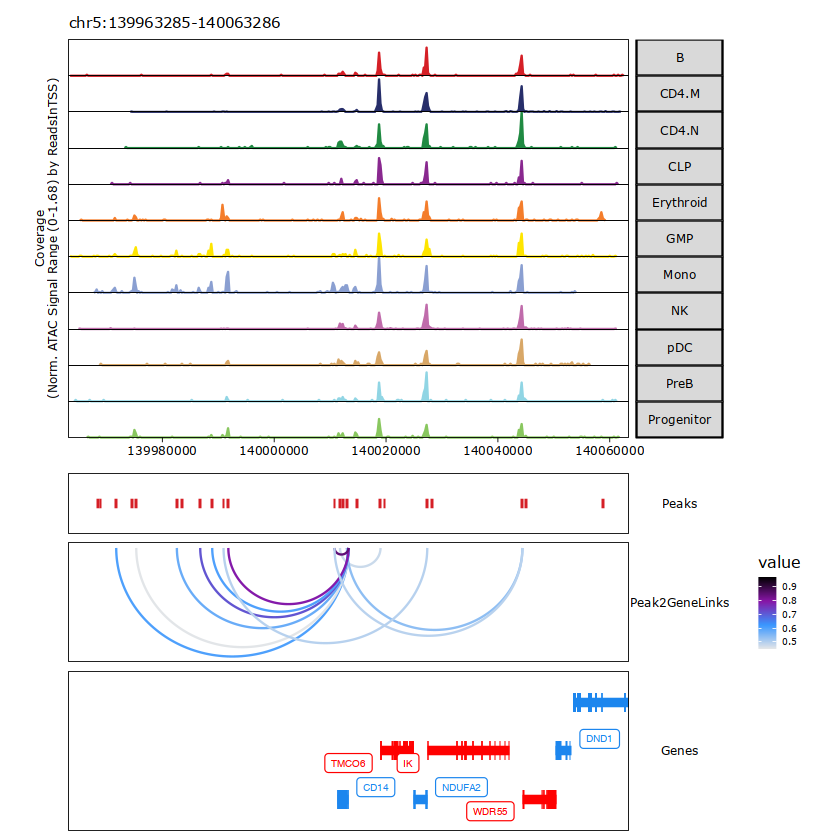

In [34]:
grid::grid.newpage()
grid::grid.draw(p$CD14)
plotPDF(plotList = p, 
    name = "Plot-Tracks-Marker-Genes-with-Peak2GeneLinks.pdf", 
    ArchRProj = projHeme5, 
    addDOC = FALSE, width = 5, height = 5)

# Plotting a heatmap 

In [35]:
p <- plotPeak2GeneHeatmap(ArchRProj = projHeme5, groupBy = "Clusters2")
p

ArchR logging to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-aa3e429a4f08-Date-2023-01-10_Time-16-42-54.log
If there is an issue, please report to github with logFile!

2023-01-10 16:42:58 : Determining KNN Groups!, 0.061 mins elapsed.

2023-01-10 16:43:03 : Ordering Peak2Gene Links!, 0.138 mins elapsed.

2023-01-10 16:43:16 : Constructing ATAC Heatmap!, 0.366 mins elapsed.

Warning message:
“package ‘circlize’ was built under R version 4.1.2”
Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

2023-01-10 16:43:17 : Constructing RNA Heatmap!, 0.374 mins elapsed.

Adding Annotations..

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotPeak2GeneHeatmap-aa3e429a4f08-Date-2023-01-10_Time-16-42-54.log



# Identification of TF regulators

# Step 1: Identify Deviant TF Motifs

In [36]:
#The first part of identifying positive TF regulators is identification of deviant TF motifs. 
#We performed this analysis in a previous chapter, creating a MotifMatrix of chromVAR deviations and 
#deviation z-scores for all motifs. 
seGroupMotif <- getGroupSE(ArchRProj = projHeme5, useMatrix = "MotifMatrix", groupBy = "Clusters2")

ArchR logging to : ArchRLogs/ArchR-getGroupSE-aa3eb75cc65-Date-2023-01-10_Time-17-01-08.log
If there is an issue, please report to github with logFile!

Getting Group Matrix

2023-01-10 17:01:14 : Successfully Created Group Matrix, 0.089 mins elapsed.

Normalizing by number of Cells

ArchR logging successful to : ArchRLogs/ArchR-getGroupSE-aa3eb75cc65-Date-2023-01-10_Time-17-01-08.log



In [37]:
#We can subset this SummarizedExperiment to just the deviation z-scores.

seZ <- seGroupMotif[rowData(seGroupMotif)$seqnames=="z",]

In [38]:
#Then we can identify the maximum delta in z-score between all clusters. 
#This will be helpful in stratifying motifs based on the degree of variation observed across clusters.

rowData(seZ)$maxDelta <- lapply(seq_len(ncol(seZ)), function(x){
  rowMaxs(assay(seZ) - assay(seZ)[,x])
}) %>% Reduce("cbind", .) %>% rowMaxs

# Step 2. Identify Correlated TF Motifs and TF Gene Score/Expression

To identify TFs whose motif accessibility is correlated with with their own gene activity (either by gene score or gene expression), we use the correlateMatrices() function and provide the two matrices that we are interested in, in this case the GeneScoreMatrix and the MotifMatrix.

In [39]:
corGSM_MM <- correlateMatrices(
    ArchRProj = projHeme5,
    useMatrix1 = "GeneScoreMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "IterativeLSI"
)

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-aa3e62be00c3-Date-2023-01-10_Time-17-02-17.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2023-01-10 17:02:18 : Testing 825 Mappings!, 0.02 mins elapsed.

2023-01-10 17:02:18 : Computing KNN, 0.02 mins elapsed.

2023-01-10 17:02:18 : Identifying Non-Overlapping KNN pairs, 0.022 mins elapsed.

2023-01-10 17:02:20 : Identified 494 Groupings!, 0.043 mins elapsed.

2023-01-10 17:02:20 : Getting Group Matrix 1, 0.052 mins elapsed.

2023-01-10 17:03:05 : Getting Group Matrix 2, 0.799 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlations...

2023-01-10 17:03:10 : 

Computing Correlation (250 o

In [40]:
corGSM_MM

DataFrame with 825 rows and 14 columns
    GeneScoreMatrix_name MotifMatrix_name        cor        padj        pval
             <character>      <character>  <numeric>   <numeric>   <numeric>
1                   HES4          HES4_95   0.107742 1.00000e+00 1.65934e-02
2                   HES5          HES5_98   0.359199 1.40897e-13 1.72246e-16
3                 PRDM16       PRDM16_211   0.360195 1.14771e-13 1.40307e-16
4                   TP73         TP73_705   0.571723 2.64471e-41 3.23314e-44
5               TP73-AS1         TP73_705  -0.169913 1.20979e-01 1.47896e-04
...                  ...              ...        ...         ...         ...
821                TFDP3        TFDP3_309 -0.1274137 1.00000e+00 4.56388e-03
822               ZNF75D       ZNF75D_272  0.0321037 1.00000e+00 4.76517e-01
823                 ZIC3         ZIC3_215  0.3044604 3.83635e-09 4.68992e-12
824                 SOX3         SOX3_759 -0.0836715 1.00000e+00 6.31349e-02
825                MECP2        MECP2

In [41]:
#We can perform the same analysis using the GeneIntegrationMatrix instead of the GeneScoreMatrix.

corGIM_MM <- correlateMatrices(
    ArchRProj = projHeme5,
    useMatrix1 = "GeneIntegrationMatrix",
    useMatrix2 = "MotifMatrix",
    reducedDims = "IterativeLSI"
)

ArchR logging to : ArchRLogs/ArchR-correlateMatrices-aa3e282434da-Date-2023-01-10_Time-17-21-20.log
If there is an issue, please report to github with logFile!

When accessing features from a matrix of class Sparse.Assays.Matrix it requires 1 seqname!
Continuing with first seqname 'z'!
If confused, try getFeatures(ArchRProj, 'MotifMatrix') to list out available seqnames for input!

2023-01-10 17:21:21 : Testing 798 Mappings!, 0.018 mins elapsed.

2023-01-10 17:21:21 : Computing KNN, 0.019 mins elapsed.

2023-01-10 17:21:22 : Identifying Non-Overlapping KNN pairs, 0.02 mins elapsed.

2023-01-10 17:21:23 : Identified 494 Groupings!, 0.042 mins elapsed.

2023-01-10 17:21:23 : Getting Group Matrix 1, 0.051 mins elapsed.

2023-01-10 17:22:12 : Getting Group Matrix 2, 0.868 mins elapsed.

Some entries in groupMat2 are less than 0, continuing without Log2 Normalization.
Most likely this assay is a deviations matrix.

Getting Correlations...

2023-01-10 17:22:18 : 

Computing Correlation (250 

In [42]:
corGIM_MM

DataFrame with 798 rows and 14 columns
    GeneIntegrationMatrix_name MotifMatrix_name       cor        padj
                   <character>      <character> <numeric>   <numeric>
1                         HES4          HES4_95 -0.172965 5.92909e-02
2                         HES5          HES5_98 -0.269878 5.75217e-07
3                       PRDM16       PRDM16_211  0.180408 2.92740e-02
4                         TP73         TP73_705  0.138278 1.00000e+00
5                         HES2          HES2_19 -0.264930 1.18013e-06
...                        ...              ...       ...         ...
794                      TFDP3        TFDP3_309        NA          NA
795                     ZNF75D       ZNF75D_272  0.257725 3.27430e-06
796                       ZIC3         ZIC3_215        NA          NA
797                       SOX3         SOX3_759        NA          NA
798                      MECP2        MECP2_645  0.661257 1.08398e-60
           pval GeneIntegrationMatrix_seqnames Gene

# Step 3: Add Maximum Delta Deviation to the Correlation Data Frame

For each of these correlation analyses, we can annotate each motif with the maximum delta observed between clusters which we calculated in Step 1.


In [43]:

corGSM_MM$maxDelta <- rowData(seZ)[match(corGSM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]
corGIM_MM$maxDelta <- rowData(seZ)[match(corGIM_MM$MotifMatrix_name, rowData(seZ)$name), "maxDelta"]

# Step 4: Identify Positive TF Regulators

We can use all of this information to identify positive TF regulators. In the examples below, we consider positive regulators as those TFs whose correlation between motif and gene score (or gene expression) is greater than 0.5 with an adjusted p-value less than 0.01 and a maximum inter-cluster difference in deviation z-score that is in the top quartile.

In [44]:
corGSM_MM <- corGSM_MM[order(abs(corGSM_MM$cor), decreasing = TRUE), ]
corGSM_MM <- corGSM_MM[which(!duplicated(gsub("\\-.*","",corGSM_MM[,"MotifMatrix_name"]))), ]
corGSM_MM$TFRegulator <- "NO"
corGSM_MM$TFRegulator[which(corGSM_MM$cor > 0.5 & corGSM_MM$padj < 0.01 & corGSM_MM$maxDelta > quantile(corGSM_MM$maxDelta, 0.75))] <- "YES"
sort(corGSM_MM[corGSM_MM$TFRegulator=="YES",1])

[1] "ASCL1"    "ATF1"     "ATOH1"    "ATOH8"    "BCL11A"   "CEBPA-DT"
 [7] "CEBPB"    "CEBPD"    "CREB1"    "CREB3L4"  "EBF1"     "EGR2"    
[13] "EOMES"    "ERF"      "ETS1"     "FUBP1"    "GABPA"    "GATA1"   
[19] "GATA2"    "GATA5"    "IRF1"     "JDP2"     "KLF11"    "KLF2"    
[25] "LEF1"     "LYL1"     "MITF"     "NEUROD1"  "NFE2"     "NFIA"    
[31] "NFIC"     "NFIX"     "NHLH1"    "PRDM1"    "RUNX2"    "SIX5"    
[37] "SMAD1"    "SMAD9"    "SP4"      "SPI1"     "SPIB"     "TAL1"    
[43] "TCF15"    "TFAP2C"   "TWIST1"   "YY1"

Warning message:
“Removed 7 rows containing missing values (`geom_point()`).”


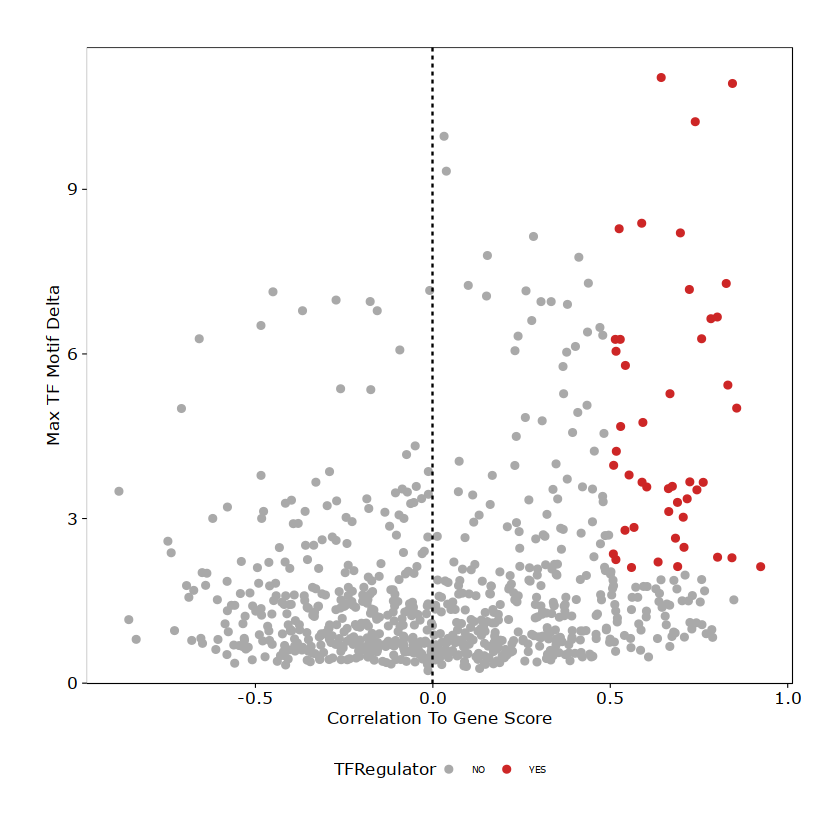

In [45]:
p <- ggplot(data.frame(corGSM_MM), aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Score") +
  ylab("Max TF Motif Delta") +
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGSM_MM$maxDelta)*1.05)
  )

p

[1] "BACH1" "CEBPA" "CEBPB" "CEBPD" "CEBPE" "CEBPG" "CTCF"  "EBF1"  "ELK1" 
[10] "EOMES" "ETS1"  "FOS"   "FOSL1" "FOSL2" "GATA1" "GATA2" "IRF1"  "IRF2" 
[19] "IRF3"  "IRF9"  "JDP2"  "KLF13" "KLF2"  "LEF1"  "MITF"  "NFE2"  "NFIA" 
[28] "NFIB"  "NFIX"  "NFKB2" "NR4A1" "NRF1"  "RUNX1" "RUNX2" "SPI1"  "TAL1" 
[37] "TCF12" "TCF3"  "TCF4"  "TEF"

Warning message:
“Removed 251 rows containing missing values (`geom_point()`).”


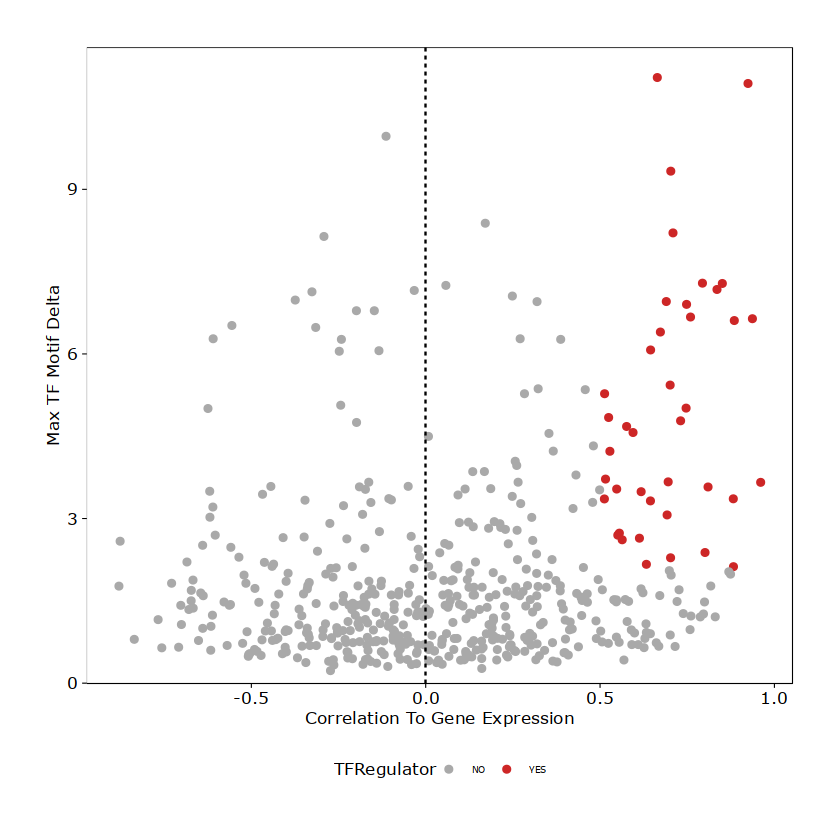

In [46]:
#We can perform the same analysis for the correlations derived from our GeneIntegrationMatrix.

corGIM_MM <- corGIM_MM[order(abs(corGIM_MM$cor), decreasing = TRUE), ]
corGIM_MM <- corGIM_MM[which(!duplicated(gsub("\\-.*","",corGIM_MM[,"MotifMatrix_name"]))), ]
corGIM_MM$TFRegulator <- "NO"
corGIM_MM$TFRegulator[which(corGIM_MM$cor > 0.5 & corGIM_MM$padj < 0.01 & corGIM_MM$maxDelta > quantile(corGIM_MM$maxDelta, 0.75))] <- "YES"
sort(corGIM_MM[corGIM_MM$TFRegulator=="YES",1])

p <- ggplot(data.frame(corGIM_MM), aes(cor, maxDelta, color = TFRegulator)) +
  geom_point() + 
  theme_ArchR() +
  geom_vline(xintercept = 0, lty = "dashed") + 
  scale_color_manual(values = c("NO"="darkgrey", "YES"="firebrick3")) +
  xlab("Correlation To Gene Expression") +
  ylab("Max TF Motif Delta") +
  scale_y_continuous(
    expand = c(0,0), 
    limits = c(0, max(corGIM_MM$maxDelta)*1.05)
  )

p

In [7]:
#setwd("Desktop/archr_tutorial/")
#save.image("archrtutorial.RData")
load("archrtutorial.RData")

# Chapter 16 Trajectory Analysis

In [8]:
p1 <- plotEmbedding(ArchRProj = projHeme5, colorBy = "cellColData", name = "Clusters", embedding = "UMAP")


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-13f1c37114dab-Date-2023-01-12_Time-11-11-27.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-13f1c37114dab-Date-2023-01-12_Time-11-11-27.log



In [9]:
p2 <- plotEmbedding(ArchRProj = projHeme5, colorBy = "cellColData", name = "Clusters2", embedding = "UMAP")


ArchR logging to : ArchRLogs/ArchR-plotEmbedding-13f1c510231cb-Date-2023-01-12_Time-11-11-33.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-13f1c510231cb-Date-2023-01-12_Time-11-11-33.log



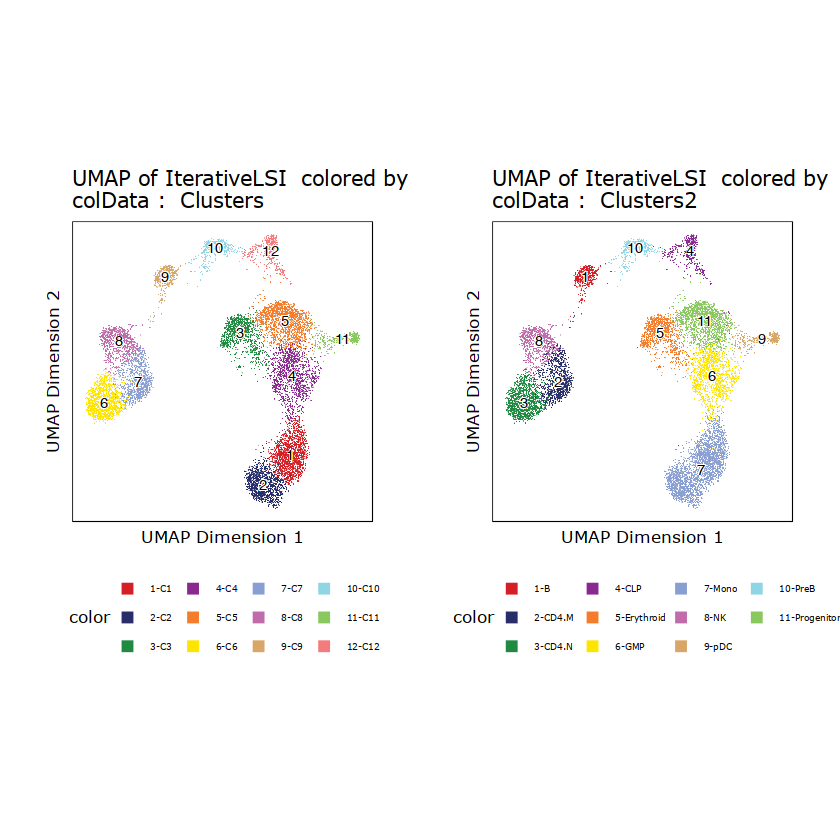

In [10]:
ggAlignPlots(p1, p2, type = "h")


In [11]:
# First step in creating a trajectory is to create a trajectory backbone in the form of an ordered vector of cell group labels.
trajectory <- c("Progenitor", "GMP", "Mono")
trajectory

[1] "Progenitor" "GMP"        "Mono"

In [12]:
#We use the addTrajectory() function to create a trajectory and we add this to our ArchRProject. 
projHeme5 <- addTrajectory(
    ArchRProj = projHeme5, 
    name = "MyeloidU", 
    groupBy = "Clusters2",
    trajectory = trajectory, 
    embedding = "UMAP", 
    force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addTrajectory-13f1c1cb2b94d-Date-2023-01-12_Time-11-25-10.log
If there is an issue, please report to github with logFile!

Filtering outliers

Initial Alignment Before Spline Fit

Spline Fit

KNN to Spline

ArchR logging successful to : ArchRLogs/ArchR-addTrajectory-13f1c1cb2b94d-Date-2023-01-12_Time-11-25-10.log



In [14]:
#We can look at this information and see that each cell has a unique pseudotime value between 0 and 100. 
#We exclude cells with NA values because these are not part of the trajectory.

head(projHeme5$MyeloidU[!is.na(projHeme5$MyeloidU)])

[1] 45.26041 51.03508 50.62105 42.51471 48.24581 45.76160

In [15]:
#we use colorBy = "cellColData" to tell ArchR to look within cellColData for the column specified by name - 
#in this case, the “MyeloidU” pseudo-time trajectory. 
#While it may seem conterintuitive to list “MyeloidU” for both trajectory and name, this is done because 
#trajectory tells ArchR which subset of cells we are interested in and name tells ArchR how to color that 
#subset of cells.
p <- plotTrajectory(projHeme5, trajectory = "MyeloidU", colorBy = "cellColData", name = "MyeloidU")

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-13f1c19a37cf3-Date-2023-01-12_Time-11-32-44.log
If there is an issue, please report to github with logFile!

Plotting

Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-13f1c19a37cf3-Date-2023-01-12_Time-11-32-44.log



In [16]:
p[[1]]

Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”


In [18]:
#plot the “MyeloidU” trajectory but color the cells by the gene score value of the CEBPB gene, a known regulator 
#of monocyte function that becomes active during the differentiation process. 

p1 <- plotTrajectory(projHeme5, trajectory = "MyeloidU", colorBy = "GeneScoreMatrix", name = "CEBPB", continuousSet = "horizonExtra")

#We can repeat this process but color the cells by their linked gene expression via the GeneIntegrationMatrix.
p2 <- plotTrajectory(projHeme5, trajectory = "MyeloidU", colorBy = "GeneIntegrationMatrix", name = "CEBPB", continuousSet = "blueYellow")

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-13f1c189c960d-Date-2023-01-12_Time-11-47-08.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-01-12 11:47:08 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting

Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-13f1c189c960d-Date-2023-01-12_Time-11-47-08.log

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-13f1c503f3c1a-Date-2023-01-12_Time-11-47-11.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2023-01-12 11:47:11 : 



Imputing Matrix

Using weights on disk

Using weights on disk

Plotting

Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”
Plotting Trajectory

Adding Infer

Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”
Warning message:
“Removed 5661 rows containing non-finite values (`stat_summary_hex()`).”
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


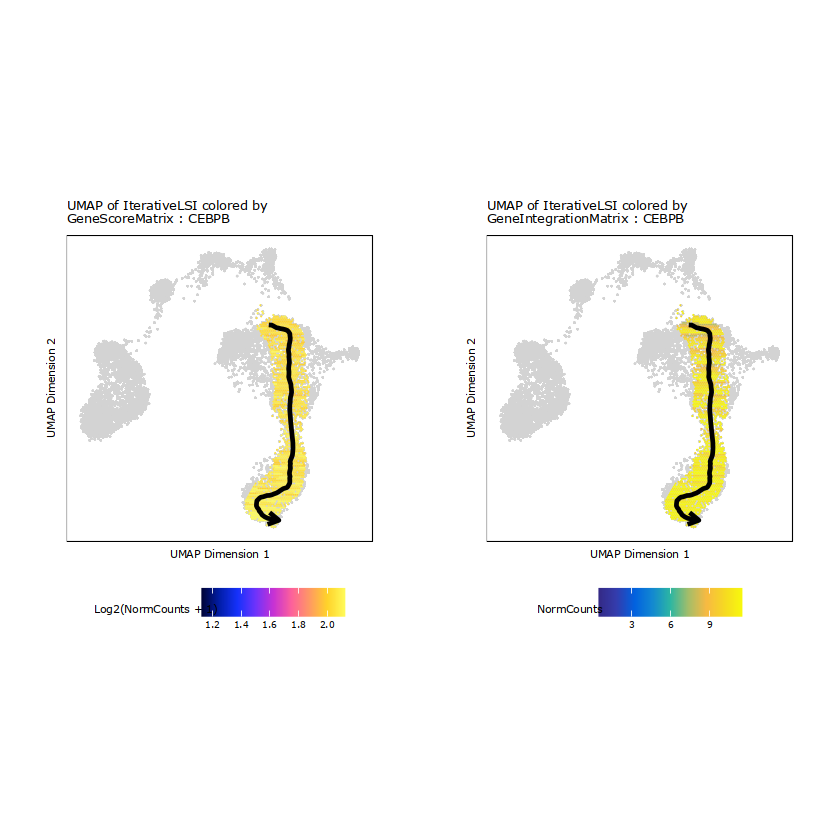

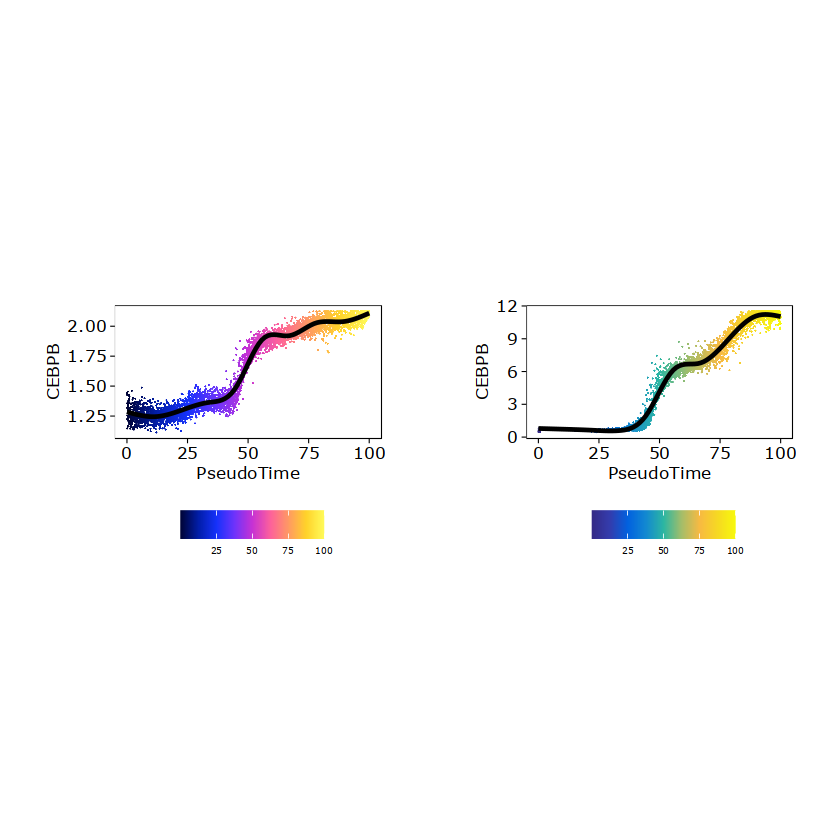

In [20]:
ggAlignPlots(p1[[1]], p2[[1]], type = "h")
ggAlignPlots(p1[[2]], p2[[2]], type = "h")

Creating Trajectory Group Matrix..

Some values are below 0, this could be a DeviationsMatrix in which scaleTo should be set = NULL.
Continuing without depth normalization!

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c28613c8b-Date-2023-01-12_Time-12-13-44.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2023-01-12 12:13:44 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2023-01-12 12:13:44 : 

Warning message:
“package ‘circlize’ was built under R version 4.1.2”
Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c28613c8b-Date-2023-01-12_Time-12-13-44.log



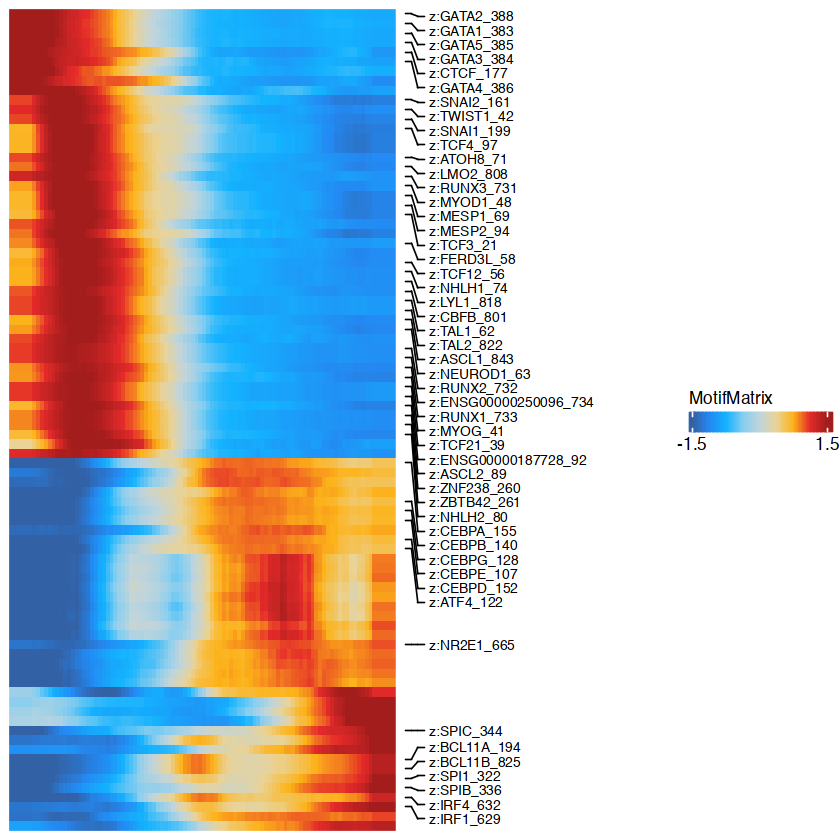

In [21]:
#Pseudo-time heatmap
trajMM  <- getTrajectory(ArchRProj = projHeme5, name = "MyeloidU", useMatrix = "MotifMatrix", log2Norm = FALSE)
p1 <- plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"))
p1

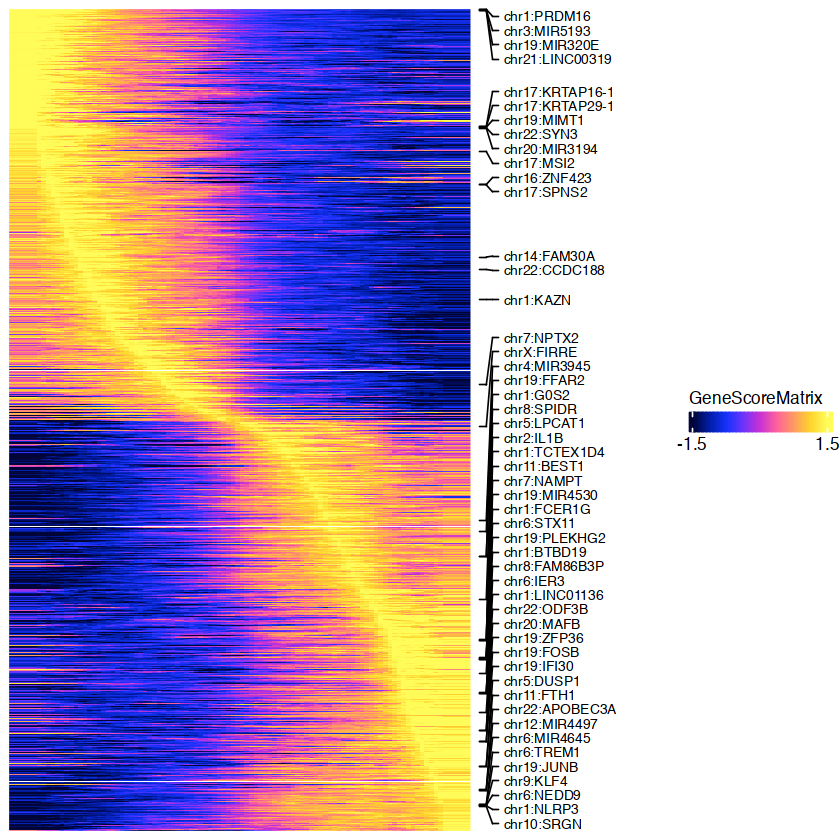

In [24]:
#We can perform the same steps to obtain a pseudo-time heatmap of gene scores by setting useMatrix = "GeneScoreMatrix".

trajGSM <- getTrajectory(ArchRProj = projHeme5, name = "MyeloidU", useMatrix = "GeneScoreMatrix", log2Norm = TRUE)
p2 <- plotTrajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"))
#trajectoryHeatmap function in tutorial is not working. Use plotTrajectoryHeatmap instead 
p2

In [48]:
##We can perform the same steps to obtain a pseudo-time heatmap of GeneIntegrationMatrix

trajGIM <- getTrajectory(ArchRProj = projHeme5, name = "MyeloidU", useMatrix = "GeneIntegrationMatrix", log2Norm = FALSE)
## Creating Trajectory Group Matrix..
## Smoothing…

p3 <- plotTrajectoryHeatmap(trajGIM,  pal = paletteContinuous(set = "blueYellow"))

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c4d1a7a7d-Date-2023-01-12_Time-13-22-41.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c4d1a7a7d-Date-2023-01-12_Time-13-22-41.log



In [25]:
#Lastly, we can obtain a pseudo-time heatmap of peak accessibility by setting useMatrix = "PeakMatrix".

trajPM  <- getTrajectory(ArchRProj = projHeme5, name = "MyeloidU", useMatrix = "PeakMatrix", log2Norm = TRUE)
p4 <- plotTrajectoryHeatmap(trajPM, pal = paletteContinuous(set = "solarExtra"))
p4

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c743d7efa-Date-2023-01-12_Time-12-33-31.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c743d7efa-Date-2023-01-12_Time-12-33-31.log



In [49]:
plotPDF(p1, p2,p3, p4, name = "Plot-MyeloidU-Traj-Heatmaps.pdf", ArchRProj = projHeme5, addDOC = FALSE, width = 6, height = 8)


Plotting ComplexHeatmap!

Plotting ComplexHeatmap!

Plotting ComplexHeatmap!

Plotting ComplexHeatmap!



# Integrative pseudo-time analyses
identification of positive TF regulators by integration of gene scores / gene expression with motif accessibility across pseudo-time

In [27]:
corGSM_MM <- correlateTrajectories(trajGSM, trajMM)


ArchR logging to : ArchRLogs/ArchR-correlateTrajectories-13f1c8ac4a69-Date-2023-01-12_Time-12-50-08.log
If there is an issue, please report to github with logFile!

Found 38 Correlated Pairings!

2023-01-12 12:50:18 : 



In [28]:
corGSM_MM[[1]]


DataFrame with 38 rows and 12 columns
         idx1      idx2 matchname1 matchname2       name1        name2
    <integer> <integer>    <array>    <array> <character>  <character>
1          82      1081     PRDM16     PRDM16 chr1:PRDM16 z:PRDM16_211
2         731       932       TAL1       TAL1   chr1:TAL1    z:TAL1_62
3         818      1013        JUN        JUN    chr1:JUN    z:JUN_143
4        2034      1002       ATF3       ATF3   chr1:ATF3   z:ATF3_132
5        2369      1254      GATA3      GATA3 chr10:GATA3  z:GATA3_384
...       ...       ...        ...        ...         ...          ...
34      20780      1031      SNAI2      SNAI2  chr8:SNAI2  z:SNAI2_161
35      21036      1696      KLF10      KLF10  chr8:KLF10  z:KLF10_826
36      21658      1003      NFIL3      NFIL3  chr9:NFIL3  z:NFIL3_133
37      21793      1078       KLF4       KLF4   chr9:KLF4   z:KLF4_208
38      22097      1565       RXRA       RXRA   chr9:RXRA   z:RXRA_695
    Correlation VarAssay1 VarAssay2    

In [39]:
#We can then subset our corresponding trajectory SummarizedExperiment objects to only contain the elements 
#that passed significance above.

trajGSM2 <- trajGSM[corGSM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGSM_MM[[1]]$name2, ]
trajGSM2
trajMM2

class: SummarizedExperiment 
dim: 38 100 
metadata(1): Params
assays(2): smoothMat mat
rownames(38): chr1:PRDM16 chr1:TAL1 ... chr9:KLF4 chr9:RXRA
rowData names(6): seqnames start ... name idx
colnames(100): T.0_1 T.1_2 ... T.98_99 T.99_100
colData names(0):

class: SummarizedExperiment 
dim: 38 100 
metadata(1): Params
assays(2): smoothMat mat
rownames(38): z:PRDM16_211 z:TAL1_62 ... z:KLF4_208 z:RXRA_695
rowData names(3): seqnames idx name
colnames(100): T.0_1 T.1_2 ... T.98_99 T.99_100
colData names(0):

In [42]:
trajCombined <- trajGSM2
assay(trajCombined, withDimnames = FALSE) <- t(apply(assay(trajGSM2,withDimnames = FALSE), 1, scale)) + t(apply(assay(trajMM2, withDimnames = FALSE), 1, scale))
#the code in the tutorial is not working unless you include withDimnames = FALSE.
#try their code, if it is not working, then try with withDimnames = FALSE

In [43]:
combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)


ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c674937f1-Date-2023-01-12_Time-13-16-32.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c674937f1-Date-2023-01-12_Time-13-16-32.log



ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c77f7e430-Date-2023-01-12_Time-13-19-01.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c77f7e430-Date-2023-01-12_Time-13-19-01.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c33a648d8-Date-2023-01-12_Time-13-19-02.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2023-01-12 13:19:02 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2023-01-12 13:19:02 : 

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plo

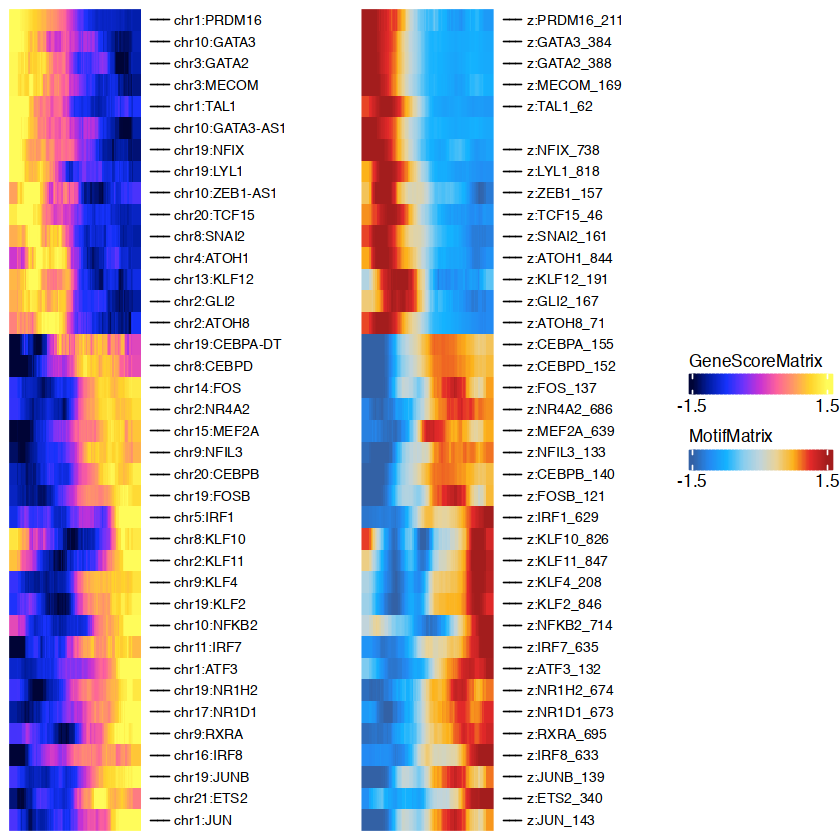

In [45]:
rowOrder <- match(rownames(combinedMat), rownames(trajGSM2))
#First, we will create the heatmap for the gene score trajectory. 
ht1 <- plotTrajectoryHeatmap(trajGSM2,  pal = paletteContinuous(set = "horizonExtra"),  varCutOff = 0, rowOrder = rowOrder)
#Then, we will create the heatmap for the motif trajectory, again specifying the row order via the rowOrder parameter
ht2 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder)
ht1+ht2

ArchR logging to : ArchRLogs/ArchR-correlateTrajectories-13f1c17248c0-Date-2023-01-12_Time-13-23-29.log
If there is an issue, please report to github with logFile!

Found 44 Correlated Pairings!

2023-01-12 13:23:37 : 

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c760635fd-Date-2023-01-12_Time-13-23-37.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c760635fd-Date-2023-01-12_Time-13-23-37.log

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-13f1c11c2b194-Date-2023-01-12_Time-13-23-37.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successfu

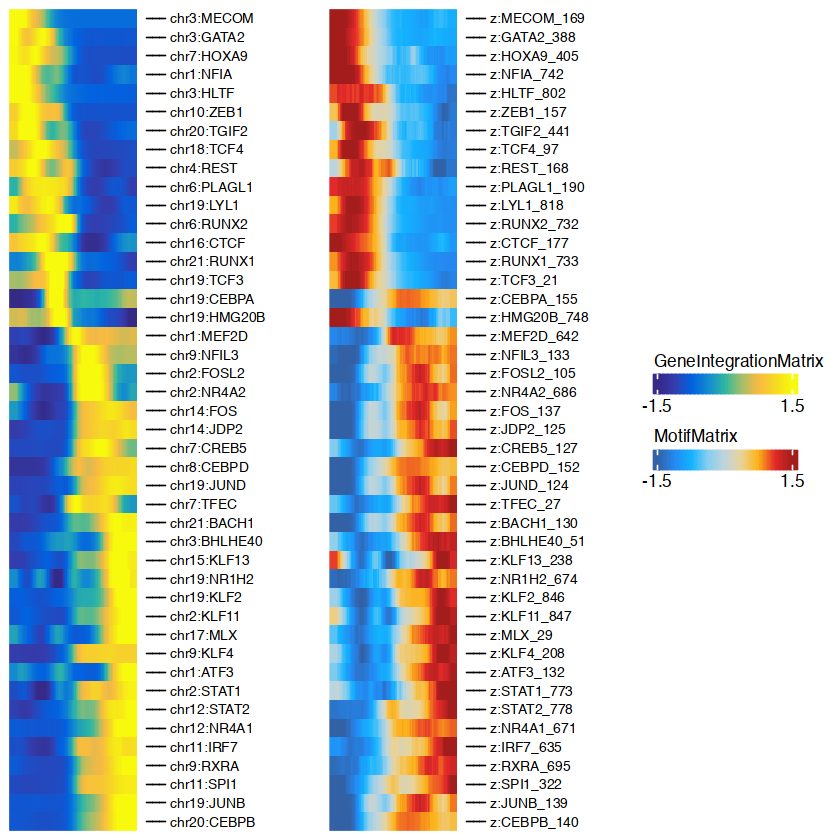

In [50]:
#We can repeat this same exact process but use gene expression from the GeneIntegrationMatrix instead of 
#gene scores.
corGIM_MM <- correlateTrajectories(trajGIM, trajMM)
trajGIM2 <- trajGIM[corGIM_MM[[1]]$name1, ]
trajMM2 <- trajMM[corGIM_MM[[1]]$name2, ]

trajCombined <- trajGIM2
assay(trajCombined, withDimnames = FALSE) <- t(apply(assay(trajGIM2, withDimnames = FALSE), 1, scale)) + t(apply(assay(trajMM2, withDimnames = FALSE), 1, scale))

combinedMat <- plotTrajectoryHeatmap(trajCombined, returnMat = TRUE, varCutOff = 0)

rowOrder <- match(rownames(combinedMat), rownames(trajGIM2))
ht1 <- plotTrajectoryHeatmap(trajGIM2,  pal = paletteContinuous(set = "blueYellow"),  varCutOff = 0, rowOrder = rowOrder)
ht2 <- plotTrajectoryHeatmap(trajMM2, pal = paletteContinuous(set = "solarExtra"), varCutOff = 0, rowOrder = rowOrder)
ht1 + ht2


# Chapter 3.2: Manipulate ArchRProject

In [23]:
#We can access the cell names associated with each cell:
head(projHeme1$cellNames)

[1] "scATAC_BMMC_R1#TTATGTCAGTGATTAG-1" "scATAC_BMMC_R1#AAGATAGTCACCGCGA-1"
[3] "scATAC_BMMC_R1#GCATTGAAGATTCCGT-1" "scATAC_BMMC_R1#TATGTTCAGGGTTCCC-1"
[5] "scATAC_BMMC_R1#TCCATCGGTCCCGTGA-1" "scATAC_BMMC_R1#AGTTACGAGAACGTCG-1"

In [24]:
#We can access the sample names associated with each cell:
head(projHeme1$Sample)

[1] "scATAC_BMMC_R1" "scATAC_BMMC_R1" "scATAC_BMMC_R1" "scATAC_BMMC_R1"
[5] "scATAC_BMMC_R1" "scATAC_BMMC_R1"

In [25]:
#We can access the TSS Enrichment Scores for each cell:
quantile(projHeme1$TSSEnrichment)

0%      25%      50%      75%     100% 
 4.10900 13.92550 16.81500 19.93025 41.98000

In [ ]:
#Subsetting an ArchRProject by cells

In [26]:
projHeme1[1:100, ] #first 100 cells in the project 


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 100
medianTSS(1): 10.794
medianFrags(1): 10200.5

In [27]:
#We can subset the project based on certain cell names:
projHeme1[projHeme1$cellNames[1:100], ]


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 100
medianTSS(1): 10.794
medianFrags(1): 10200.5

In [28]:
#We can subset the project to keep all cells corresponding to a specific sample:
idxSample <- BiocGenerics::which(projHeme1$Sample %in% "scATAC_BMMC_R1")
cellsSample <- projHeme1$cellNames[idxSample]
projHeme1[cellsSample, ]


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 4932
medianTSS(1): 15.2575
medianFrags(1): 2771

In [29]:
#We can subset the project to only keep cells that meet a specific cutoff for the TSS enrichment score:
idxPass <- which(projHeme1$TSSEnrichment >= 8)
cellsPass <- projHeme1$cellNames[idxPass]
projHeme1[cellsPass, ]


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /Users/mydir/Desktop/archr_tutorial/HemeTutorial 
samples(3): scATAC_BMMC_R1 scATAC_CD34_BMMC_R1 scATAC_PBMC_R1
sampleColData names(1): ArrowFiles
cellColData names(15): Sample TSSEnrichment ... DoubletEnrichment
  BlacklistRatio
numberOfCells(1): 10499
medianTSS(1): 16.899
medianFrags(1): 3042

In [30]:
#we can add a column to cellColData that contains more legible sample names by removing excess info 
#from the original sample names:
bioNames <- gsub("_R2|_R1|scATAC_","",projHeme1$Sample)
head(bioNames)

[1] "BMMC" "BMMC" "BMMC" "BMMC" "BMMC" "BMMC"

In [33]:
#One way to add a column called to cellColData is by directly using the $ accessor.
projHeme1$bioNames <- bioNames


In [34]:
#Alternatively, we can add a column to cellColData using the addCellColData() function. ArchR allows for the addition of columns that only contain information for a subset of cells.
bioNames <- bioNames[1:10]
cellNames <- projHeme1$cellNames[1:10]
projHeme1 <- addCellColData(ArchRProj = projHeme1, data = paste0(bioNames),
    cells = cellNames, name = "bioNames2")
getCellColData(projHeme1, select = c("bioNames", "bioNames2"))


DataFrame with 10660 rows and 2 columns
                                     bioNames   bioNames2
                                  <character> <character>
scATAC_BMMC_R1#TTATGTCAGTGATTAG-1        BMMC        BMMC
scATAC_BMMC_R1#AAGATAGTCACCGCGA-1        BMMC        BMMC
scATAC_BMMC_R1#GCATTGAAGATTCCGT-1        BMMC        BMMC
scATAC_BMMC_R1#TATGTTCAGGGTTCCC-1        BMMC        BMMC
scATAC_BMMC_R1#TCCATCGGTCCCGTGA-1        BMMC        BMMC
...                                       ...         ...
scATAC_PBMC_R1#GCTGCGAAGATCCGAG-1        PBMC          NA
scATAC_PBMC_R1#GCAGCTGGTGGCCTTG-1        PBMC          NA
scATAC_PBMC_R1#GCAGATTGTACGCAAG-1        PBMC          NA
scATAC_PBMC_R1#TTCGTTACATTGAACC-1        PBMC          NA
scATAC_PBMC_R1#CGCTATCGTGAGGTCA-1        PBMC          NA

In [35]:
#Retrieve a column by name, such as the number of unique nuclear (i.e. non-mitochondrial) fragments per cell:
df <- getCellColData(projHeme1, select = "nFrags")
df

DataFrame with 10660 rows and 1 column
                                     nFrags
                                  <numeric>
scATAC_BMMC_R1#TTATGTCAGTGATTAG-1     26189
scATAC_BMMC_R1#AAGATAGTCACCGCGA-1     20648
scATAC_BMMC_R1#GCATTGAAGATTCCGT-1     18990
scATAC_BMMC_R1#TATGTTCAGGGTTCCC-1     18296
scATAC_BMMC_R1#TCCATCGGTCCCGTGA-1     17458
...                                     ...
scATAC_PBMC_R1#GCTGCGAAGATCCGAG-1      1038
scATAC_PBMC_R1#GCAGCTGGTGGCCTTG-1      1037
scATAC_PBMC_R1#GCAGATTGTACGCAAG-1      1033
scATAC_PBMC_R1#TTCGTTACATTGAACC-1      1033
scATAC_PBMC_R1#CGCTATCGTGAGGTCA-1      1002

In [36]:
#Plotting QC metrics - log10(Unique Fragments) vs TSS enrichment score
df <- getCellColData(projHeme1, select = c("log10(nFrags)", "TSSEnrichment"))
df

DataFrame with 10660 rows and 2 columns
                                  log10(nFrags) TSSEnrichment
                                      <numeric>     <numeric>
scATAC_BMMC_R1#TTATGTCAGTGATTAG-1       4.41812         7.204
scATAC_BMMC_R1#AAGATAGTCACCGCGA-1       4.31488         7.949
scATAC_BMMC_R1#GCATTGAAGATTCCGT-1       4.27852         4.447
scATAC_BMMC_R1#TATGTTCAGGGTTCCC-1       4.26236         6.941
scATAC_BMMC_R1#TCCATCGGTCCCGTGA-1       4.24199         4.771
...                                         ...           ...
scATAC_PBMC_R1#GCTGCGAAGATCCGAG-1       3.01620        24.257
scATAC_PBMC_R1#GCAGCTGGTGGCCTTG-1       3.01578        22.537
scATAC_PBMC_R1#GCAGATTGTACGCAAG-1       3.01410        19.888
scATAC_PBMC_R1#TTCGTTACATTGAACC-1       3.01410        30.000
scATAC_PBMC_R1#CGCTATCGTGAGGTCA-1       3.00087        21.287

#Plot the number of unique nuclear fragments (log10) by the TSS enrichment score. 

This type of plot is key for identifying high quality cells. You’ll notice that the cutoffs that we previously specified when creating the Arrow files (via filterTSS and filterFrags) have already removed low quality cells. However, if we noticed that the previously applied QC filters were not adequate for this sample, we could further adjust our cutoffs based on this plot or re-generate the Arrow files if needed.


Plotting Ggplot!



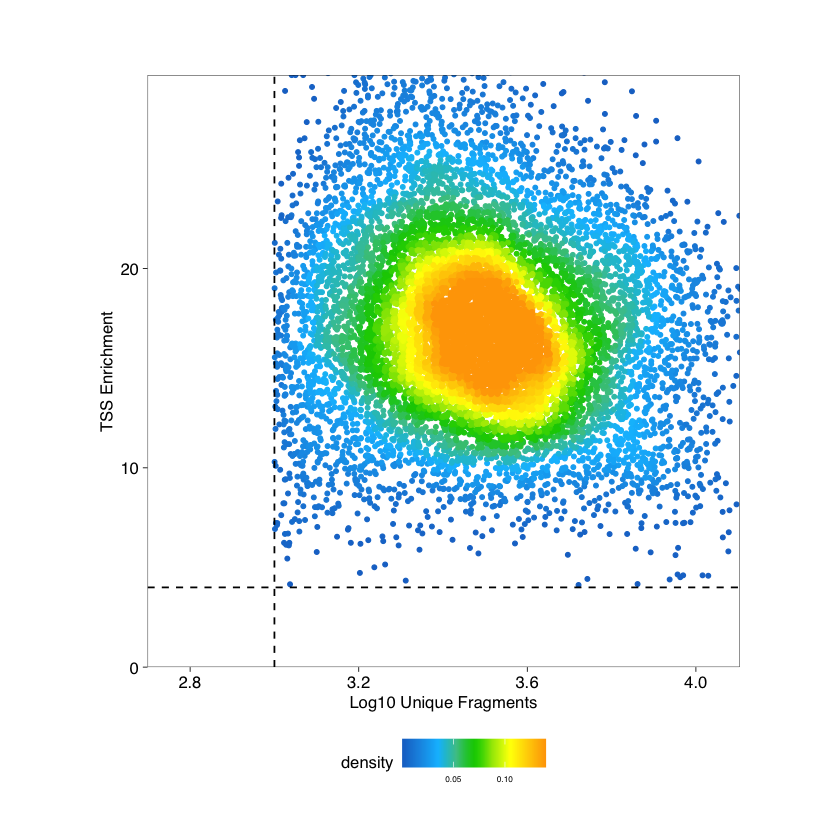

In [38]:

p <- ggPoint(
    x = df[,1], 
    y = df[,2], 
    colorDensity = TRUE,
    continuousSet = "sambaNight",
    xlabel = "Log10 Unique Fragments",
    ylabel = "TSS Enrichment",
    xlim = c(log10(500), quantile(df[,1], probs = 0.99)),
    ylim = c(0, quantile(df[,2], probs = 0.99))
) + geom_hline(yintercept = 4, lty = "dashed") + geom_vline(xintercept = 3, lty = "dashed")

p
plotPDF(p, name = "TSS-vs-Frags.pdf", ArchRProj = projHeme1, addDOC = FALSE)


# Plotting statistics 

1 


Picking joint bandwidth of 0.9

1 




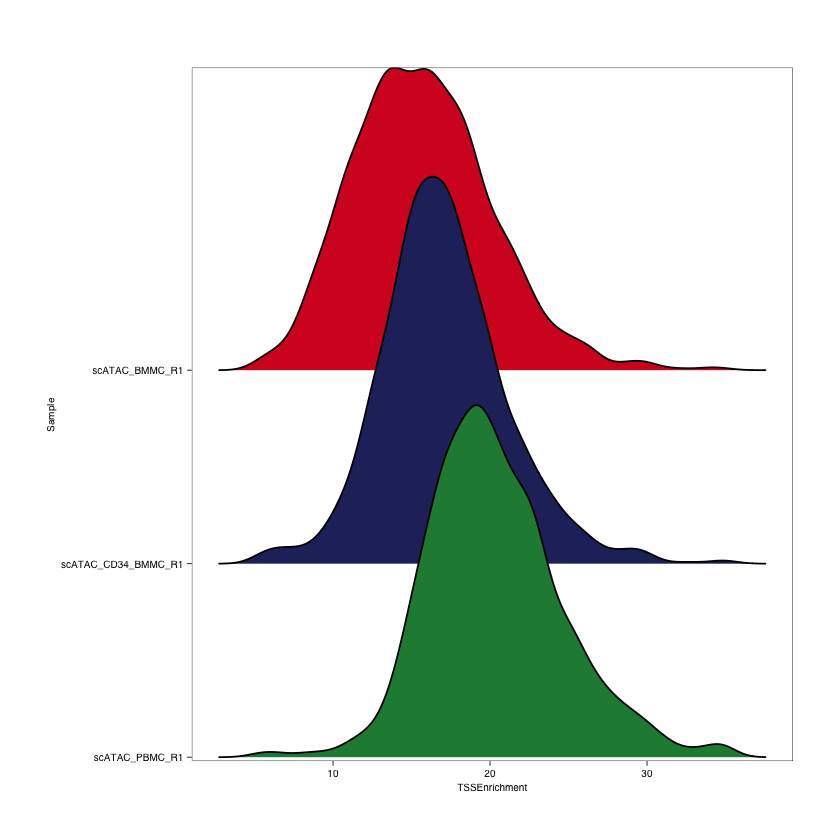

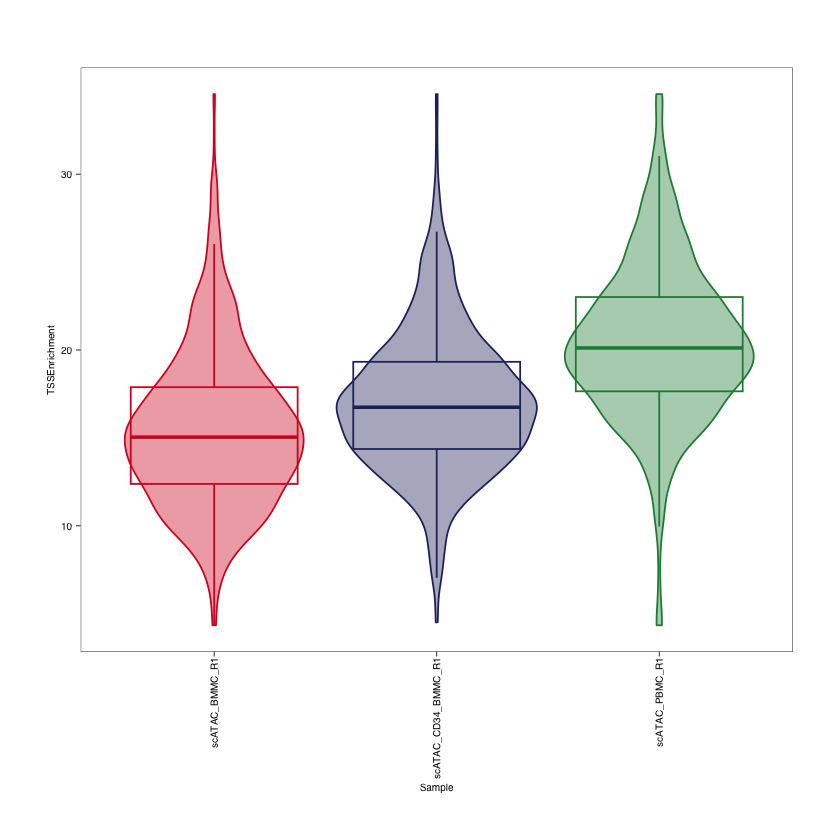

In [40]:
#Make a violin and ridge plot for each sample for the TSS enrichment scores

p1 <- plotGroups(
    ArchRProj = projHeme1, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "ridges"
   )
p1
p2 <- plotGroups(
    ArchRProj = projHeme1, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "TSSEnrichment",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
p2

1 


Picking joint bandwidth of 0.0519

1 




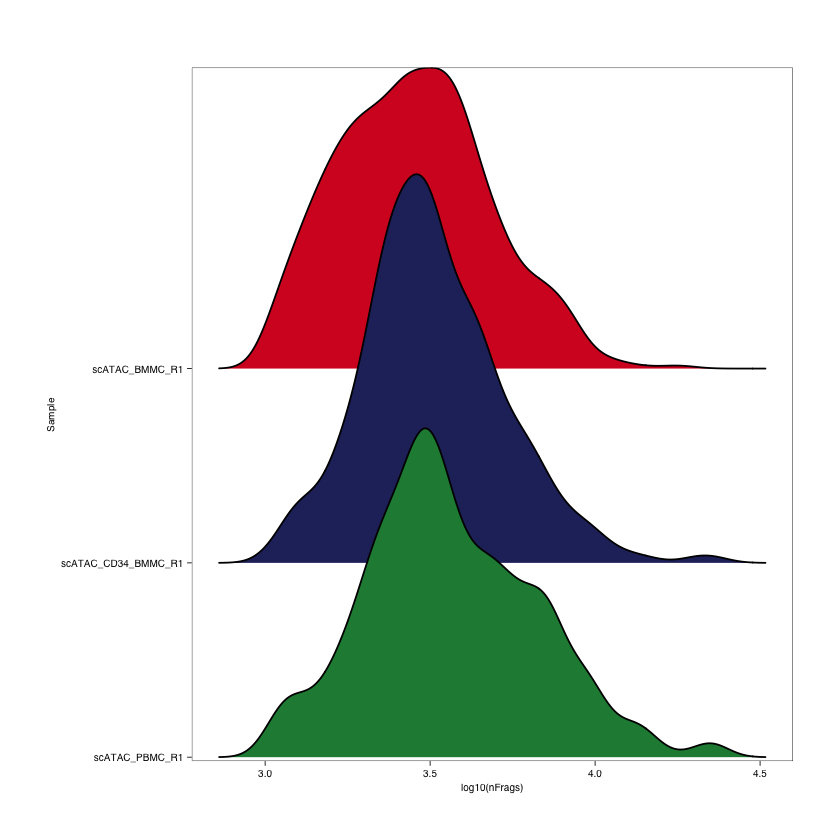

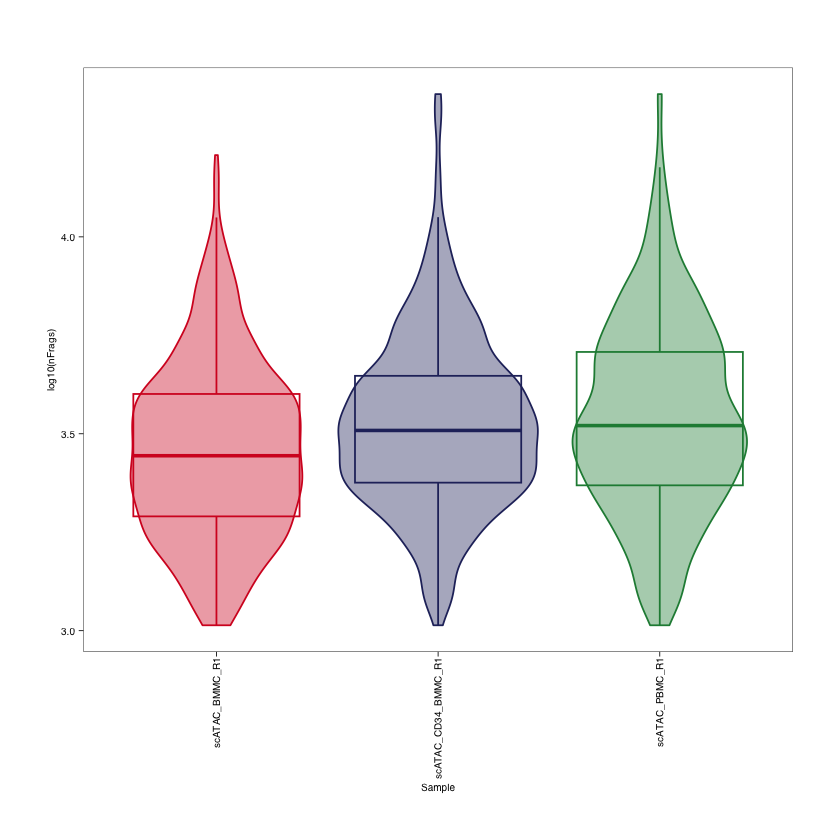

In [41]:
#Make violing and ridge plot for each sample for the log10(unique nuclear fragments).
p3 <- plotGroups(
    ArchRProj = projHeme1, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "ridges"
   )
p3
p4 <- plotGroups(
    ArchRProj = projHeme1, 
    groupBy = "Sample", 
    colorBy = "cellColData", 
    name = "log10(nFrags)",
    plotAs = "violin",
    alpha = 0.4,
    addBoxPlot = TRUE
   )
p4


In [ ]:
#Plotting Sample Fragment Size Distribution and TSS Enrichment Profiles

Because of how the data is stored and accessed, ArchR can compute fragment size distributions and TSS enrichment profiles from Arrow files very quickly.

Fragment size distributions To plot the fragment size distributions of all samples, we use the plotFragmentSizes() function. 

ArchR logging to : ArchRLogs/ArchR-plotFragmentSizes-6588cdcff28-Date-2023-01-06_Time-15-57-45.log
If there is an issue, please report to github with logFile!

ArchR logging successful to : ArchRLogs/ArchR-plotFragmentSizes-6588cdcff28-Date-2023-01-06_Time-15-57-45.log



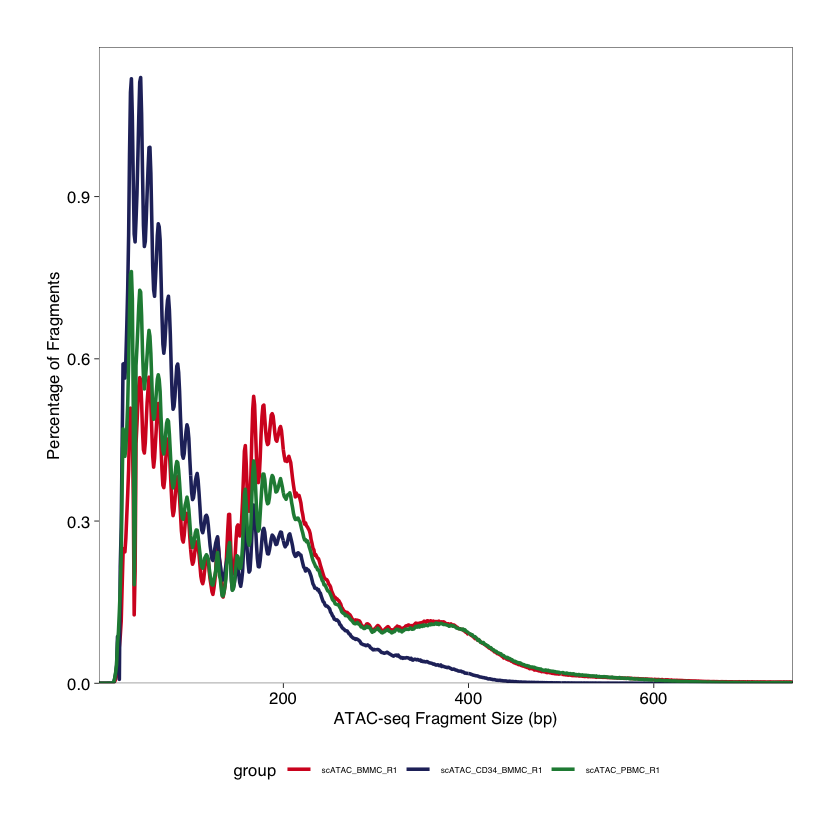

In [42]:
p1 <- plotFragmentSizes(ArchRProj = projHeme1)
p1

# Fragment size distributions in ATAC-seq can be quite variable across samples, cell types, and batches. 
#Slight differences like those shown below are common and do not necessarily correlate with differences 
#in data quality.

#Plot TSSEnrichment 

TSS enrichment profiles should show a clear peak in the center and a smaller shoulder peak right-of-center which is caused by the well-positioned +1 nucleosome.

ArchR logging to : ArchRLogs/ArchR-plotTSSEnrichment-65883fc11180-Date-2023-01-06_Time-16-05-07.log
If there is an issue, please report to github with logFile!

ArchR logging successful to : ArchRLogs/ArchR-plotTSSEnrichment-65883fc11180-Date-2023-01-06_Time-16-05-07.log



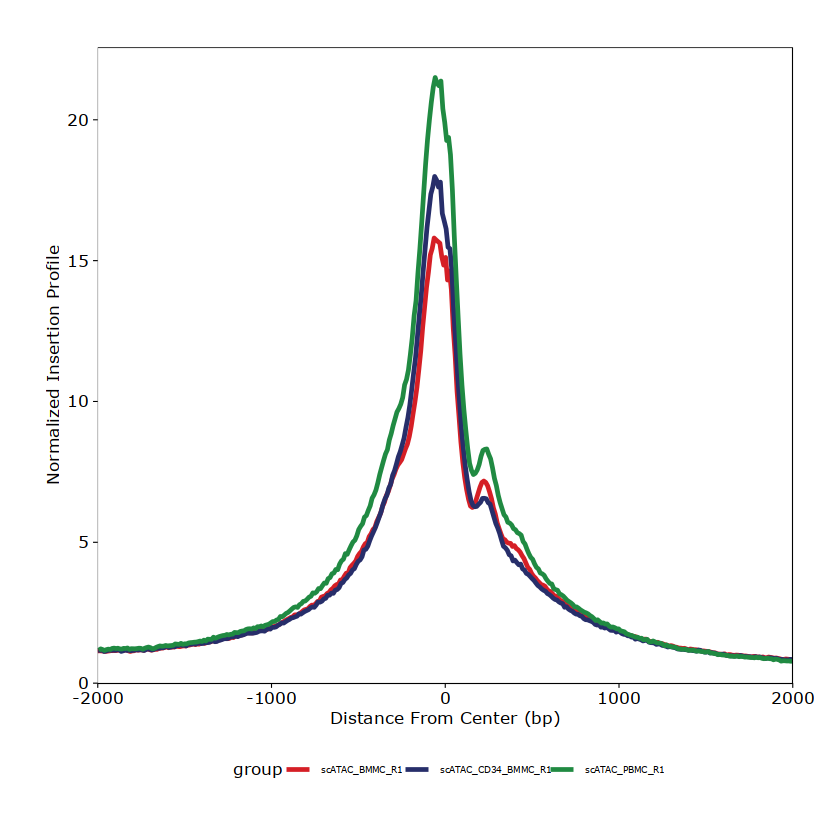

In [47]:
p2<- plotTSSEnrichment(ArchRProj = projHeme1)
p2 

# I got an error : 
#Error in grid.Call(L_textBounds, as.graphicsAnnot(x$label), x$x, x$y, : Polygon edge not found
#I need to download xQuartz as they suggested here https://www.archrproject.com/
#After installation, it worked 

In [48]:
plotPDF(p1,p2, name = "QC-Sample-FragSizes-TSSProfile.pdf", ArchRProj = projHeme1, addDOC = FALSE, width = 5, height = 5)


Plotting Ggplot!

Plotting Ggplot!



# Save ArchRproject 

In [49]:
saveArchRProject(ArchRProj = projHeme1, outputDirectory = "Save-ProjHeme1", load = FALSE)

#This will copy the Arrow files and save a .RDS file of the projHeme1 ArchRProject object in the specified 
#outputDirectory

Copying ArchRProject to new outputDirectory : /Users/mydir/Desktop/archr_tutorial/Save-ProjHeme1

Copying Arrow Files...

Copying Arrow Files (1 of 3)

Copying Arrow Files (2 of 3)

Copying Arrow Files (3 of 3)

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 1): Plots

Saving ArchRProject...



In [51]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Big Sur 10.16

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRblas.0.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.1/Resources/lib/libRlapack.dylib

Random number generation:
 RNG:     L'Ecuyer-CMRG 
 Normal:  Inversion 
 Sample:  Rejection 
 
locale:
[1] en_CA.UTF-8/en_CA.UTF-8/en_CA.UTF-8/C/en_CA.UTF-8/en_CA.UTF-8

attached base packages:
 [1] parallel  grid      stats4    stats     graphics  grDevices utils    
 [8] datasets  methods   base     

other attached packages:
 [1] circlize_0.4.15                   ComplexHeatmap_2.10.0            
 [3] hexbin_1.28.2                     SeuratObject_4.1.3               
 [5] Seurat_4.3.0                      rhdf5_2.38.1                     
 [7] SummarizedExperiment_1.24.0       Biobase_2.54.0                   
 [9] MatrixGenerics_1.6.0              Rcpp_1.0.9                       
[11